In [1]:
from botorch.models.model_list_gp_regression import ModelListGP
from botorch.models.transforms.outcome import Standardize
from gpytorch.mlls.sum_marginal_log_likelihood import SumMarginalLogLikelihood
from botorch.utils.transforms import unnormalize, normalize
from botorch.utils.sampling import draw_sobol_samples
from botorch.acquisition import AcquisitionFunction
from botorch.models import SingleTaskGP
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch import fit_gpytorch_mll
from botorch.test_functions.multi_objective import DTLZ2, GMM, ZDT2, VehicleSafety, Penicillin, CarSideImpact
import torch
tkwargs = {
    "dtype": torch.double,
    "device": torch.device("cpu"),
}

NOISE_SE = torch.tensor([0.00, 0.00], **tkwargs)
#NOISE_SE = torch.tensor([0.00, 0.00, 0.00], **tkwargs)
#problem = DTLZ2(num_objectives=3, dim=4, negate=True).to(**tkwargs)
#problem = CarSideImpact(negate=True).to(**tkwargs)
#problem = ZDT2(dim=6, negate=True).to(**tkwargs)
#problem = VehicleSafety(negate=True).to(**tkwargs)
problem = GMM(negate=True).to(**tkwargs)
def initialize_model(train_x, train_obj):
    # define models for objective and constraint
    #train_x = normalize(train_x, problem.bounds)
    models = []
    for i in range(train_obj.shape[-1]):
        train_y = train_obj[..., i : i + 1]
        train_yvar = torch.full_like(train_y, NOISE_SE[i] ** 2)
        models.append(
            SingleTaskGP(
                train_x, train_y, train_yvar, outcome_transform=Standardize(m=1)
            )
        )
    model = ModelListGP(*models)
    mll = SumMarginalLogLikelihood(model.likelihood, model)
    return mll, model

def generate_initial_data(n=10, seed=42):
    # generate training data
    train_x_unnormalized = draw_sobol_samples(bounds=problem.bounds, n=n, q=1, seed=seed).squeeze(1)
    train_x = normalize(train_x_unnormalized, problem.bounds)
    train_obj_true = problem(train_x_unnormalized)
    train_obj = train_obj_true + torch.randn_like(train_obj_true) * NOISE_SE
    return train_x, train_obj, train_obj_true
    
#####Plot for GMM demo#####
def plot_X_PF(X_train_np, q):
    
    # Define step numbers
    s = 60
    
    # Define the 2D range for x and y
    x = torch.linspace(problem.bounds[0][0], problem.bounds[1][0], s)  # 100 points between 0 and 1
    y = torch.linspace(problem.bounds[0][1], problem.bounds[1][1], s)
    
    # Create a 2D grid of x and y values
    X, Y = torch.meshgrid(x, y, indexing='ij')

    # Prepare the input grid for the GMM function
    input_grid = torch.stack([X, Y], dim=-1).reshape(-1, 2)  # Reshape to [N, 2] for function input

    # Compute the objective values using GMM
    Z = problem(input_grid.to(**tkwargs))
    # Plot the candidates against each other
    plt.figure(figsize=(6, 6))
    plt.contourf(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), Z[:, 0].reshape(s, s).cpu().detach().numpy(), levels=50, cmap='viridis')
    
    plt.scatter(X_train_np[:11, 0], X_train_np[:11, 1], color='black', marker = 'x', label='Training Data')
    plt.scatter(X_train_np[11:, 0], X_train_np[11:, 1], color='black', marker = '*', label='Training Data')
    plt.scatter(X_train_np[-q:, 0], X_train_np[-q:, 1], color='r', marker = '*', label='Training Data')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('objective1 and x sampling location')
    plt.show()
    plt.figure(figsize=(6, 6))
    plt.contourf(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), Z[:, 1].reshape(s, s).cpu().detach().numpy(), levels=50, cmap='viridis')
    #plt.scatter(X_test_all[X_pf_true_indices, 0], X_test_all[X_pf_true_indices, 1], color='r', label='Pareto Set')
    plt.scatter(X_train_np[:11, 0], X_train_np[:11, 1], color='black', marker = 'x', label='Training Data')
    plt.scatter(X_train_np[11:, 0], X_train_np[11:, 1], color='black', marker = '*', label='Training Data')
    plt.scatter(X_train_np[-q:, 0], X_train_np[-q:, 1], color='r', marker = '*', label='Training Data')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('objective2 and x sampling location')
    plt.show()

/home/lv.k3.97/anaconda3/envs/copulala/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import numpy as np
import time
import math
import torch
import itertools
import matplotlib.pyplot as plt
from torch.distributions.normal import Normal
from matplotlib.patches import Rectangle
#Build PF based on optimal Y
def build_extended_grid(Y: torch.Tensor):
    edges = []
    device = Y.device
    dtype = Y.dtype

    neg_inf = torch.tensor(-float("inf"), device=device, dtype=dtype)
    pos_inf = torch.tensor(float("inf"), device=device, dtype=dtype)

    for d in range(Y.shape[1]):
        vals = torch.unique(Y[:, d])
        vals = torch.sort(vals).values
        edges_d = torch.cat([neg_inf.view(1), vals, pos_inf.view(1)])
        edges.append(edges_d)

    return edges

def is_dominated(Y, x):
    Y_np = Y.numpy()
    dom_all = (Y_np >= x).all(axis=1)
    dom_strict = (Y_np > x).any(axis=1)
    return (dom_all & dom_strict).any()
    
#Divide the non-dominated area to boxes
def find_non_dominated_regions(Y, edges):
    regions = []

    for idx in itertools.product(*[range(len(e) - 1) for e in edges]):
        bounds = [(edges[k][i], edges[k][i + 1]) for k, i in enumerate(idx)]

        sample = np.array([
            lo + 1 if np.isinf(lo)
            else hi - 1 if np.isinf(hi)
            else 0.5 * (lo + hi)
            for lo, hi in bounds
        ])

        if not is_dominated(Y, sample):
            regions.append(bounds)

    return regions

LOG_SQRT_2PI = 0.5 * math.log(2.0 * math.pi)
SQRT2 = math.sqrt(2.0)

def normal_logpdf(z):
    return -0.5 * z ** 2 - LOG_SQRT_2PI


def normal_cdf(z):
    return 0.5 * torch.erfc(-z / SQRT2)


def normal_logcdf_safe(z):
    """
    Stable log Phi(z), using masked assignment instead of torch.where.
    """

    out = torch.empty_like(z)
    tiny = torch.finfo(z.dtype).tiny

    left = z < -10.0
    normal = ~left

    if normal.any():
        cdf = normal_cdf(z[normal]).clamp_min(tiny)
        out[normal] = torch.log(cdf)

    if left.any():
        zz = z[left]
        neg_zz = (-zz).clamp_min(tiny)

        # log Phi(z) ≈ -z^2/2 - log(-z) - log(sqrt(2pi))
        out[left] = -0.5 * zz ** 2 - torch.log(neg_zz) - LOG_SQRT_2PI

    return out


def normal_logsf_safe(z):
    """
    log(1 - Phi(z)) = log Phi(-z)
    """
    return normal_logcdf_safe(-z)


def logdiffexp_safe(log_hi, log_lo):
    """
    Stable log(exp(log_hi) - exp(log_lo)).

    Requires exp(log_hi) >= exp(log_lo).
    Uses masked assignment to avoid NaN gradient from invalid branches.
    """

    out = torch.empty_like(log_hi)
    tiny = torch.finfo(log_hi.dtype).tiny

    bad = (~torch.isfinite(log_hi)) | (log_lo >= log_hi)
    good = ~bad

    if good.any():
        delta = log_lo[good] - log_hi[good]

        # avoid log1p(-1)
        delta = delta.clamp(max=-1e-24)

        out[good] = log_hi[good] + torch.log1p(-torch.exp(delta))

    if bad.any():
        out[bad] = math.log(tiny)

    return out


def stable_log_interval_prob_safe(alpha, beta):
    """
    Stable log Z where Z = Phi(beta) - Phi(alpha).

    Uses:
        left tail:  log(Phi(beta) - Phi(alpha))
        right tail: log(SF(alpha) - SF(beta))
        middle: direct CDF difference
    """

    out = torch.empty_like(alpha)
    tiny = torch.finfo(alpha.dtype).tiny

    left = beta <= 0.0
    right = alpha >= 0.0
    middle = ~(left | right)

    if left.any():
        logcdf_a = normal_logcdf_safe(alpha[left])
        logcdf_b = normal_logcdf_safe(beta[left])
        out[left] = logdiffexp_safe(logcdf_b, logcdf_a)

    if right.any():
        logsf_a = normal_logsf_safe(alpha[right])
        logsf_b = normal_logsf_safe(beta[right])
        out[right] = logdiffexp_safe(logsf_a, logsf_b)

    if middle.any():
        Z = normal_cdf(beta[middle]) - normal_cdf(alpha[middle])
        Z = Z.clamp_min(tiny)
        out[middle] = torch.log(Z)

    return out    
def truncated_gaussian_expectation(mu, sigma, lo, hi, eps=None):
    """
    Stable finite-interval truncated Gaussian expectation.

    Computes:

        mu + sigma * (phi(alpha) - phi(beta)) / (Phi(beta) - Phi(alpha))

    but computes the denominator stably.

    This version avoids torch.where in unstable branches.
    """

    mu, sigma, lo, hi = torch.broadcast_tensors(mu, sigma, lo, hi)

    dtype = mu.dtype
    tiny = torch.finfo(dtype).tiny

    if eps is None:
        eps = tiny

    sigma = sigma.clamp_min(eps)

    alpha = (lo - mu) / sigma
    beta = (hi - mu) / sigma

    # log denominator
    logZ = stable_log_interval_prob_safe(alpha, beta)

    logpdf_a = normal_logpdf(alpha)
    logpdf_b = normal_logpdf(beta)

    # Compute numerator / denominator:
    #
    # (phi(a) - phi(b)) / Z
    #
    # Do this directly in scaled log space.
    term_a = torch.exp((logpdf_a - logZ).clamp(max=80.0))
    term_b = torch.exp((logpdf_b - logZ).clamp(max=80.0))

    ratio = term_a - term_b

    out = mu + sigma * ratio

    # Final safety: expectation should be inside [lo, hi]
    # This also avoids impossible values during extreme tail cases.
    out = torch.maximum(out, lo)
    out = torch.minimum(out, hi)

    return out
    
#Compute box selection probability
def region_probability(mu, sigma, lo, hi):
    """
    Computes P(lo <= X <= hi) for independent Gaussians (Diagonal Covariance).
    Complexity: O(D) instead of O(2^D).
    
    Inputs:
        mu:    (N, D)
        sigma: (N, D) - Standard deviation (scale)
        lo:    (N, D)
        hi:    (N, D)
    """
    # 1. Standardize the bounds (Z-scores)
    # Z = (X - mu) / sigma
    z_lo = (lo - mu) / sigma
    z_hi = (hi - mu) / sigma
    
    # 2. Compute CDF for Standard Normal N(0,1)
    # torch.special.ndtr is the standard Normal CDF function
    cdf_lo = torch.special.ndtr(z_lo)
    cdf_hi = torch.special.ndtr(z_hi)
    
    # 3. Probability per dimension
    # P(l < X < h) = CDF(h) - CDF(l)
    dim_probs = cdf_hi - cdf_lo
    
    # 4. Handle Numerical Noise
    # Ensure prob is non-negative (can occur if lo approx hi)
    dim_probs = torch.clamp(dim_probs, min=0.0)
    
    # 5. Product across dimensions
    # Since dimensions are independent, total prob is product of marginals
    total_prob = dim_probs.prod(dim=-1)
    
    return total_prob    






def logdiffexp(log_hi, log_lo):
    """
    Stable log(exp(log_hi) - exp(log_lo)).
    Assumes log_hi >= log_lo.
    """
    out = log_hi + torch.log1p(-torch.exp(log_lo - log_hi))

    # if log_hi == log_lo, probability is zero => log prob = -inf
    out = torch.where(log_hi > log_lo, out, torch.full_like(out, -torch.inf))

    return out






from botorch.utils.probability.utils import log_prob_normal_in
def region_log_probability(mu, sigma, lo, hi, eps=1e-12):
    """
    Computes log P(lo <= X <= hi) for independent Gaussians.

    mu:    (..., D)
    sigma: (..., D)
    lo:    (..., D)
    hi:    (..., D)

    returns:
        total_log_prob: (...,)
    """

    sigma = sigma.clamp_min(eps)

    z_lo = (lo - mu) / sigma
    z_hi = (hi - mu) / sigma

    # log per-dimension interval probability
    dim_log_probs = log_prob_normal_in(z_lo, z_hi)  # (..., D)

    # invalid interval => probability zero => log prob -inf
    dim_log_probs = torch.where(
        hi <= lo,
        torch.full_like(dim_log_probs, -torch.inf),
        dim_log_probs
    )

    # independent dimensions: product => sum in log space
    total_log_prob = dim_log_probs.sum(dim=-1)

    return total_log_prob
















    
def plot_regions_2d(Y, regions, padding=0.1):
    """
    Plot 2D non-dominated regions as rectangles.

    Y: tensor of shape (n, 2)
    regions: output from find_non_dominated_regions
    """

    if Y.shape[1] != 2:
        raise ValueError("This plotting function only supports 2D.")

    Y_np = Y.detach().cpu().numpy()

    x_min_data, y_min_data = Y_np.min(axis=0)
    x_max_data, y_max_data = Y_np.max(axis=0)

    x_pad = padding * (x_max_data - x_min_data + 1e-8)
    y_pad = padding * (y_max_data - y_min_data + 1e-8)

    x_plot_min = x_min_data - x_pad
    x_plot_max = x_max_data + x_pad
    y_plot_min = y_min_data - y_pad
    y_plot_max = y_max_data + y_pad

    fig, ax = plt.subplots(figsize=(7, 7))

    # plot rectangles
    for region in regions:
        (x_lo, x_hi), (y_lo, y_hi) = region

        x_lo = x_lo.item()
        x_hi = x_hi.item()
        y_lo = y_lo.item()
        y_hi = y_hi.item()

        # clip infinities to plotting window
        if np.isneginf(x_lo):
            x_lo = x_plot_min
        if np.isposinf(x_hi):
            x_hi = x_plot_max
        if np.isneginf(y_lo):
            y_lo = y_plot_min
        if np.isposinf(y_hi):
            y_hi = y_plot_max

        width = x_hi - x_lo
        height = y_hi - y_lo

        rect = Rectangle(
            (x_lo, y_lo),
            width,
            height,
            facecolor="lightblue",
            edgecolor="blue",
            alpha=0.25,
            linewidth=1.5,
        )
        ax.add_patch(rect)

    # plot Y points
    ax.scatter(Y_np[:, 0], Y_np[:, 1], s=60, c="red", label="Pareto points / Y", zorder=3)

    ax.set_xlim(0, 0.8)
    ax.set_ylim(0, 0.8)
    ax.set_xlabel("Objective 1")
    ax.set_ylabel("Objective 2")
    ax.set_title("Non-dominated regions (2D)")
    ax.grid(True, alpha=0.3)
    ax.legend()
    ax.set_aspect("equal", adjustable="box")

    plt.tight_layout()
    plt.show()

def debug_dominated_expected_flat(
    expected_flat,
    mu_flat,
    lo_flat,
    hi_flat,
    pf,
    R=None,
    max_print=50,
):
    """
    Debug dominated expected locations.

    expected_flat: shape (K * R, D)
    mu_flat:       shape (K * R, D)
    lo_flat:       shape (K * R, D)
    hi_flat:       shape (K * R, D)
    pf:            shape (P, D), current Pareto front

    Maximization domination:
        pf[j] dominates expected_flat[i]
        if pf[j] >= expected_flat[i] in all objectives
        and strictly > in at least one objective.

    R:
        number of regions. If provided, prints k-index and region-index.
    """

    expected_flat = expected_flat.detach()
    mu_flat = mu_flat.detach()
    lo_flat = lo_flat.detach()
    hi_flat = hi_flat.detach()
    pf = pf.detach()

    # shape: (P, K*R, D)
    weak = pf[:, None, :] >= expected_flat[None, :, :]
    strict = pf[:, None, :] > expected_flat[None, :, :]

    # shape: (P, K*R)
    dominates = weak.all(dim=-1) & strict.any(dim=-1)

    # shape: (K*R,)
    dominated_mask = dominates.any(dim=0)

    dominated_indices = torch.where(dominated_mask)[0]

    print("Number of expected points:", expected_flat.shape[0])
    print("Number dominated by PF:", dominated_indices.numel())

    for count, idx in enumerate(dominated_indices[:max_print]):
        idx_int = idx.item()

        dominating_pf_idx = torch.where(dominates[:, idx_int])[0]

        if R is not None:
            k_idx = idx_int // R
            r_idx = idx_int % R
            print("\n--------------------------------")
            print(f"flat index: {idx_int}, mu index k: {k_idx}, region index r: {r_idx}")
        else:
            print("\n--------------------------------")
            print(f"flat index: {idx_int}")

        print("expected_flat[i] =", expected_flat[idx_int])
        print("mu_flat[i]       =", mu_flat[idx_int])
        print("lo_flat[i]       =", lo_flat[idx_int])
        print("hi_flat[i]       =", hi_flat[idx_int])
        print("dominated by pf indices =", dominating_pf_idx)
        print("dominating pf values =")
        print(pf[dominating_pf_idx])

    if dominated_indices.numel() > max_print:
        print(f"\nOnly printed first {max_print} dominated points.")

    return dominated_indices, dominated_mask
    
#Create multinomial distribution for expected locations and their corresponding probability
def expected_locations_and_weights(regions, mu, sigma, pf, clip=1e100, eps=1e-12):
    t0 = time.monotonic()

    # 1. Standardize Inputs
    if mu.dim() == 1:
        mu = mu.unsqueeze(0)
    if sigma.dim() == 1:
        sigma = sigma.unsqueeze(0)

    device = mu.device
    dtype = mu.dtype
    
    # 2. Process Regions
    if not isinstance(regions, torch.Tensor):
        regions_tensor = torch.tensor(regions, device=device, dtype=dtype)
    else:
        regions_tensor = regions

    # Unpack bounds (handling the shape we discussed: R x 2 x D)
    # If input is (R, D, 2), change indices to [:, :, 0] and [:, :, 1]
    # Assuming standard format (R, D, 2):
    lo_fixed = regions_tensor[..., 0]
    hi_fixed = regions_tensor[..., 1]

    # Handle Clipping
    lo_fixed = torch.where(torch.isinf(lo_fixed), torch.full_like(lo_fixed, -clip), lo_fixed)
    hi_fixed = torch.where(torch.isinf(hi_fixed), torch.full_like(hi_fixed, clip), hi_fixed)

    # 3. Setup Broadcasting
    K, D = mu.shape
    R = lo_fixed.shape[0]

    # Expand Mu/Sigma: (K, D) -> (K, R, D) -> Flat (K*R, D)
    mu_flat = mu.unsqueeze(1).expand(K, R, D).reshape(-1, D)
    sigma_flat = sigma.unsqueeze(1).expand(K, R, D).reshape(-1, D)

    # Expand Regions: (R, D) -> (K, R, D) -> Flat (K*R, D)
    lo_flat = lo_fixed.unsqueeze(0).expand(K, R, D).reshape(-1, D)
    hi_flat = hi_fixed.unsqueeze(0).expand(K, R, D).reshape(-1, D)

    # 4. Compute Expectations
    expected_flat = truncated_gaussian_expectation(
        mu_flat, sigma_flat, lo_flat, hi_flat
    )
    '''
    dominated_indices, dominated_mask = debug_dominated_expected_flat(
        expected_flat=expected_flat,
        mu_flat=mu_flat,
        lo_flat=lo_flat,
        hi_flat=hi_flat,
        pf=pf,
        R=R,
        max_print=50,
    )  
    '''
    # 5. Compute Probabilities (OPTIMIZED)
    # We pass mu_flat and sigma_flat directly. No 'rv' object needed.
    log_probs_flat = region_log_probability(mu_flat, sigma_flat, lo_flat, hi_flat)
    
    # 6. Reshape & Normalize
    expected_locations = expected_flat.view(K, R, D)
    region_log_probs = log_probs_flat.view(K, R)
    region_log_probs = torch.log_softmax(region_log_probs, dim=1)
    #print(region_probs)
    #region_probs = region_probs + eps
    #region_probs = region_probs / region_probs.sum(dim=1, keepdim=True)
    #print(region_probs)
    t1 = time.monotonic()
    #return expected_locations, region_probs 
    return expected_locations, region_log_probs 
    
# Sampling from categorical distribution with log-weights -> Pareto optimality
def resample_from_expected(expected_pts, log_weights, mus, pf, n_samples):
    """
    expected_pts: (K, R, d)
    log_weights:  (K, R) log probability / log weight, can be unnormalized
    mus:          (K, d)
    n_samples:    int or tensor/list, but must be same for all K if returning stacked tensor

    returns:
        samples: (K, n_samples, d)
    """

    K, R, d = expected_pts.shape
    device = expected_pts.device

    if not torch.is_tensor(n_samples):
        n_samples = torch.full(
            (K,),
            int(n_samples),
            device=device,
            dtype=torch.long
        )
    else:
        n_samples = n_samples.to(device=device, dtype=torch.long)

    assert torch.all(n_samples == n_samples[0]), \
        "torch.stack requires all n_samples[k] to be the same."

    n = int(n_samples[0].item())
    # Categorical with logits samples from softmax(log_weights)
    # No need to normalize log_weights manually
    dist = torch.distributions.Categorical(logits=log_weights)

    # sample n times for every K row
    # raw shape: (n, K)
    idx = dist.sample((n,)).T.contiguous()  # (K, n)

    # gather expected_pts[k, idx[k]]
    row_idx = torch.arange(K, device=device)[:, None]

    samples = expected_pts[row_idx, idx]  # (K, n, d)
    return samples

def resample_from_expected_parallel(expected_pts, log_weights, mus, pf, n_samples):
    """
    expected_pts: (p, K, R, d)
    log_weights:  (p, K, R)

    returns:
        samples: (max_samples, p, K, d)
    """

    p, K, R, d = expected_pts.shape
    device = expected_pts.device

    if not torch.is_tensor(n_samples):
        max_samples = int(n_samples)
    else:
        n_samples = n_samples.to(device=device, dtype=torch.long)
        max_samples = int(n_samples.max().item())

    if max_samples == 0:
        return expected_pts.new_empty((0, p, K, d))

    flat_log_weights = log_weights.reshape(p * K, R)  # (p*K, R)
    flat_pts = expected_pts.reshape(p * K, R, d)      # (p*K, R, d)

    dist = torch.distributions.Categorical(logits=flat_log_weights)

    # No .T
    flat_idx = dist.sample((max_samples,))            # (max_samples, p*K)

    # row index also shape-compatible with (max_samples, p*K)
    row_idx = torch.arange(p * K, device=device)[None, :]  # (1, p*K)

    flat_samples = flat_pts[row_idx, flat_idx]        # (max_samples, p*K, d)

    samples = flat_samples.reshape(max_samples, p, K, d)

    return samples

#CDF is defined on strict domination, weak domination is not considered in CDF counting 
#Whether weak domination should be included in CDF indicator is unknown
'''
def cdf_total_weak(A, B):
    """
    A: (N, D)
    B: (M, D)
    return: total number of points in B weakly dominated by any point in A
    (counts equality as domination)
    """
    # pairwise comparisons: (N, M, D)
    le = A[:, None, :] >= B[None, :, :]  # all dimensions >=

    # weak dominance: all dimensions satisfy >=
    dominates = le.all(dim=-1)  # (N, M)

    # check if any point in A weakly dominates each point in B: (M,)
    dominated_by_any = dominates.any(dim=0)

    # count total dominated points
    return dominated_by_any.sum()
'''
def cdf_total_batch_vectorized(f_samples, all_samples, tau=0.01):
    """
    Differentiable soft version of cdf_total_batch_vectorized.

    f_samples:   (S, Q, N, D)
    all_samples: (M, D)

    Maximization domination:
        f dominates y if f_d >= y_d for all d.

    Returns:
        soft_dominated_fraction: (S, Q)
    """

    # shape: (S, Q, N, M, D)
    diff = f_samples[:, :, :, None, :] - all_samples[None, None, None, :, :]

    # soft approximation of f >= y
    # larger diff -> closer to 1
    # smaller diff -> closer to 0
    soft_le = torch.sigmoid(diff / tau)

    # soft AND over objectives
    # shape: (S, Q, N, M)
    soft_dominates = soft_le.prod(dim=-1)

    # soft OR over batch points N
    # shape: (S, Q, M)
    soft_dominated_by_any = 1.0 - torch.prod(1.0 - soft_dominates, dim=2)

    # average dominated amount
    # shape: (S, Q)
    soft_dominated_fraction = soft_dominated_by_any.mean(dim=-1)

    return soft_dominated_fraction
    
def normalize_by_Y_tensor(Y, B_grid, eps=1e-12):
    """
    Y:      tensor, shape (n, m)
    B_grid: tensor, shape (b1, b2, q, m)

    Normalize both Y and B_grid using only Y statistics.
    """

    Y = Y.float()
    B_grid = B_grid.float()

    Y_min = torch.min(Y, dim=0).values          # shape (m,)
    Y_max = torch.max(Y, dim=0).values          # shape (m,)
    Y_range = torch.clamp(Y_max - Y_min, min=eps)

    Y_norm = (Y - Y_min) / Y_range
    B_norm = (B_grid - Y_min) / Y_range

    return Y_norm, B_norm, Y_min, Y_range


def required_radius_max_domination_normalized_parallel(Y, B_grid):
    """
    Parallel normalized max-domination radius.

    Y:
        tensor, shape (n, m)

    B_grid:
        tensor, shape (b1, b2, q, m)

    Returns:
        r_star_grid: tensor, shape (b1, b2)

    Maximization domination:
        b dominates y if b >= y coordinate-wise.
    """

    Y_norm, B_norm, Y_min, Y_range = normalize_by_Y_tensor(Y, B_grid)

    # gap shape: (b1, b2, n, q, m)
    gap = Y_norm[None, None, :, None, :] - B_norm[:, :, None, :, :]

    # only positive gaps matter for max-domination
    positive_gap = torch.clamp(gap, min=0.0)

    # dist shape: (b1, b2, n, q)
    dist = torch.linalg.norm(positive_gap, dim=-1)

    # for each y, find closest batch vector
    # shape: (b1, b2, n)
    min_dist_each_y = torch.min(dist, dim=-1).values

    # worst y determines required radius
    # shape: (b1, b2)
    r_star_grid = torch.max(min_dist_each_y, dim=-1).values

    return r_star_grid

In [17]:
from __future__ import annotations

import warnings
from abc import abstractmethod
from itertools import combinations
from typing import Any, Callable, List, Optional, Union
from botorch.acquisition.acquisition import AcquisitionFunction
from botorch.acquisition.multi_objective.objective import (
    IdentityMCMultiOutputObjective,
    MCMultiOutputObjective,
)
from botorch.acquisition.multi_objective.utils import (
    prune_inferior_points_multi_objective,
)
from botorch.exceptions.errors import UnsupportedError
from botorch.exceptions.warnings import BotorchWarning
from botorch.models.model import Model
from botorch.posteriors.posterior import Posterior
from botorch.sampling.normal import MCSampler, SobolQMCNormalSampler
from botorch.utils.multi_objective.box_decompositions.box_decomposition_list import (
    BoxDecompositionList,
)
from botorch.utils.multi_objective.box_decompositions.dominated import (
    DominatedPartitioning,
)
from botorch.utils.multi_objective.box_decompositions.non_dominated import (
    FastNondominatedPartitioning,
    NondominatedPartitioning,
)
from botorch.utils.multi_objective.box_decompositions.utils import (
    _pad_batch_pareto_frontier,
)
from botorch.utils.objective import apply_constraints_nonnegative_soft
from botorch.utils.torch import BufferDict
from botorch.utils.transforms import (
    concatenate_pending_points,
    match_batch_shape,
    t_batch_mode_transform,
)
from torch import Tensor
from torch.distributions.multivariate_normal import MultivariateNormal
from botorch.utils.multi_objective.pareto import is_non_dominated

class MultiObjectiveMCAcquisitionFunction(AcquisitionFunction):
    r"""Abstract base class for Multi-Objective batch acquisition functions."""

    def __init__(
        self,
        model: Model,
        previous_Y,
        sampler: Optional[MCSampler] = None,
        objective: Optional[MCMultiOutputObjective] = None,
        X_pending: Optional[Tensor] = None,
    ) -> None:
        r"""Constructor for the MCAcquisitionFunction base class.

        Args:
            model: A fitted model.
            sampler: The sampler used to draw base samples. Defaults to
                `SobolQMCNormalSampler(num_samples=128, collapse_batch_dims=True)`.
            objective: The MCMultiOutputObjective under which the samples are
                evaluated. Defaults to `IdentityMultiOutputObjective()`.
            X_pending:  A `m x d`-dim Tensor of `m` design points that have
                points that have been submitted for function evaluation
                but have not yet been evaluated.
        """
        super().__init__(model=model)
        if sampler is None:
            sampler = SobolQMCNormalSampler(num_samples=128, collapse_batch_dims=True)
        self.add_module("sampler", sampler)
        if objective is None:
            objective = IdentityMCMultiOutputObjective()
        elif not isinstance(objective, MCMultiOutputObjective):
            raise UnsupportedError(
                "Only objectives of type MCMultiOutputObjective are supported for "
                "Multi-Objective MC acquisition functions."
            )
        self.add_module("objective", objective)
        self.X_pending = None
        self.previous_Y = previous_Y
        if X_pending is not None:
            self.set_X_pending(X_pending)


    def forward(self, X: Tensor) -> Tensor:
        r"""Takes in a `batch_shape x q x d` X Tensor of t-batches with `q` `d`-dim
        design points each, and returns a Tensor with shape `batch_shape'`, where
        `batch_shape'` is the broadcasted batch shape of model and input `X`. Should
        utilize the result of `set_X_pending` as needed to account for pending function
        evaluations.
        """
        pass  # pragma: no cover




class qNRFS_EHVI(MultiObjectiveMCAcquisitionFunction):
    def __init__(
        self,
        model: Model,
        previous_Y,
        ref_point: Union[List[float], Tensor],
        partitioning: NondominatedPartitioning,
        sampler: Optional[MCSampler] = None,
        objective: Optional[MCMultiOutputObjective] = None,
        constraints: Optional[List[Callable[[Tensor], Tensor]]] = None,
        X_pending: Optional[Tensor] = None,
        eta: float = 1e-3,
    ) -> None:
        r"""q-Expected Hypervolume Improvement supporting m>=2 outcomes.

        See [Daulton2020qehvi]_ for details.

        Example:
            >>> model = SingleTaskGP(train_X, train_Y)
            >>> ref_point = [0.0, 0.0]
            >>> qEHVI = qExpectedHypervolumeImprovement(model, ref_point, partitioning)
            >>> qehvi = qEHVI(test_X)

        Args:
            model: A fitted model.
            ref_point: A list or tensor with `m` elements representing the reference
                point (in the outcome space) w.r.t. to which compute the hypervolume.
                This is a reference point for the objective values (i.e. after
                applying`objective` to the samples).
            partitioning: A `NondominatedPartitioning` module that provides the non-
                dominated front and a partitioning of the non-dominated space in hyper-
                rectangles. If constraints are present, this partitioning must only
                include feasible points.
            sampler: The sampler used to draw base samples. Defaults to
                `SobolQMCNormalSampler(num_samples=128, collapse_batch_dims=True)`.
            objective: The MCMultiOutputObjective under which the samples are evaluated.
                Defaults to `IdentityMultiOutputObjective()`.
            constraints: A list of callables, each mapping a Tensor of dimension
                `sample_shape x batch-shape x q x m` to a Tensor of dimension
                `sample_shape x batch-shape x q`, where negative values imply
                feasibility. The acqusition function will compute expected feasible
                hypervolume.
            X_pending: A `batch_shape x m x d`-dim Tensor of `m` design points that have
                points that have been submitted for function evaluation but have not yet
                been evaluated. Concatenated into `X` upon forward call. Copied and set
                to have no gradient.
            eta: The temperature parameter for the sigmoid function used for the
                differentiable approximation of the constraints.
        """
        if len(ref_point) != partitioning.num_outcomes:
            raise ValueError(
                "The length of the reference point must match the number of outcomes. "
                f"Got ref_point with {len(ref_point)} elements, but expected "
                f"{partitioning.num_outcomes}."
            )
        ref_point = torch.as_tensor(
            ref_point,
            dtype=partitioning.pareto_Y.dtype,
            device=partitioning.pareto_Y.device,
        )
        super().__init__(
            model=model, sampler=sampler, objective=objective, X_pending=X_pending, previous_Y=previous_Y,
        )
        self.constraints = constraints
        self.eta = eta
        self.register_buffer("ref_point", ref_point)
        cell_bounds = partitioning.get_hypercell_bounds()
        self.register_buffer("cell_lower_bounds", cell_bounds[0])
        self.register_buffer("cell_upper_bounds", cell_bounds[1])
        self.q = -1
        self.q_subset_indices = BufferDict()
        self.partitioning = partitioning
        n_test = 500
        X_obs=lhs(model.train_inputs[0][0].shape[-1], n_test)
        X_obs=torch.tensor(X_obs)
        
        # partition non-dominated space into disjoint rectangles
        mus = []
        covs = []
        for i in range(n_test):
            posterior = model.posterior(X_obs[i:i+1])
            mu = posterior.mean
            cov = posterior.mvn.covariance_matrix
            mus.append(mu)
            covs.append(cov)
        mus = torch.stack(mus) 
        covs = torch.stack(covs)
        
        #sigma = np.sqrt(np.array([np.diag(c) for c in cov]))
        mus = torch.tensor(mus).reshape(mus.shape[0], mus.shape[-1])
        covs = torch.tensor(covs)
        sigmas = torch.sqrt(torch.diagonal(covs, dim1=1, dim2=2))
        
        """
        Vectorized version that returns (num_samples, n_models, n_obj).
        """
        
        #torch.manual_seed(random_seed)
        n_obj = self.previous_Y.shape[1]
        n_test = mus.shape[0]
        train_pf_mask = is_non_dominated(self.previous_Y)
        y_train_pf = self.previous_Y[train_pf_mask]  # (m, n_obj)
        '''
        resolution_th = 100
        if y_train_pf.shape[0] > resolution_th:
            # 1. Separate the "Most Recent" (last one) from the "Previous" ones
            previous_pf = y_train_pf[:-1]  # All except the last
            most_recent = y_train_pf[-1:]  # The last one (keep dims for cat)

            # 2. Randomly select (resolution_th - 1) from the previous pool
            n_random = resolution_th - 1
            idx = torch.randperm(previous_pf.shape[0])[:n_random]
            selected_previous = previous_pf[idx]

            # 3. Combine them
            y_train_pf = torch.cat([selected_previous, most_recent], dim=0)
        '''
        edges = build_extended_grid(y_train_pf)
        regions = find_non_dominated_regions(y_train_pf, edges)
        expected_pts, weights = expected_locations_and_weights(
            regions, mus, sigmas, pf=y_train_pf
        )
        each_sample_num = 10
        all_samples = resample_from_expected(
            expected_pts,
            weights,
            mus,
            y_train_pf,
            n_samples=each_sample_num,
        )
        all_samples = torch.tensor(all_samples).permute(1, 0, 2)
        all_nd_samples = all_samples.reshape(-1, n_obj)
        # compute pareto optimality
        pf_counts = []
        for i, sample in enumerate(all_samples):
            sample_pf_mask = is_non_dominated(sample) 
            sample_pf_mask = sample_pf_mask.to(torch.int)
            #sample_pf_mask += torch.ones_like(sample_pf_mask)
            pf_counts.append(sample_pf_mask)
        pf_counts = torch.stack(pf_counts, dim=0)  # (num_samples, N)
        avg_pf_counts = pf_counts.double().mean(dim=0) #+ torch.ones(n_test)/n_test

        '''
        X_np = X_obs.detach().cpu().numpy()
        density_np = avg_pf_counts.detach().cpu().numpy()

        plt.figure(figsize=(6, 5))

        contour = plt.tricontourf(
            X_np[:, 0],
            X_np[:, 1],
            density_np,
            levels=100,
            cmap="viridis"
        )

        plt.colorbar(contour, label="PF density / PF probability")

        # Optional: overlay original test points lightly
        plt.scatter(
            X_np[:, 0],
            X_np[:, 1],
            c="k",
            s=5,
            alpha=0.15,
            edgecolors="none"
        )
        
        plt.xlabel("x1")
        plt.ylabel("x2")
        plt.title("Continuous Pareto-front density map")
        plt.xlim(0, 1)
        plt.ylim(0, 1)
        plt.gca().set_aspect("equal", adjustable="box")
        plt.show()
        '''
        self.X_obs = X_obs
        self.avg_pf_counts = avg_pf_counts
        self.all_nd_samples = all_nd_samples
        self.regions = regions
        self.n_obj = n_obj
        self.y_train_pf = y_train_pf
        self.ref_point = ref_point
        self.all_samples = all_samples
        self.n_test = n_test
        self.lengthscale = 1/n_test
        if ref_point.shape[0] == 2:
            #plot_regions_2d(self.y_train_pf, self.regions)
            plt.figure(figsize=(6, 6))
            plt.scatter(self.y_train_pf[:, 0], self.y_train_pf[:, 1], c='b', s=100)
            plt.scatter(self.all_nd_samples[:, 0], self.all_nd_samples[:, 1], alpha=0.1, c='g')
            plt.scatter(self.previous_Y[:-1, 0], self.previous_Y[:-1, 1], color='red', label='y_train', marker='x', s=50, zorder=5)
            plt.scatter(self.previous_Y[-1:, 0], self.previous_Y[-1:, 1], color='red', label='y_train', marker='o', s=70, zorder=5)
            #plt.scatter(y_train[-1:, 0], y_train[-1:, 1], color='black', label='y_train', marker='o', s=50, zorder=5)
            plt.xlabel("Objective 1")
            plt.ylabel("Objective 2")
            plt.grid(True)
            plt.tight_layout()
            plt.xlim(0,0.8)
            plt.ylim(0,0.8)
            plt.show()

    def _cache_q_subset_indices(self, q: int) -> None:
        r"""Cache indices corresponding to all subsets of `q`.

        This means that consecutive calls to `forward` with the same
        `q` will not recompute the indices for all (2^q - 1) subsets.

        Note: this will use more memory than regenerating the indices
        for each i and then deleting them, but it will be faster for
        repeated evaluations (e.g. during optimization).

        Args:
            q: batch size
        """
        if q != self.q:
            indices = list(range(q))
            tkwargs = {"dtype": torch.long, "device": self.cell_lower_bounds.device}
            self.q_subset_indices = BufferDict(
                {
                    f"q_choose_{i}": torch.tensor(
                        list(combinations(indices, i)), **tkwargs
                    )
                    for i in range(1, q + 1)
                }
            )
            self.q = q

    def _compute_qehvi(self, samples: Tensor, X: Optional[Tensor] = None) -> Tensor:
        r"""Compute the expected (feasible) hypervolume improvement given MC samples.

        Args:
            samples: A `n_samples x batch_shape x q x m`-dim tensor of samples.
            X: A `batch_shape x q x d`-dim tensor of inputs.

        Returns:
            A `batch_shape x (model_batch_shape)`-dim tensor of expected hypervolume
            improvement for each batch.
        """
        q = samples.shape[-2]
        # Note that the objective may subset the outcomes (e.g. this will usually happen
        # if there are constraints present).
        obj = self.objective(samples, X=X)
        if self.constraints is not None:
            feas_weights = torch.ones(
                obj.shape[:-1], device=obj.device, dtype=obj.dtype
            )
            feas_weights = apply_constraints_nonnegative_soft(
                obj=feas_weights,
                constraints=self.constraints,
                samples=samples,
                eta=self.eta,
            )
        self._cache_q_subset_indices(q=q)
        batch_shape = samples.shape[:-2]
        # this is n_samples x input_batch_shape x
        areas_per_segment = torch.zeros(
            *batch_shape,
            self.cell_lower_bounds.shape[-2],
            dtype=obj.dtype,
            device=obj.device,
        )
        cell_batch_ndim = self.cell_lower_bounds.ndim - 2
        sample_batch_view_shape = torch.Size(
            [
                batch_shape[0] if cell_batch_ndim > 0 else 1,
                *[1 for _ in range(len(batch_shape) - max(cell_batch_ndim, 1))],
                *self.cell_lower_bounds.shape[1:-2],
            ]
        )
        view_shape = (
            *sample_batch_view_shape,
            self.cell_upper_bounds.shape[-2],
            1,
            self.cell_upper_bounds.shape[-1],
        )
        for i in range(1, q + 1):
            # TODO: we could use batches to compute (q choose i) and (q choose q-i)
            # simulataneously since subsets of size i and q-i have the same number of
            # elements. This would decrease the number of iterations, but increase
            # memory usage.
            q_choose_i = self.q_subset_indices[f"q_choose_{i}"]
            # this tensor is mc_samples x batch_shape x i x q_choose_i x m
            
            obj_subsets = obj.index_select(dim=-2, index=q_choose_i.view(-1))
            obj_subsets = obj_subsets.view(
                obj.shape[:-2] + q_choose_i.shape + obj.shape[-1:]
            )
            # since all hyperrectangles share one vertex, the opposite vertex of the
            # overlap is given by the component-wise minimum.
            # take the minimum in each subset
            overlap_vertices = obj_subsets.min(dim=-2).values
            # add batch-dim to compute area for each segment (pseudo-pareto-vertex)
            # this tensor is mc_samples x batch_shape x num_cells x q_choose_i x m
            overlap_vertices = torch.min(
                overlap_vertices.unsqueeze(-3), self.cell_upper_bounds.view(view_shape)
            )
            # substract cell lower bounds, clamp min at zero
            lengths_i = (
                overlap_vertices - self.cell_lower_bounds.view(view_shape)
            ).clamp_min(0.0)
            # take product over hyperrectangle side lengths to compute area
            # sum over all subsets of size i
            areas_i = lengths_i.prod(dim=-1)
            # if constraints are present, apply a differentiable approximation of
            # the indicator function
            if self.constraints is not None:
                feas_subsets = feas_weights.index_select(
                    dim=-1, index=q_choose_i.view(-1)
                ).view(feas_weights.shape[:-1] + q_choose_i.shape)
                areas_i = areas_i * feas_subsets.unsqueeze(-3).prod(dim=-1)
            areas_i = areas_i.sum(dim=-1)
            # Using the inclusion-exclusion principle, set the sign to be positive
            # for subsets of odd sizes and negative for subsets of even size
            areas_per_segment += (-1) ** (i + 1) * areas_i
        # sum over segments and average over MC samples
        return areas_per_segment.sum(dim=-1).mean(dim=0)
        
    def _compute_pf_probability(self, X: Tensor) -> Tensor:
        B, S, d = X.shape
        X_flat = X.reshape(B * S, d)
        d2 = torch.cdist(X_flat, self.X_obs).pow(2)
        logW = -0.5 * d2 / self.lengthscale**2
        logW = logW - logW.max(dim=1, keepdim=True).values
        W = torch.exp(logW)
        W = W / W.sum(dim=1, keepdim=True)
        y_flat = (W @ self.avg_pf_counts.unsqueeze(-1)).squeeze(-1)
        y_gmm = y_flat.view(B, S)
        y_gmm_prior = y_gmm #+ 1/self.n_test
        y_out = y_gmm_prior.prod(dim=1)
        #y_out = y_gmm.sum(dim=1)
        return y_out


    def forward(self, X: Tensor) -> Tensor:
        """
        X: (batch_shape, 1, d)
        """

        #y_train_index = is_non_dominated(y_trains)
        #y_train_pf = all_raw_samples[y_train_index]
        #print(all_raw_samples.shape)
        #all_nd_samples_y_train_pf = torch.cat((all_nd_samples, y_train_pf))
        #print(all_raw_samples_y_train.shape)
        
        posterior = self.model.posterior(X)

        
        
        '''
        mu = posterior.mean.reshape(-1, self.n_obj)
        cov = []
        q = X.shape[1]
        for i in range(q):
            posterior_s = self.model.posterior(X[:,i:i+1,:])
            cov_s = posterior_s.mvn.covariance_matrix
            cov.append(cov_s)
        cov = torch.stack(cov, dim=1).reshape(-1, self.n_obj, self.n_obj)
        sigma = torch.sqrt(torch.diagonal(cov, dim1=1, dim2=2))
        expected_pt, weight = expected_locations_and_weights(
            self.regions, mu, sigma, pf=self.y_train_pf, 
        )
        region_num = expected_pt.shape[-2]
        expected_pt = expected_pt.reshape(-1, q, region_num, self.n_obj)
        weight = weight.reshape(-1, q, region_num)
        mcn = 100 # Function number we sample from the surrogate

        #print(expected_pt.shape, weight.shape, mu.shape)
        
        f_samples = resample_from_expected_parallel(
            expected_pt,
            weight,
            mu,
            self.y_train_pf,
            mcn,
        )
        '''
        '''
        points = f_samples.reshape(-1, 2)   # shape [500, 2]
        points_np = points.detach().cpu().numpy()
        plt.figure(figsize=(6, 6))
        plt.scatter(points_np[:, 0], points_np[:, 1], s=20, alpha=0.01)
        plt.xlabel("x1")
        plt.ylabel("x2")
        plt.xlim(0,1)
        plt.ylim(0,1)
        plt.title("500 2D vectors")
        plt.grid(True)
        plt.axis("equal")
        plt.show()
        '''
        
        #POMC
        #torch.Size([100, 5, 1, 2]) torch.Size([10000, 2]) 
        #f_samples = self.sampler(posterior)
        #dominance_counts = cdf_total_batch_vectorized(f_samples, self.all_samples.reshape(-1, self.n_obj))
        #ehvi = dominance_counts.float().mean(dim=0)
        #print(dominance_counts.shape)
        #dominance_counts = required_radius_max_domination_normalized_parallel(self.all_samples.reshape(-1, self.n_obj), f_samples)
        #r = dominance_counts.float().mean(dim=0) #/ (self.n_test * mcn)
        #tau = 0.1
        #ehvi = torch.exp(-r / (2.0 * tau ** 2))
        
        #print(dominance_counts.shape)
        
        #POMH
        
        #f_samples = f_samples.view(mcn, X.shape[0], q, self.n_obj)
        #ehvi = self._compute_qehvi(samples=f_samples)
        
        # Common qEHVI
        f_samples = self.sampler(posterior)
        #print('--------------',f_samples_)
        #print('##############', f_samples)
        ehvi = self._compute_qehvi(samples=f_samples)
        avg_pf_p = self._compute_pf_probability(X)

        #print(avg_pf_p)
        return ehvi * avg_pf_p

In [18]:
from botorch.optim.optimize import optimize_acqf, optimize_acqf_list

NUM_RESTARTS = 5 
RAW_SAMPLES = 64 

def optimize_qehvi_and_get_observation(model, train_x, train_obj, sampler, q):
    """Optimizes the qEHVI acquisition function, and returns a new candidate and observation."""
    n_obj = train_obj.shape[-1]
            
    '''
    '''
    with torch.no_grad():
        pred = model.posterior(train_x).mean
        
    partitioning = FastNondominatedPartitioning(
        ref_point=torch.tensor(problem.ref_point).reshape(-1).to(**tkwargs),
        Y=pred,
    )
    
    acq_func = qNRFS_EHVI(
        model=model,
        previous_Y = train_obj,
        ref_point=torch.tensor(problem.ref_point).reshape(-1).to(**tkwargs),
        partitioning=partitioning,
        sampler=sampler,
    )

    candidates, _ = optimize_acqf(
        acq_function=acq_func,
        bounds=problem.bounds,
        q=q,
        num_restarts=NUM_RESTARTS,
        raw_samples=RAW_SAMPLES, 
        options={"batch_limit": 5, "maxiter": 200},
        sequential=True,
        # set equality constraints to make sure sum of composition is 1
        #equality_constraints=[(indices, coefficients, rhs)]
        #inequality_constraints=... if needed
    )
    # Compute pairwise distances: result shape (M, N)
    #distances = np.linalg.norm(X_test[None, :, :] - candidates[:, None, :], axis=2)
    '''
    with torch.no_grad():
        acq_val = acq_func(X_test_all.reshape(-1,q,2)).squeeze()  # (10000,)
    # choose which 2D location represents each q-batch
    # option 1: use first point in the batch
    X_plot = X_test_all[:, 0].detach().cpu()
    Y_plot = X_test_all[:, 1].detach().cpu()

    # option 2: use batch center instead
    # X_center = X_test_all.mean(dim=1)  # (10000, 2)
    # X_plot = X_center[:, 0].detach().cpu()
    # Y_plot = X_center[:, 1].detach().cpu()

    Z_plot = acq_val.detach().cpu()

    plt.figure(figsize=(6, 5))

    sc = plt.scatter(
        X_plot,
        Y_plot,
        c=Z_plot,
        s=30,
        cmap="viridis",
        edgecolors="none"
    )

    plt.colorbar(sc, label="acquisition value")
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.title("Acquisition function value map")
    plt.tight_layout()
    plt.show()
    '''
    '''
    distances = np.linalg.norm(X_test_all[None, :, :] - candidates[:, None, :], axis=2)
    nearest_indices = np.argmin(distances, axis=1)
    new_x = X_test_all[nearest_indices].reshape(q, N_dim)
    new_x_unnormalized = X_test_all_unnormalized[nearest_indices]
    new_obj_true = problem(new_x_unnormalized)    
    new_obj = new_obj_true
    '''
    new_x = candidates
    new_x_unnormalized = unnormalize(new_x, problem.bounds) 
    new_obj_true = problem(new_x_unnormalized)
    new_obj = new_obj_true
    new_train_obj = torch.cat((train_obj, new_obj))
    
    return new_x, new_obj, new_obj_true

In [19]:
verbose = True

# Define a function d(X, x*) to calculate minimum distance between set X and X*
def distance_XX(X, X_star):
    d_sum = 0
    for x_star in X_star:
        d_list = torch.norm(X - x_star, dim=1)
        d_sum += torch.min(d_list)
    return d_sum / len(X_star) #/ volume

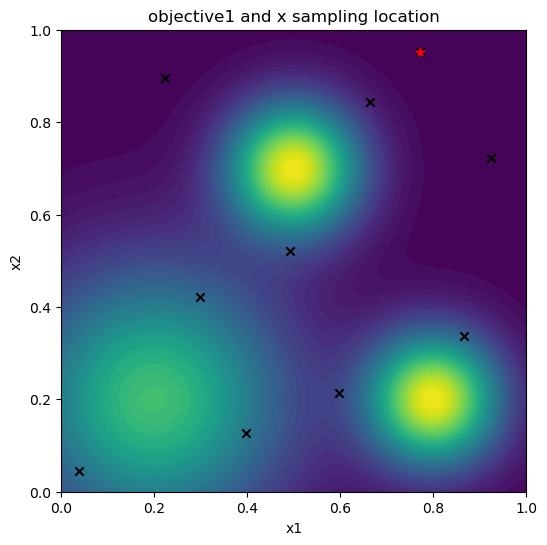

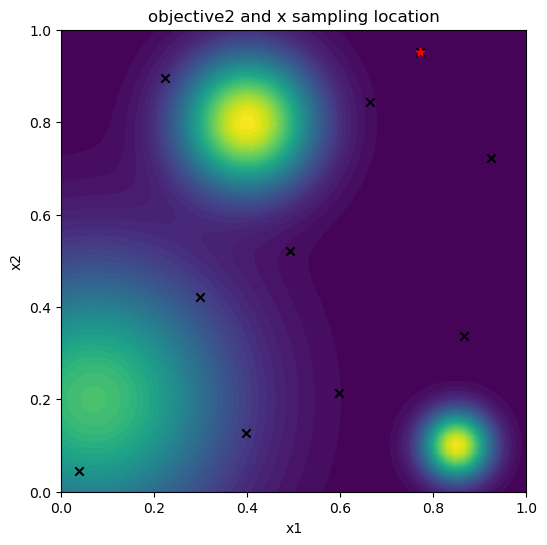

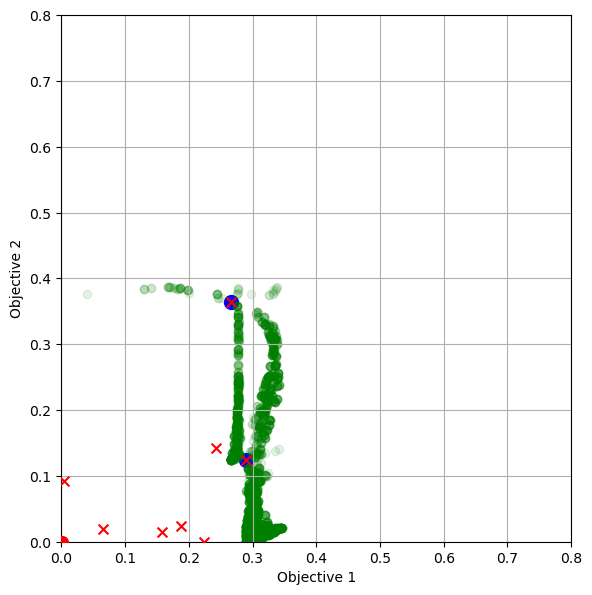

Iteration: 1
new candidats: tensor([[0.0765, 0.1608]], dtype=torch.float64)
new obj: tensor([[0.4054, 0.4902]], dtype=torch.float64)
Hypervolume (qPES): [0.04617814]
Time: 2.897337697999319


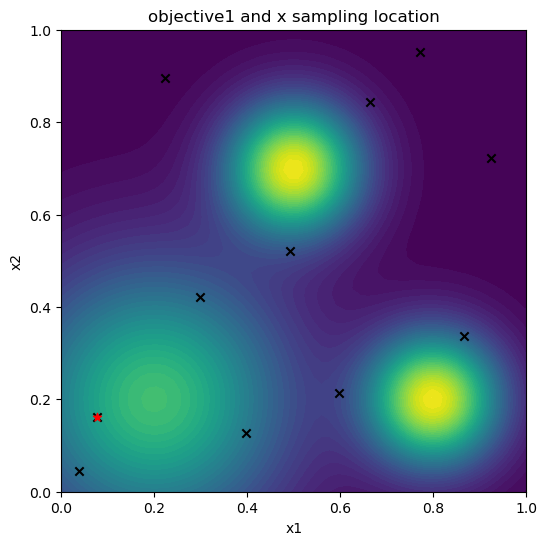

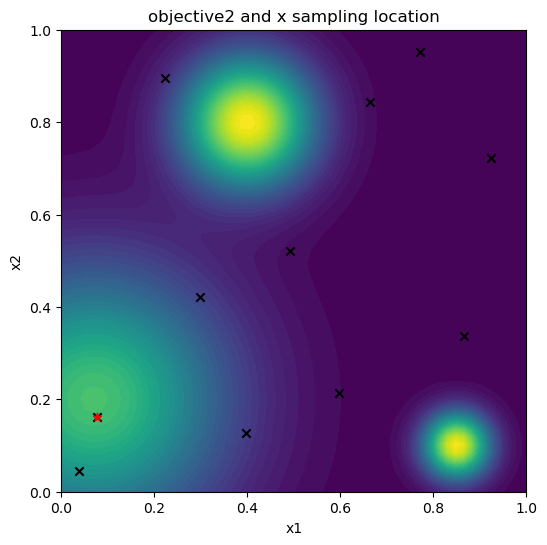

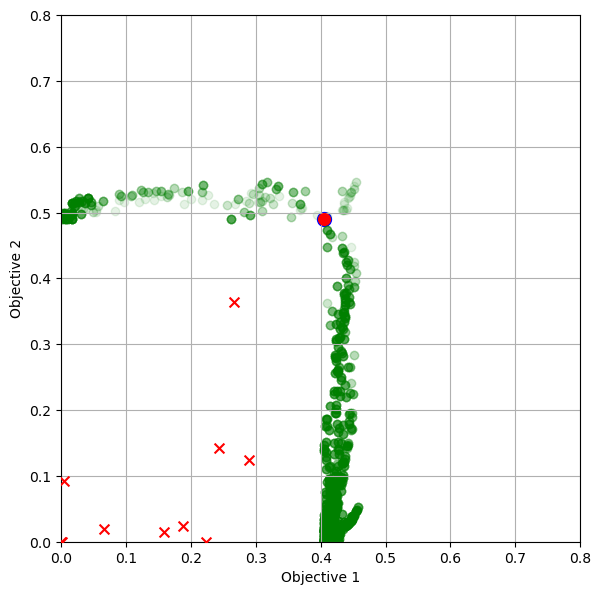

Iteration: 2
new candidats: tensor([[0.0211, 0.2323]], dtype=torch.float64)
new obj: tensor([[0.3308, 0.4790]], dtype=torch.float64)
Hypervolume (qPES): [0.04617814]
Time: 2.5637027240009047


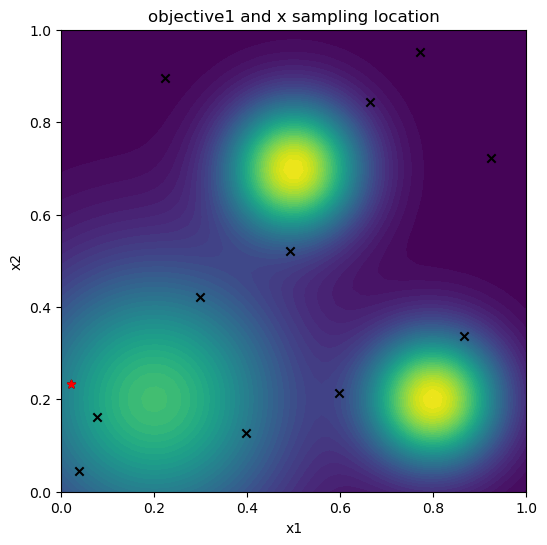

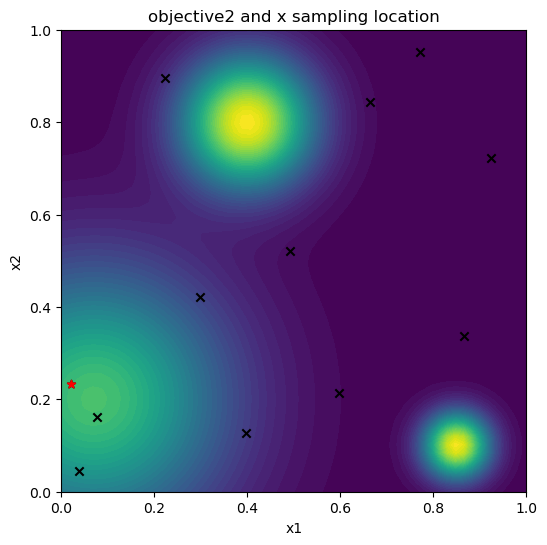

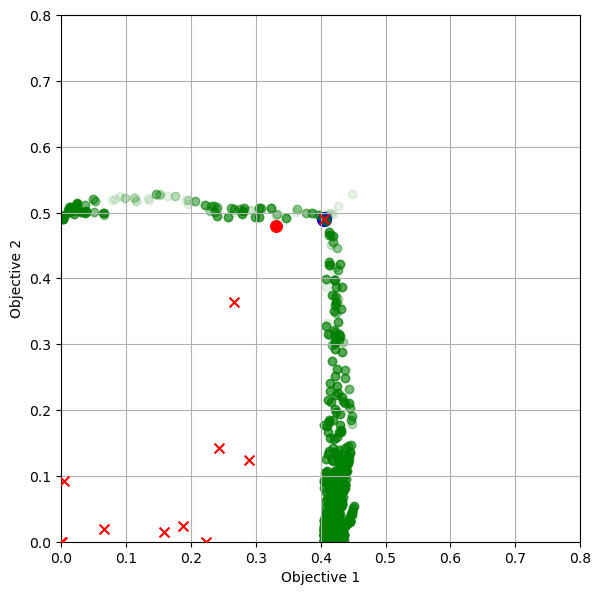

Iteration: 3
new candidats: tensor([[0.0000, 0.4476]], dtype=torch.float64)
new obj: tensor([[0.1409, 0.2186]], dtype=torch.float64)
Hypervolume (qPES): [0.04617814]
Time: 2.2276862069993513


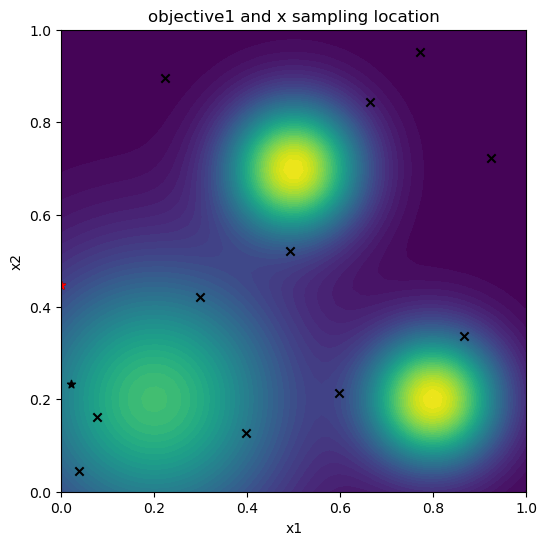

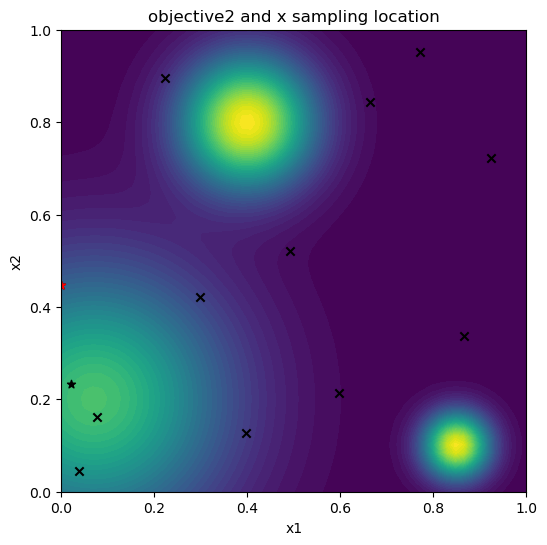

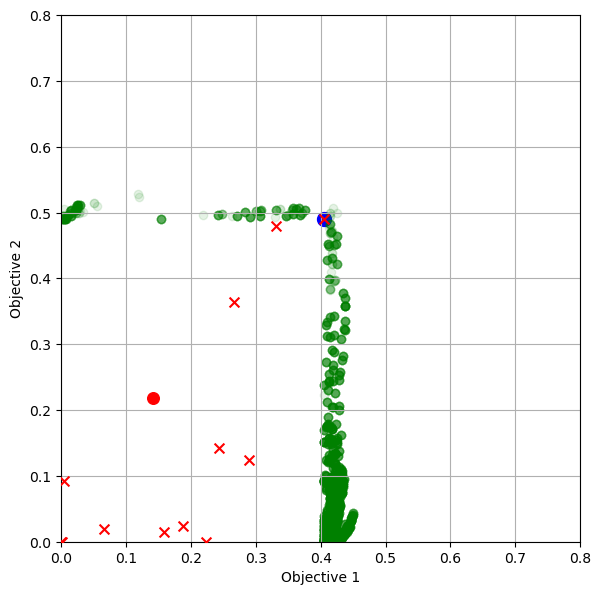

Iteration: 4
new candidats: tensor([[0.1473, 0.1709]], dtype=torch.float64)
new obj: tensor([[0.4778, 0.4592]], dtype=torch.float64)
Hypervolume (qPES): [0.06342799]
Time: 2.403785501999664


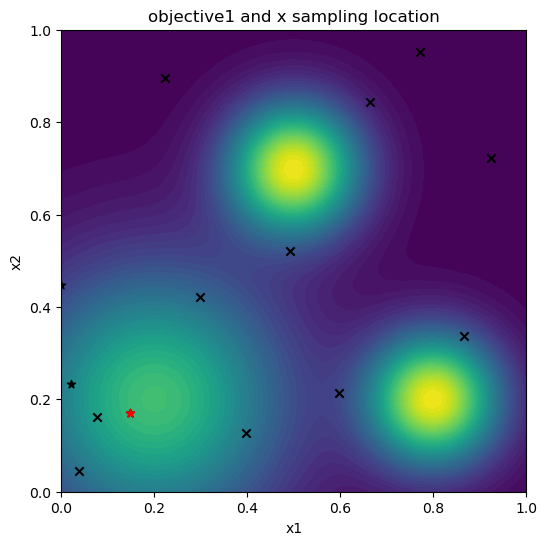

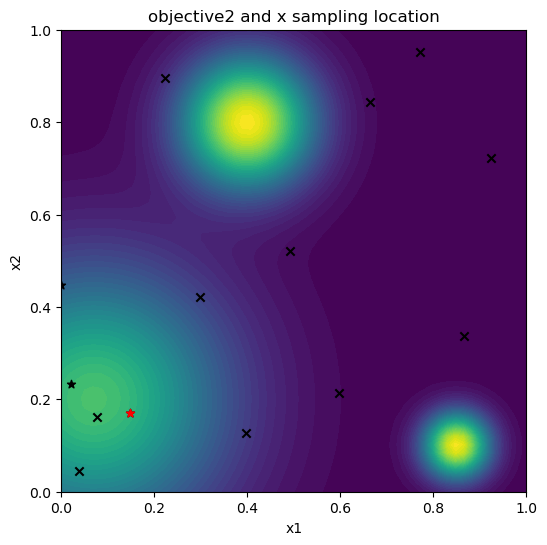

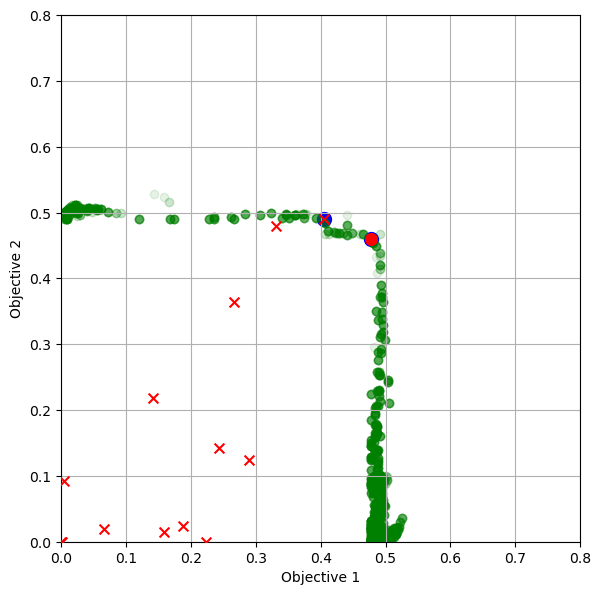

Iteration: 5
new candidats: tensor([[0.2001, 0.1660]], dtype=torch.float64)
new obj: tensor([[0.4928, 0.3989]], dtype=torch.float64)
Hypervolume (qPES): [0.06609203]
Time: 2.7710861840023426


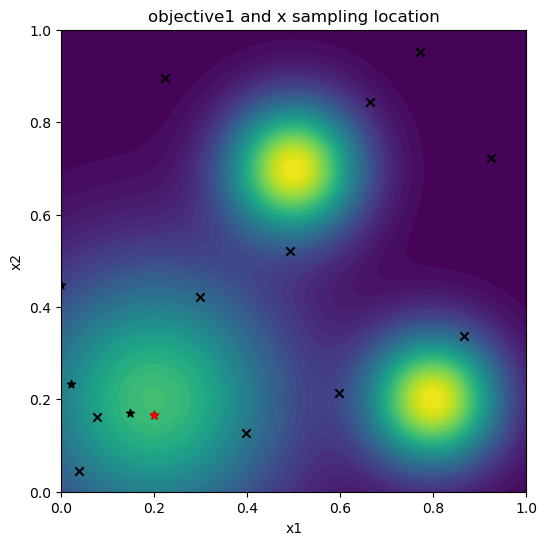

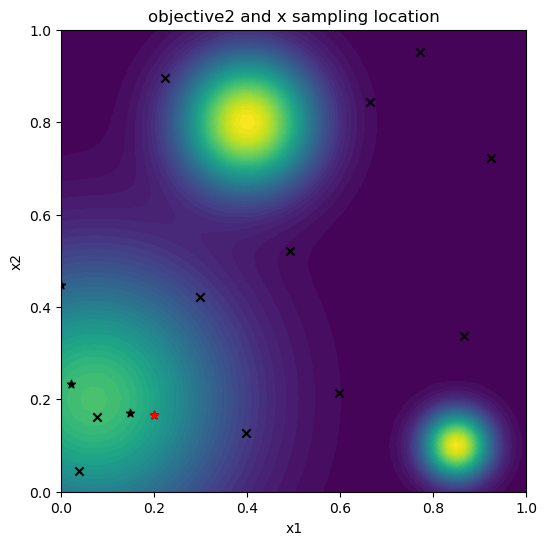

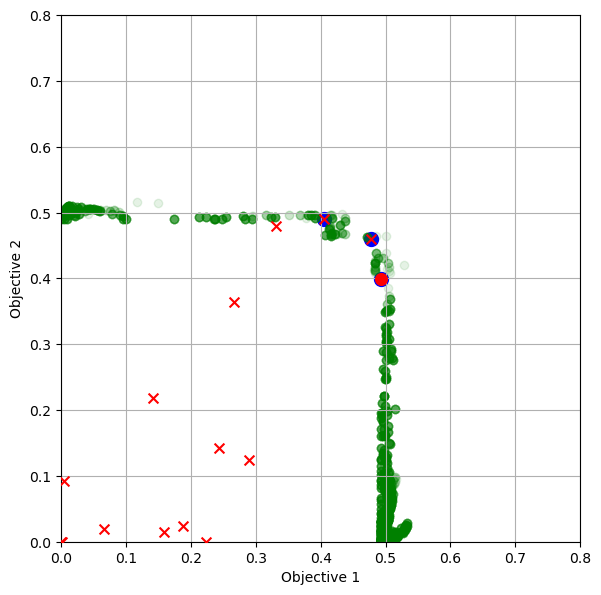

Iteration: 6
new candidats: tensor([[0.0903, 0.1930]], dtype=torch.float64)
new obj: tensor([[0.4299, 0.4971]], dtype=torch.float64)
Hypervolume (qPES): [0.06820748]
Time: 2.4555766569974367


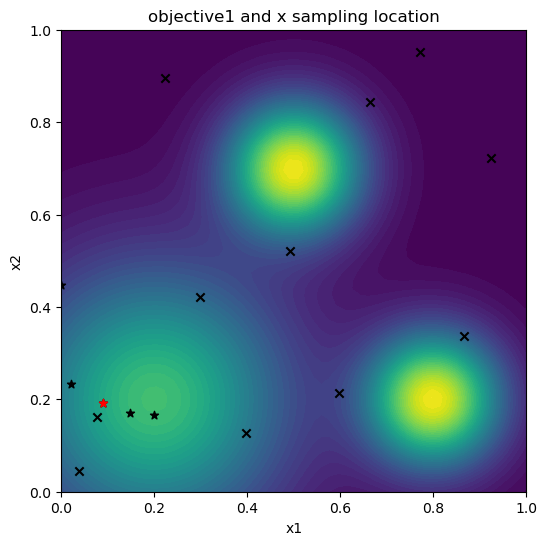

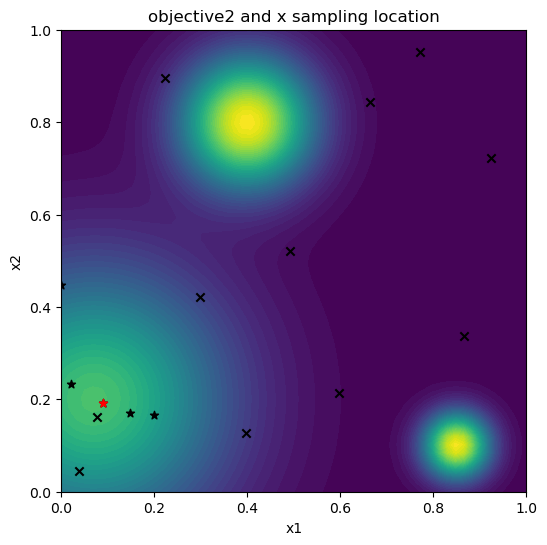

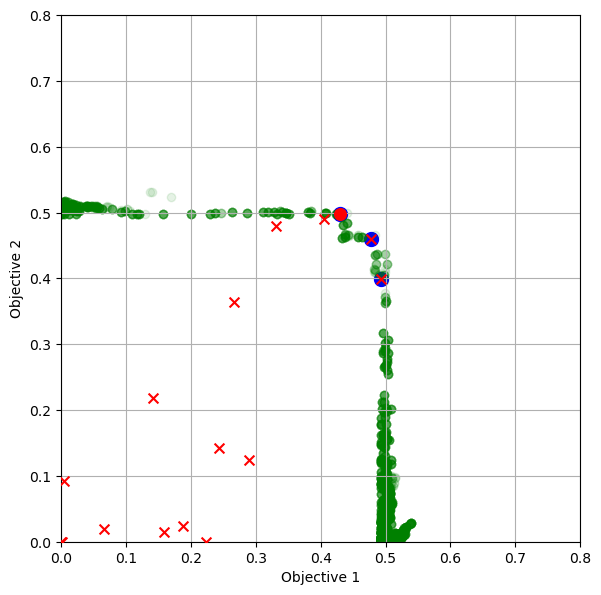

Iteration: 7
new candidats: tensor([[0.1857, 0.1980]], dtype=torch.float64)
new obj: tensor([[0.4987, 0.4229]], dtype=torch.float64)
Hypervolume (qPES): [0.06975323]
Time: 2.5171808029990643


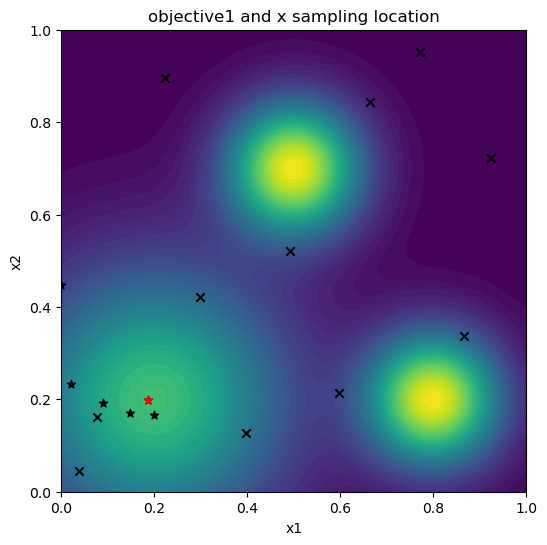

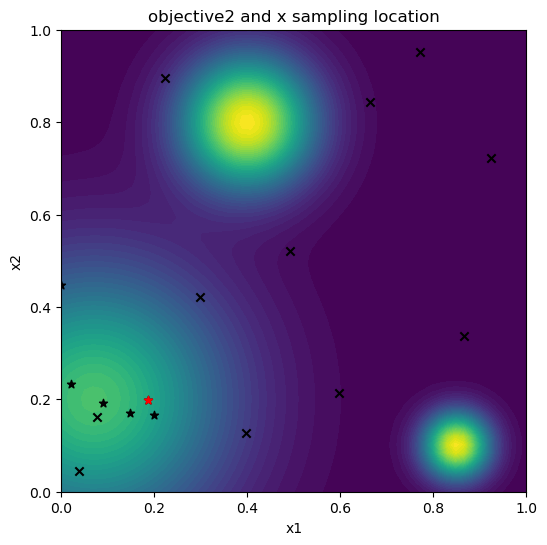

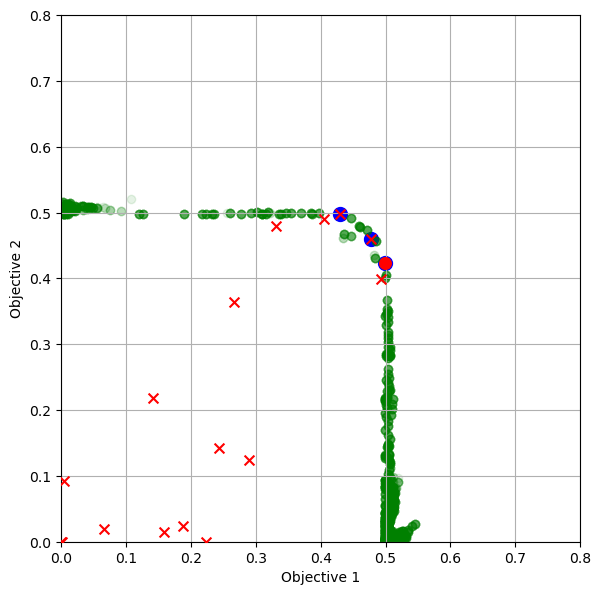

Iteration: 8
new candidats: tensor([[0.1225, 0.1964]], dtype=torch.float64)
new obj: tensor([[0.4638, 0.4830]], dtype=torch.float64)
Hypervolume (qPES): [0.07056019]
Time: 2.375807327000075


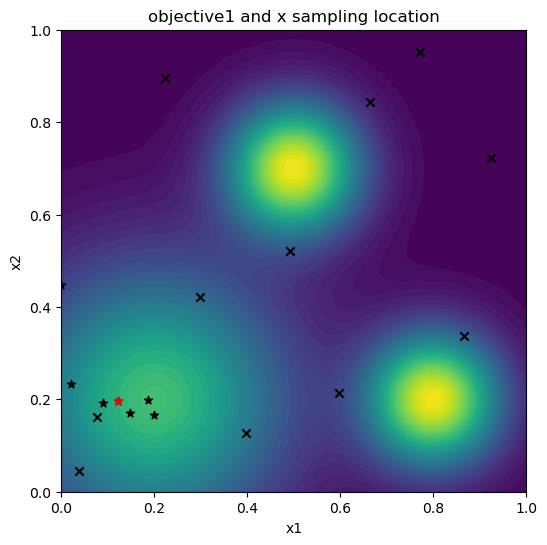

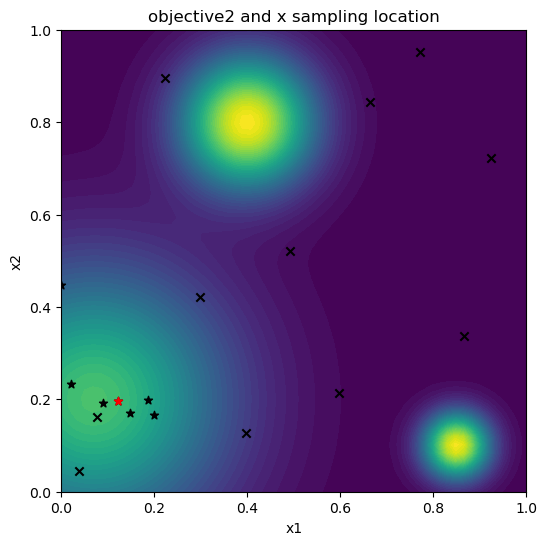

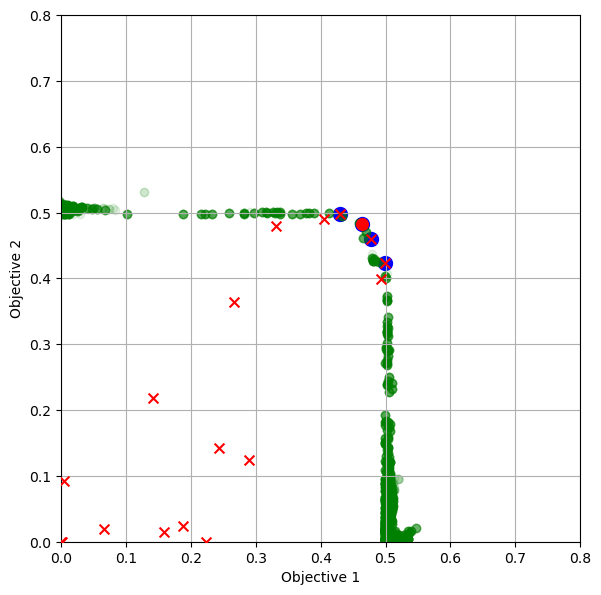

Iteration: 9
new candidats: tensor([[0.1611, 0.1975]], dtype=torch.float64)
new obj: tensor([[0.4906, 0.4507]], dtype=torch.float64)
Hypervolume (qPES): [0.07091488]
Time: 2.376647592012887


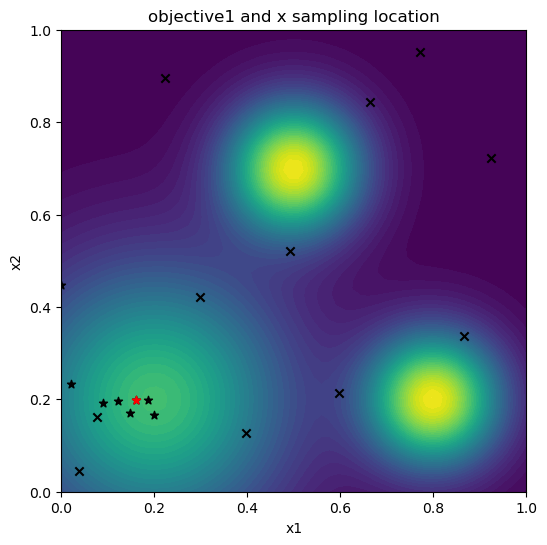

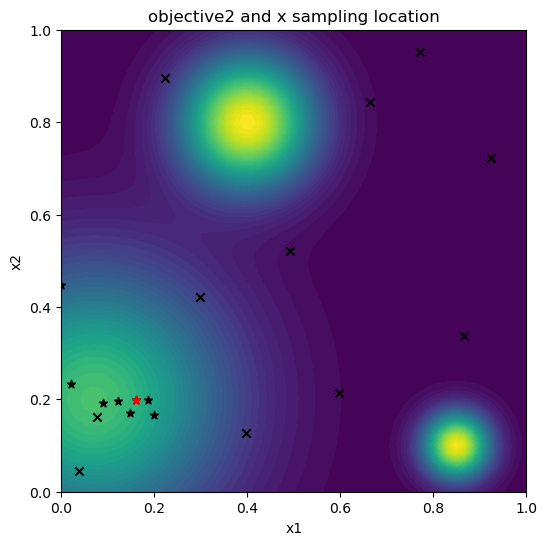

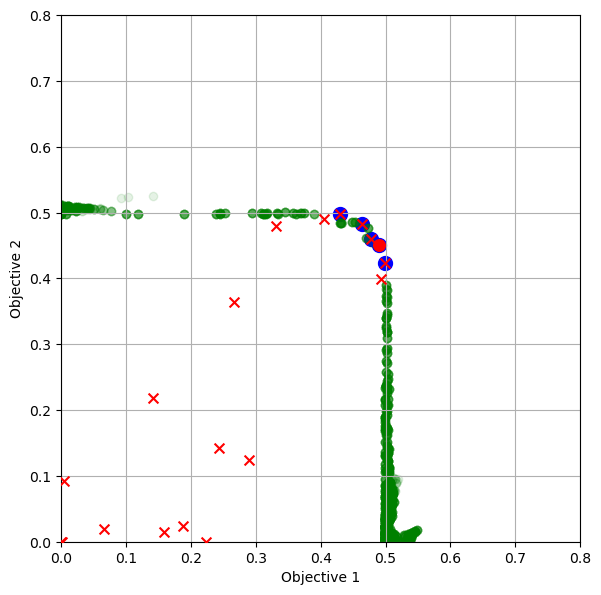

Iteration: 10
new candidats: tensor([[0.2534, 0.2686]], dtype=torch.float64)
new obj: tensor([[0.4549, 0.3096]], dtype=torch.float64)
Hypervolume (qPES): [0.07091488]
Time: 2.3233793529943796


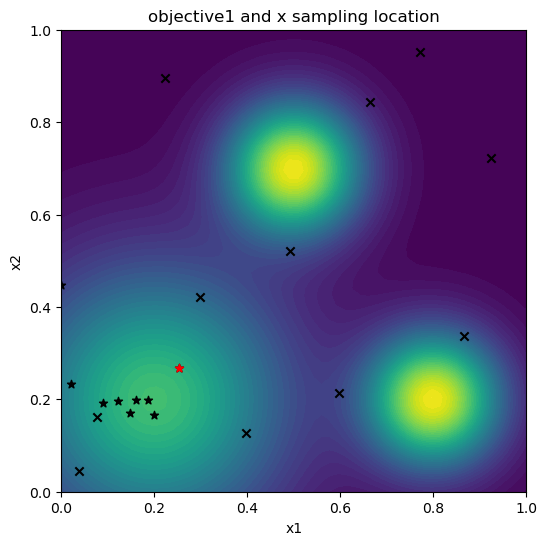

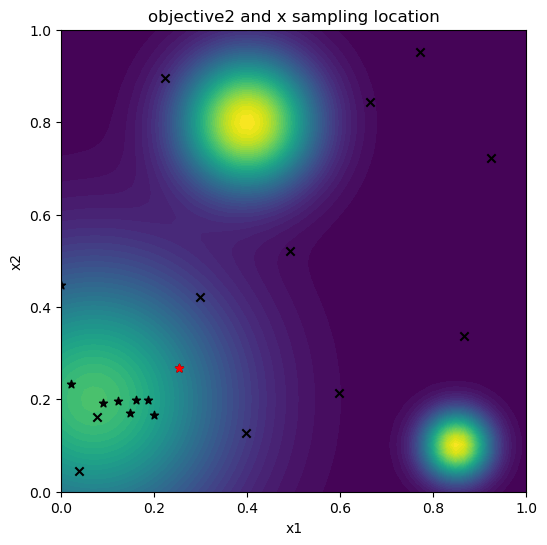

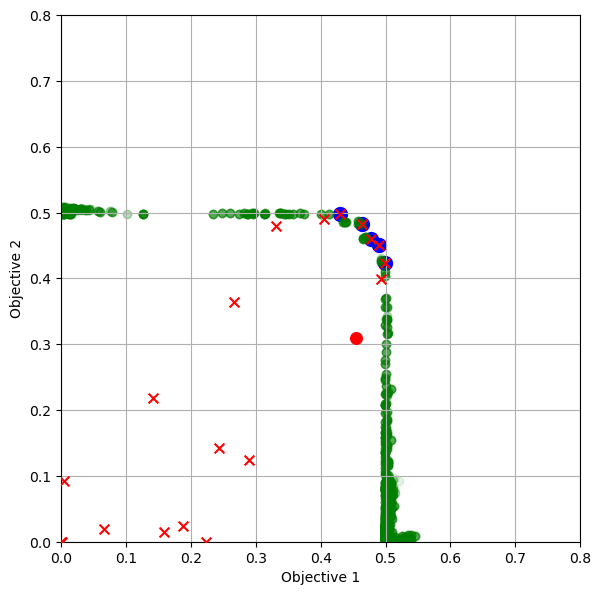

Iteration: 11
new candidats: tensor([[0.0699, 0.1953]], dtype=torch.float64)
new obj: tensor([[0.4045, 0.4999]], dtype=torch.float64)
Hypervolume (qPES): [0.07138052]
Time: 2.53165863500908


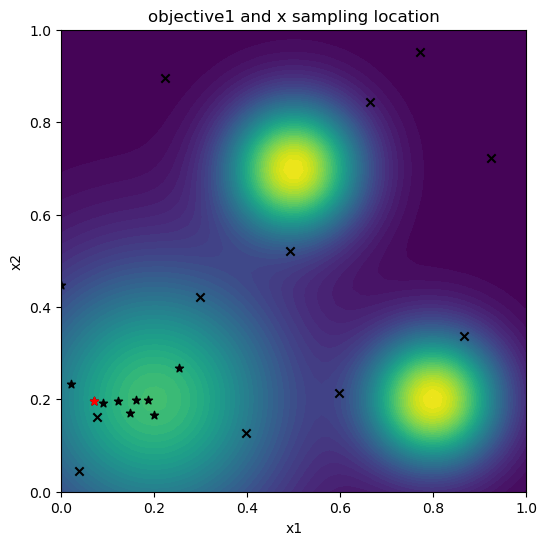

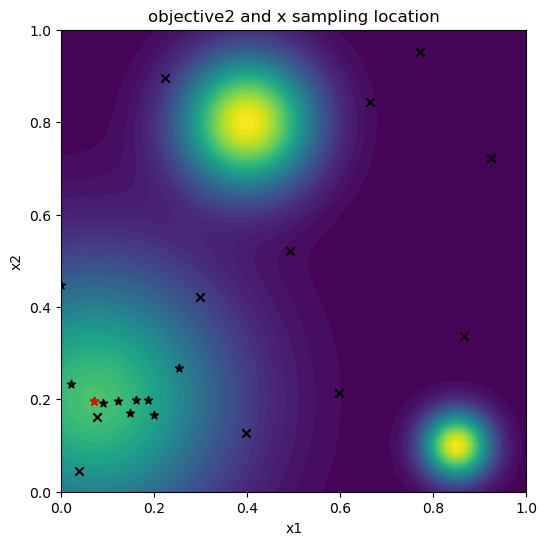

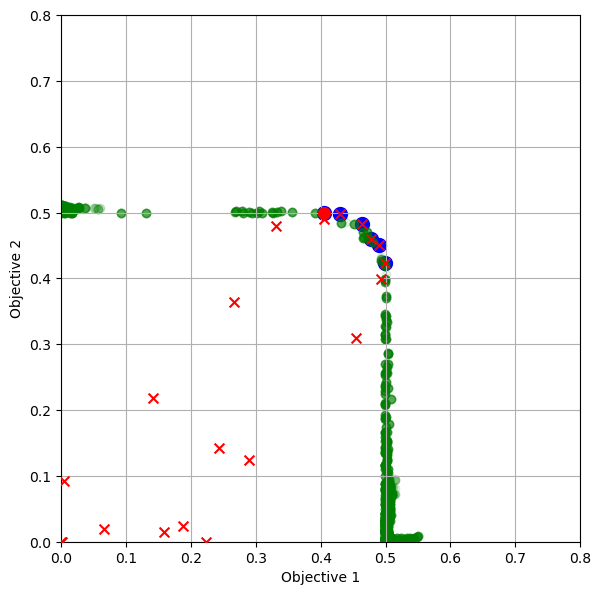

Iteration: 12
new candidats: tensor([[0.6067, 0.1453]], dtype=torch.float64)
new obj: tensor([[0.1540, 0.0132]], dtype=torch.float64)
Hypervolume (qPES): [0.07138052]
Time: 2.242950262996601


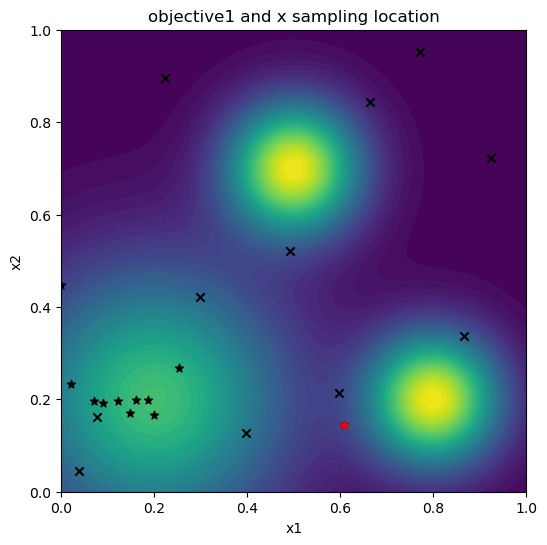

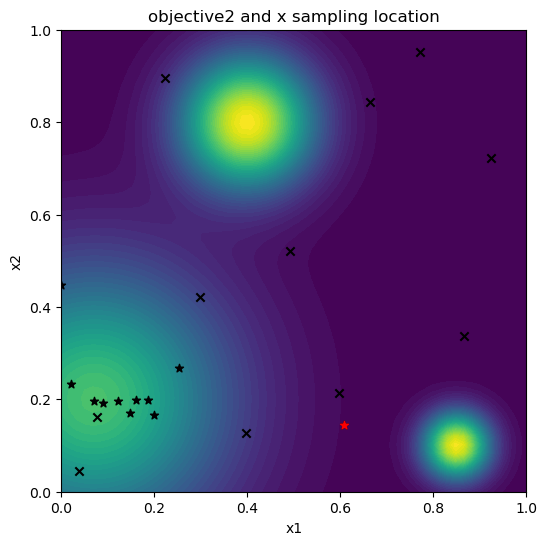

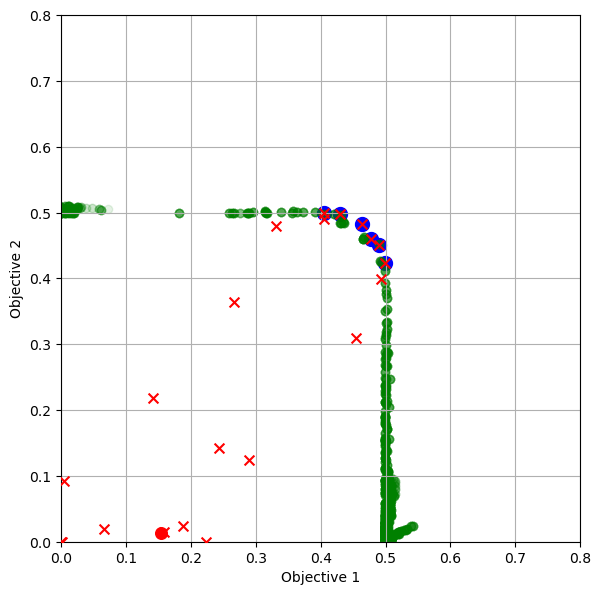

Iteration: 13
new candidats: tensor([[0.1415, 0.1982]], dtype=torch.float64)
new obj: tensor([[0.4791, 0.4690]], dtype=torch.float64)
Hypervolume (qPES): [0.07154127]
Time: 2.4839369590044953


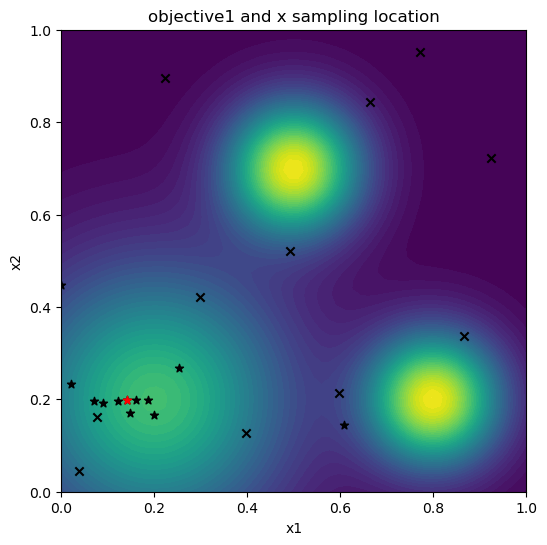

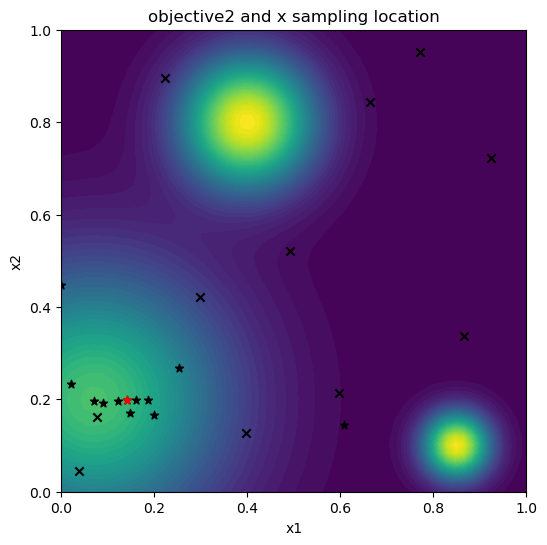

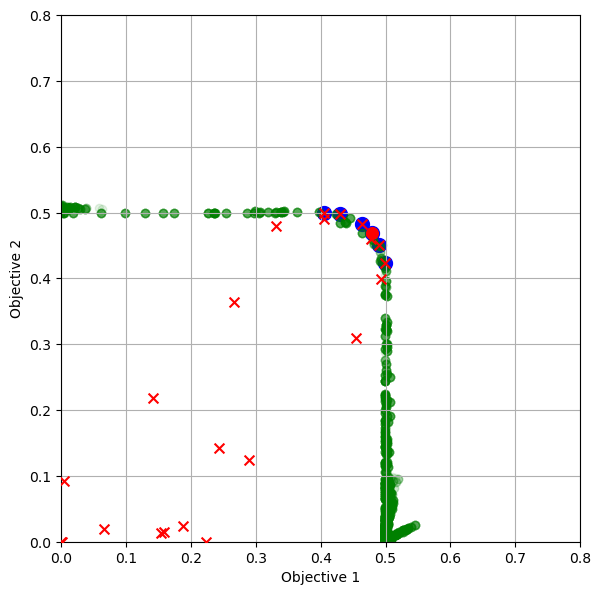

Iteration: 14
new candidats: tensor([[0.9070, 0.3988]], dtype=torch.float64)
new obj: tensor([[5.5354e-02, 4.8018e-05]], dtype=torch.float64)
Hypervolume (qPES): [0.07154127]
Time: 2.37276558400481


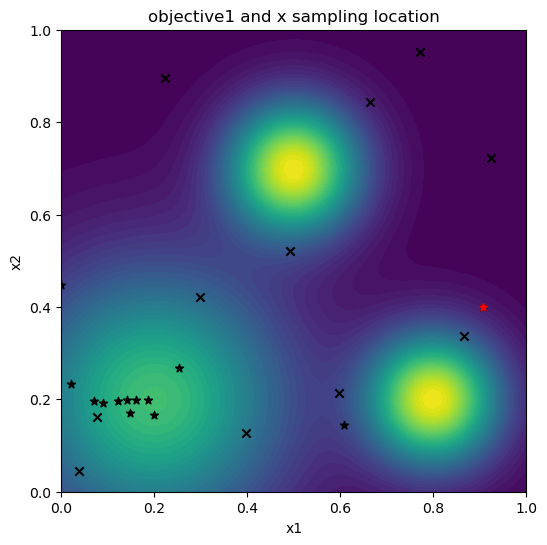

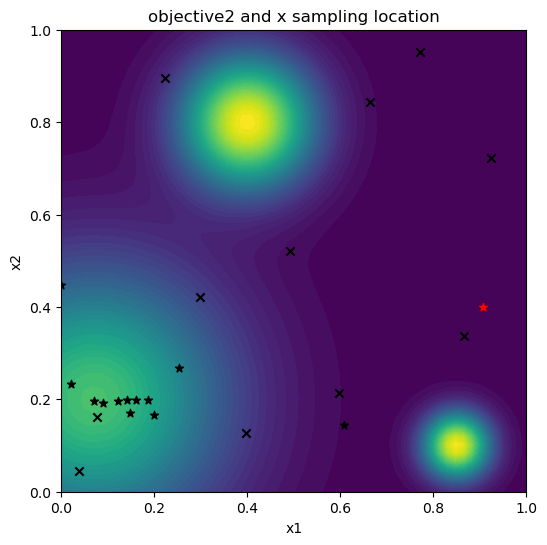

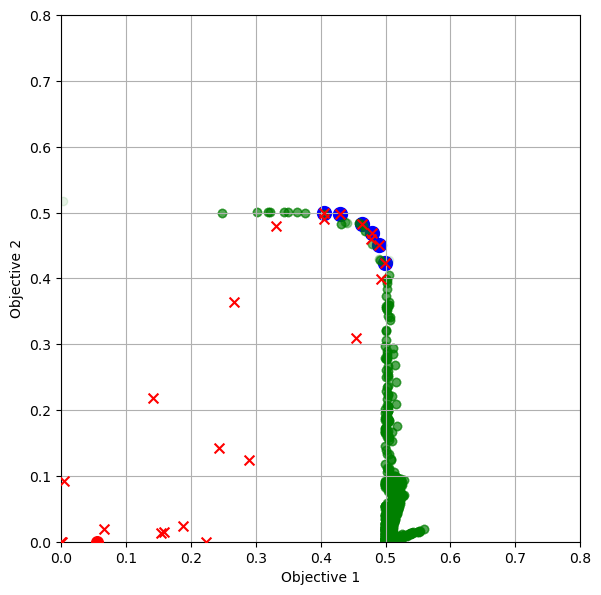

Iteration: 15
new candidats: tensor([[0.1826, 0.1704]], dtype=torch.float64)
new obj: tensor([[0.4927, 0.4220]], dtype=torch.float64)
Hypervolume (qPES): [0.07154127]
Time: 2.1918908929947065


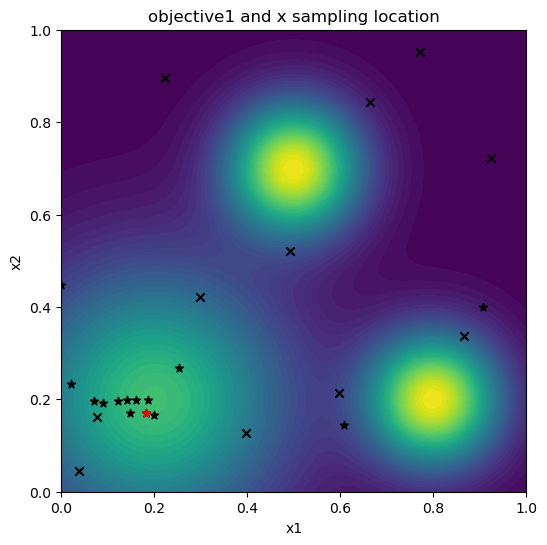

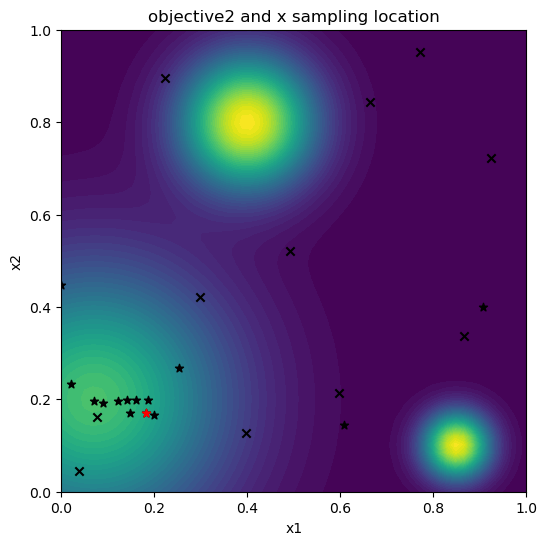

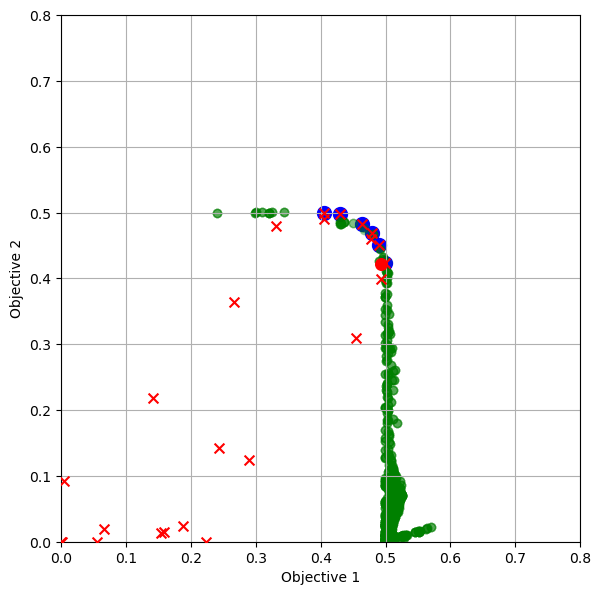

Iteration: 16
new candidats: tensor([[0.1961, 0.1976]], dtype=torch.float64)
new obj: tensor([[0.4999, 0.4099]], dtype=torch.float64)
Hypervolume (qPES): [0.07176071]
Time: 2.7840980589971878


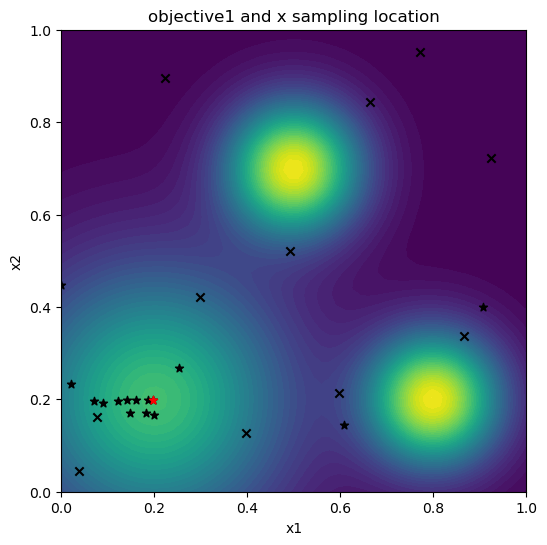

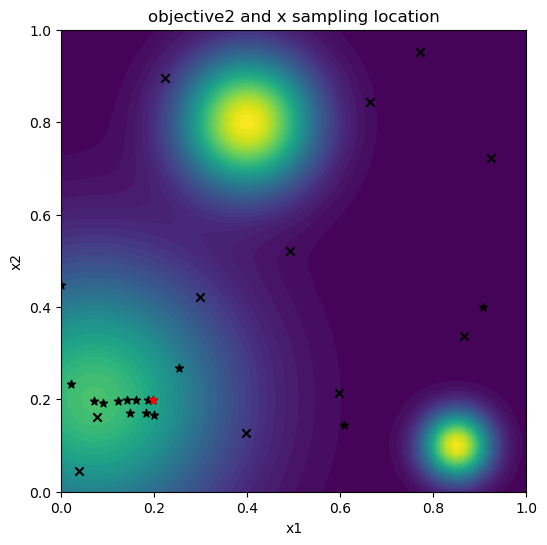

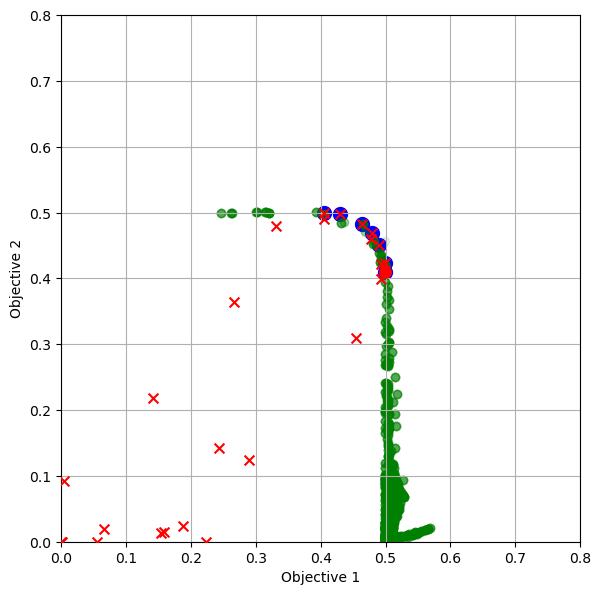

Iteration: 17
new candidats: tensor([[0.1726, 0.1983]], dtype=torch.float64)
new obj: tensor([[0.4953, 0.4384]], dtype=torch.float64)
Hypervolume (qPES): [0.07183348]
Time: 2.522441848006565


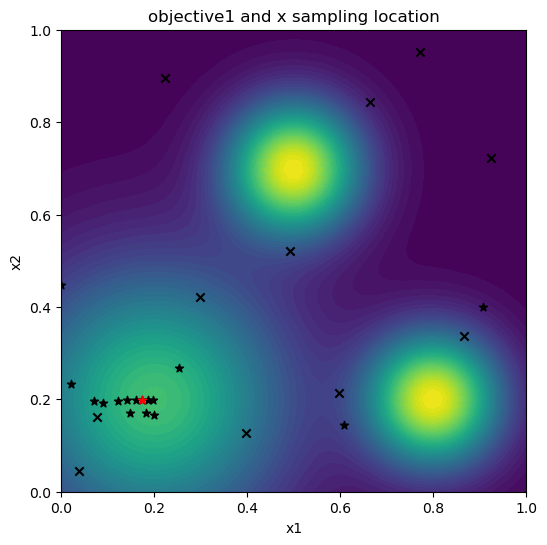

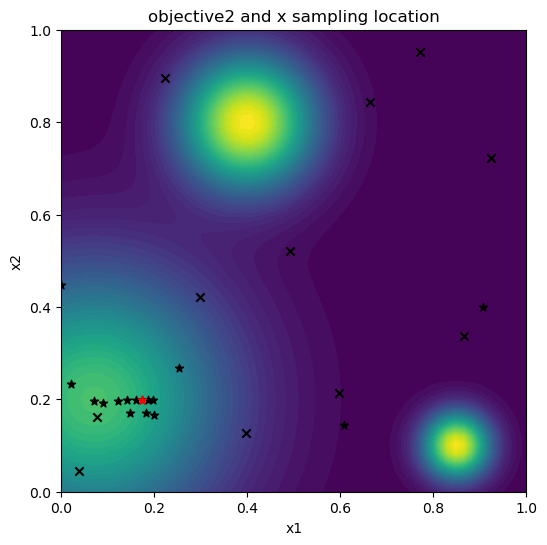

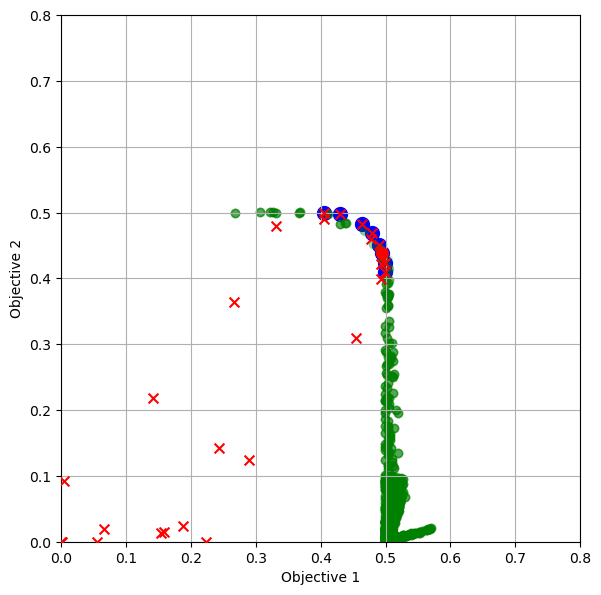

Iteration: 18
new candidats: tensor([[0.1321, 0.1974]], dtype=torch.float64)
new obj: tensor([[0.4719, 0.4765]], dtype=torch.float64)
Hypervolume (qPES): [0.0718944]
Time: 2.8113859130098717


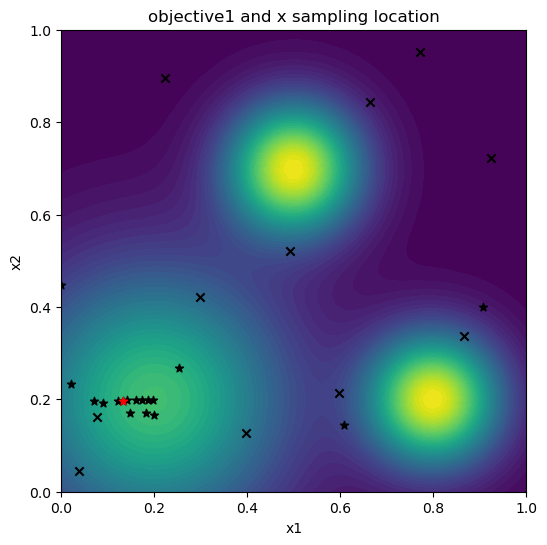

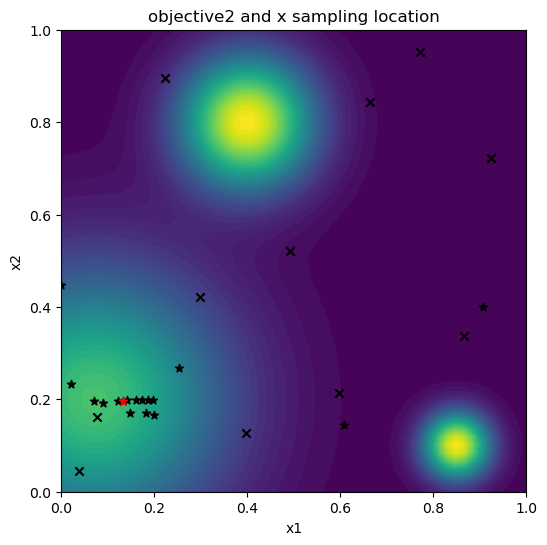

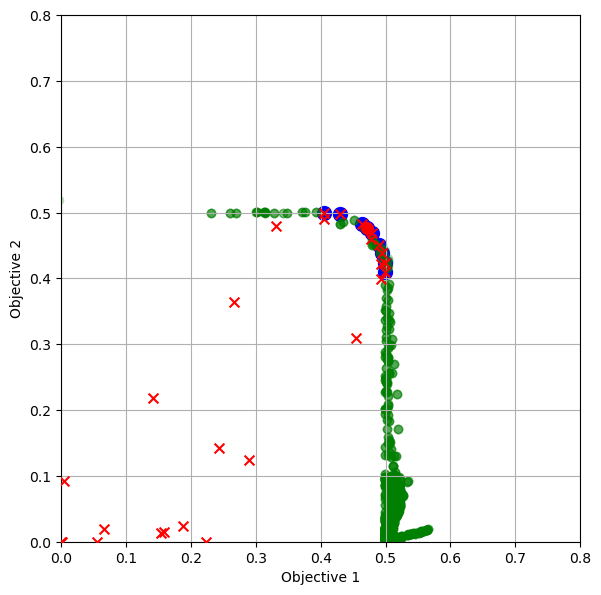

Iteration: 19
new candidats: tensor([[0.1073, 0.1968]], dtype=torch.float64)
new obj: tensor([[0.4490, 0.4913]], dtype=torch.float64)
Hypervolume (qPES): [0.07205381]
Time: 2.4717213999974774


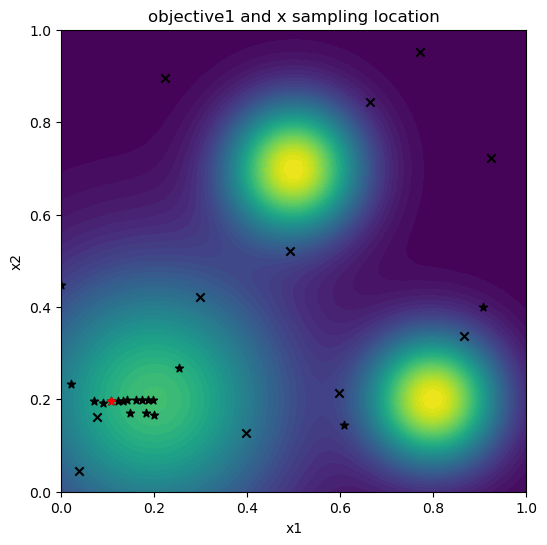

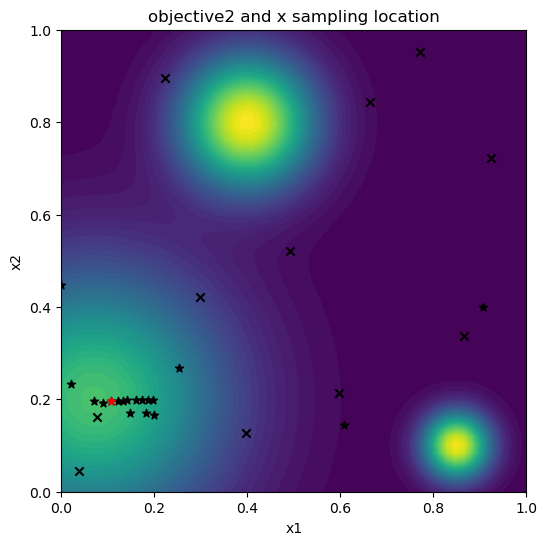

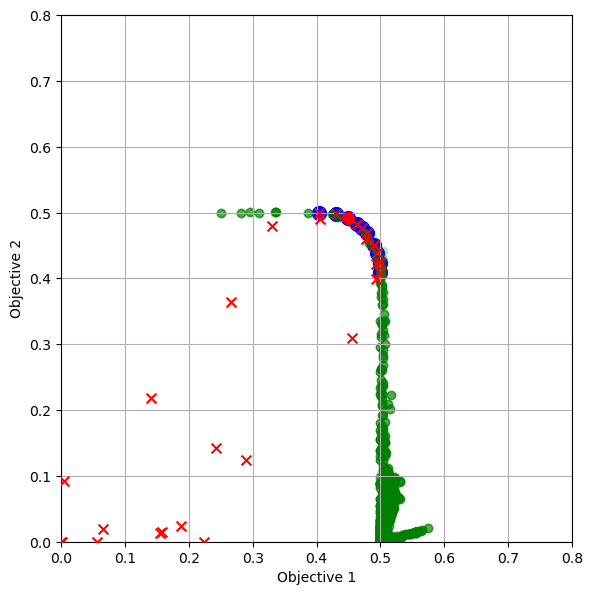

Iteration: 20
new candidats: tensor([[0.1922, 0.2290]], dtype=torch.float64)
new obj: tensor([[0.4944, 0.4105]], dtype=torch.float64)
Hypervolume (qPES): [0.07205381]
Time: 2.5423098300088895


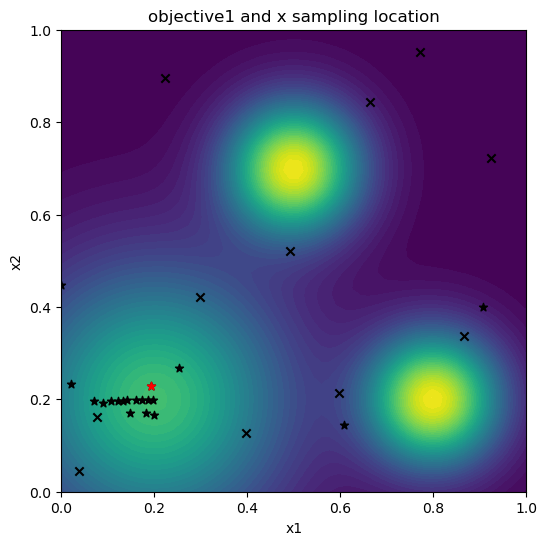

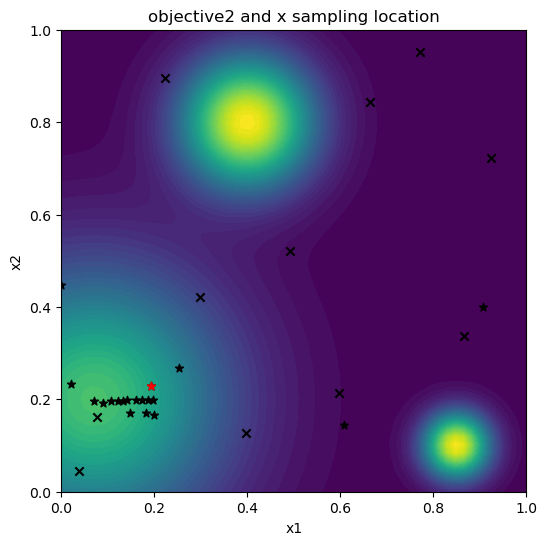

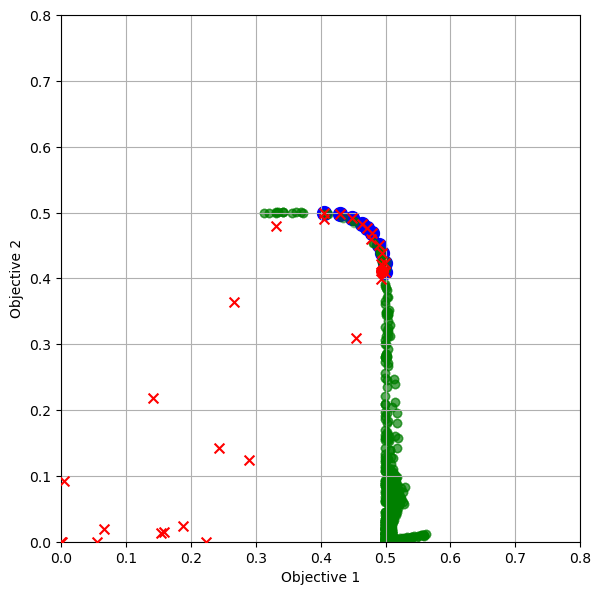

Iteration: 21
new candidats: tensor([[0.0505, 0.1858]], dtype=torch.float64)
new obj: tensor([[0.3772, 0.4964]], dtype=torch.float64)
Hypervolume (qPES): [0.07205381]
Time: 2.2655614929972216


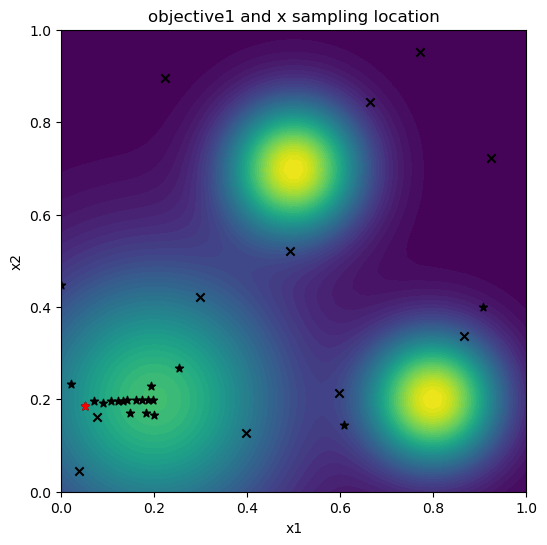

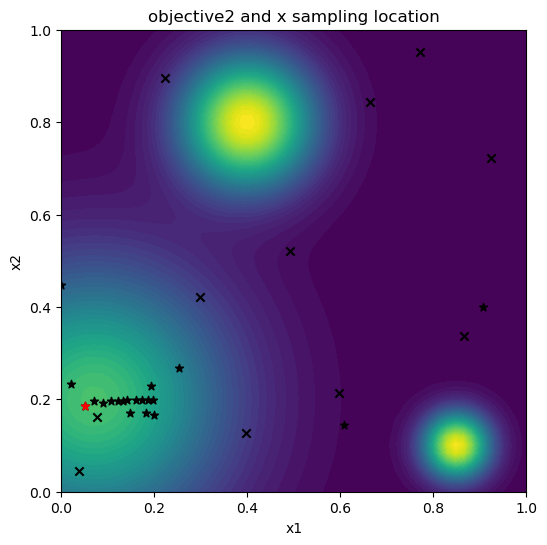

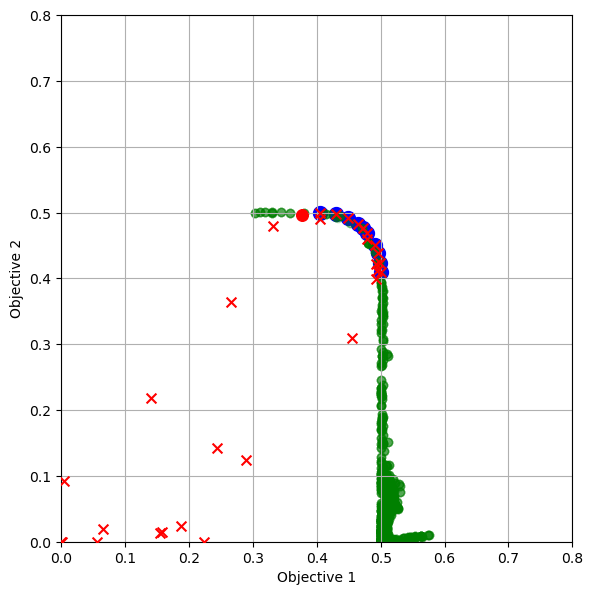

Iteration: 22
new candidats: tensor([[0.8369, 0.4962]], dtype=torch.float64)
new obj: tensor([[0.0095, 0.0001]], dtype=torch.float64)
Hypervolume (qPES): [0.07205381]
Time: 2.5615245289955055


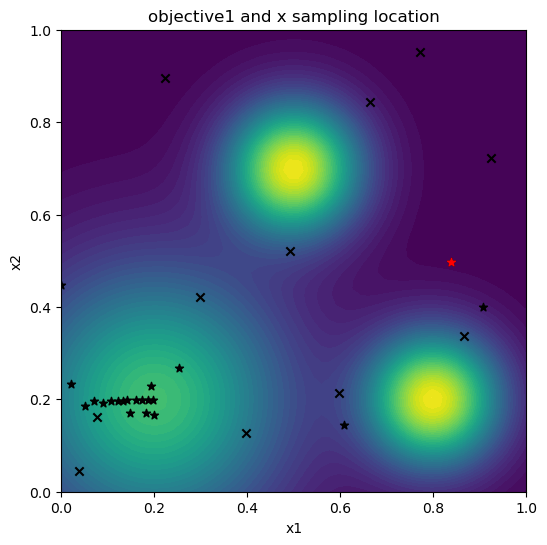

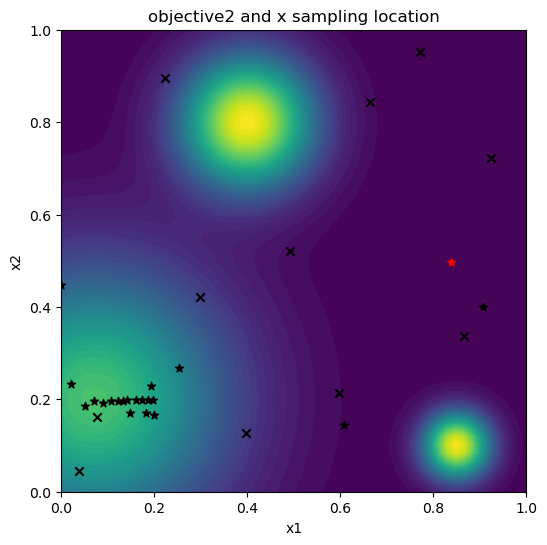

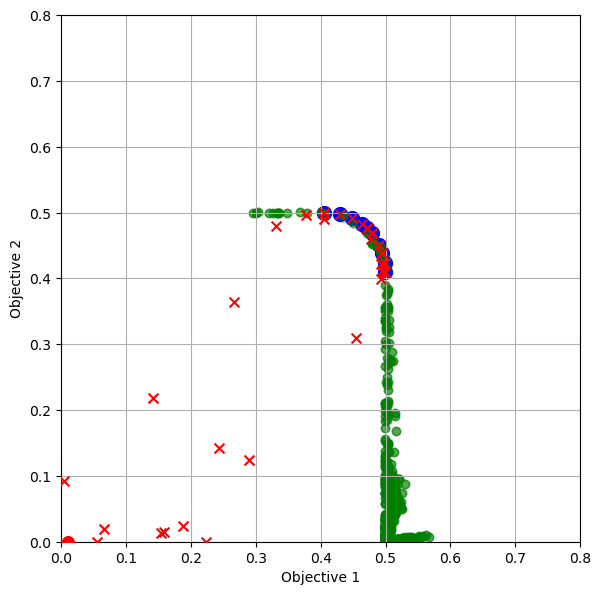

Iteration: 23
new candidats: tensor([[0.0820, 0.1986]], dtype=torch.float64)
new obj: tensor([[0.4201, 0.4991]], dtype=torch.float64)
Hypervolume (qPES): [0.07208431]
Time: 2.6529988560068887


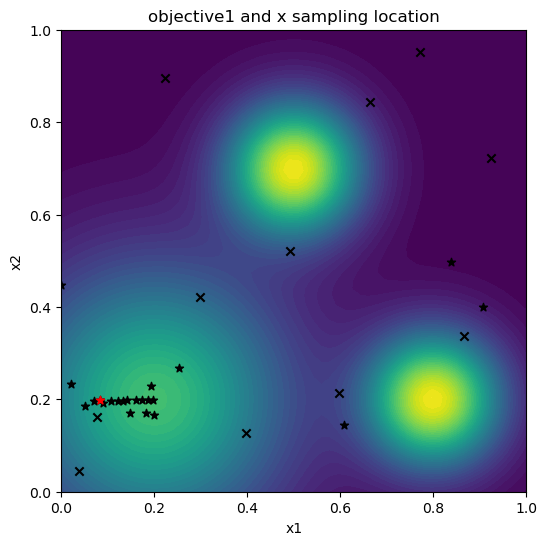

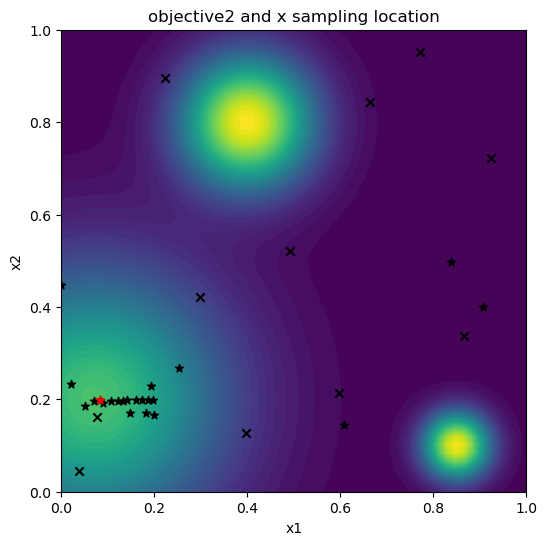

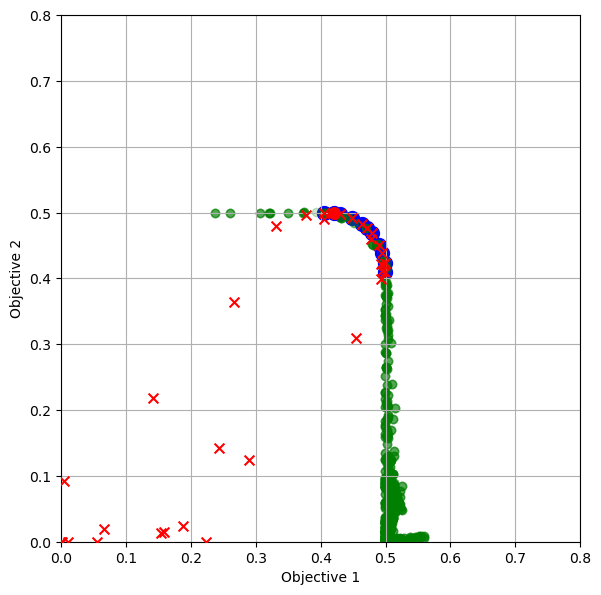

Iteration: 24
new candidats: tensor([[0.0709, 0.1997]], dtype=torch.float64)
new obj: tensor([[0.4059, 0.5000]], dtype=torch.float64)
Hypervolume (qPES): [0.07210831]
Time: 2.427654106999398


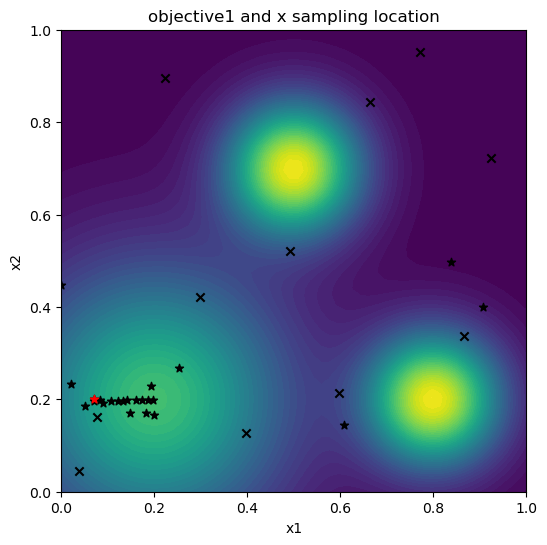

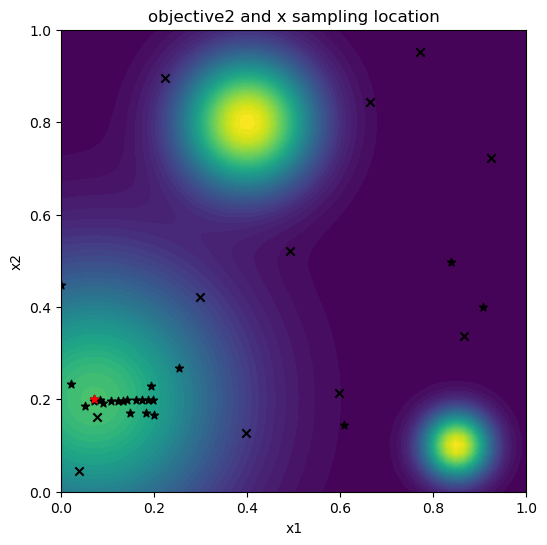

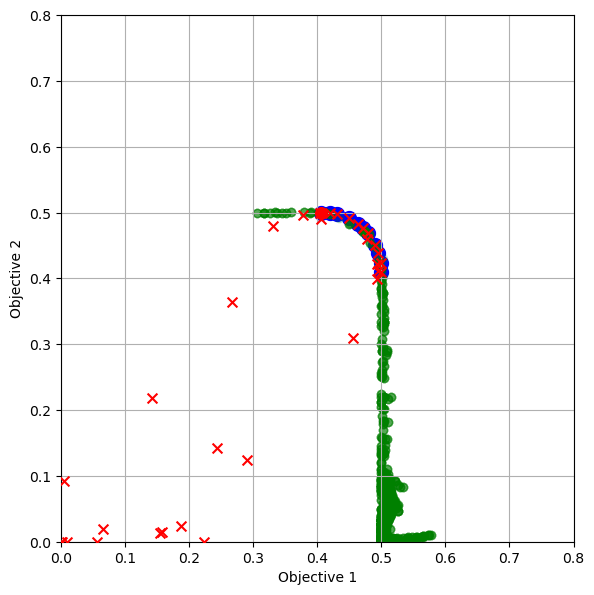

Iteration: 25
new candidats: tensor([[0.2705, 0.1579]], dtype=torch.float64)
new obj: tensor([[0.4596, 0.2959]], dtype=torch.float64)
Hypervolume (qPES): [0.07210831]
Time: 2.5931006760074524


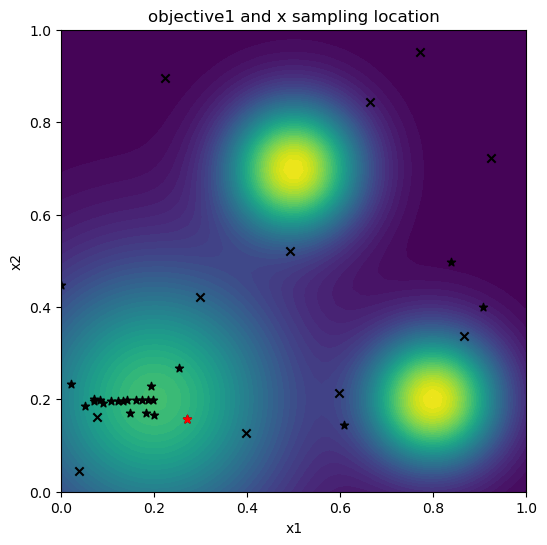

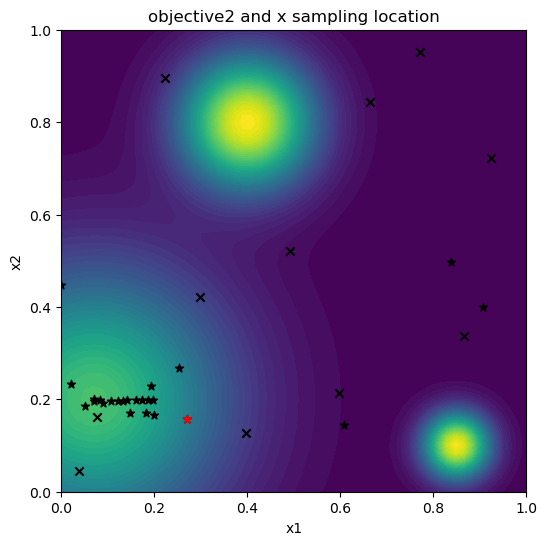

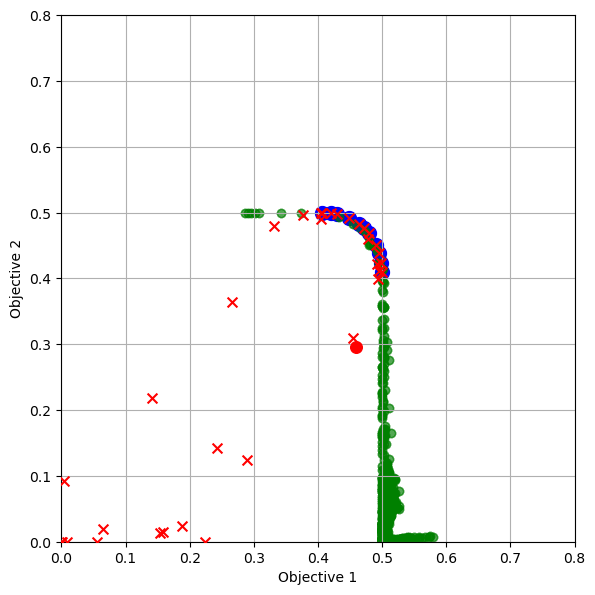

Iteration: 26
new candidats: tensor([[0.5157, 0.0125]], dtype=torch.float64)
new obj: tensor([[0.0948, 0.0269]], dtype=torch.float64)
Hypervolume (qPES): [0.07210831]
Time: 2.5326625849993434


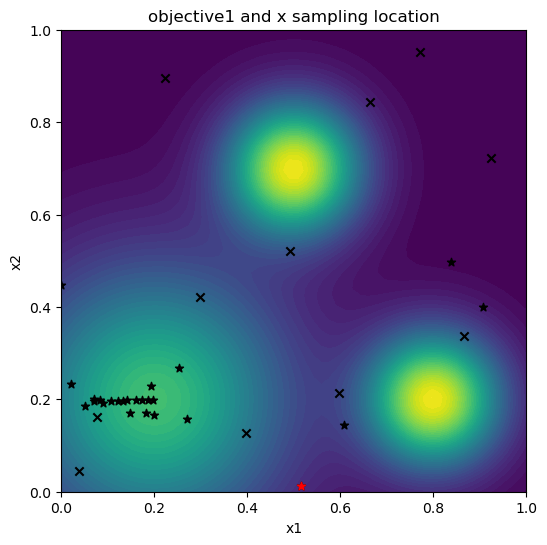

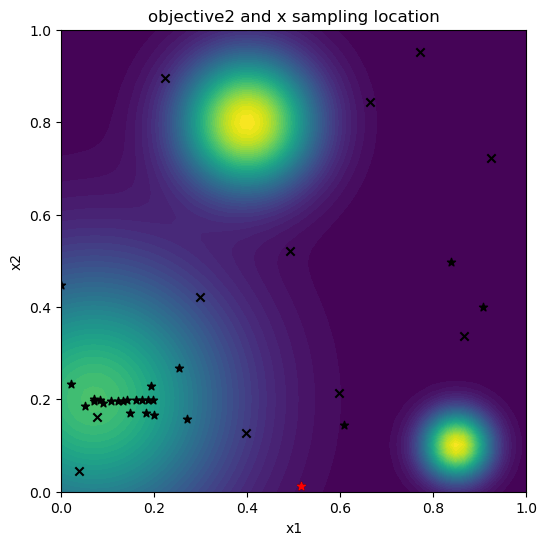

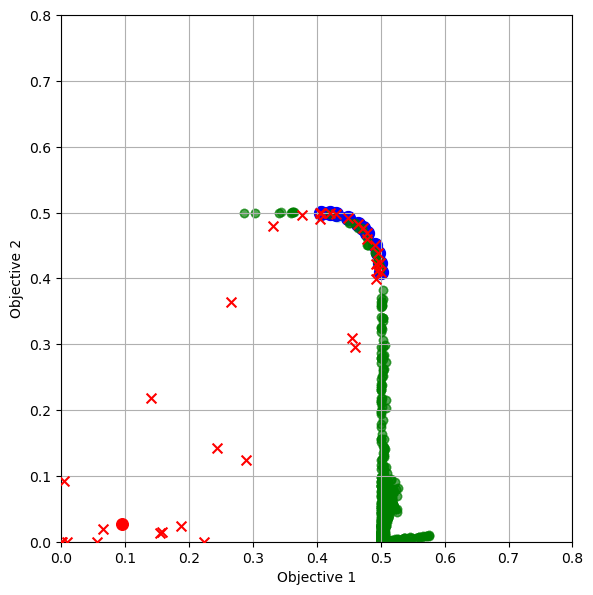

Iteration: 27
new candidats: tensor([[0.1667, 0.1992]], dtype=torch.float64)
new obj: tensor([[0.4931, 0.4448]], dtype=torch.float64)
Hypervolume (qPES): [0.07212454]
Time: 2.5932529529964086


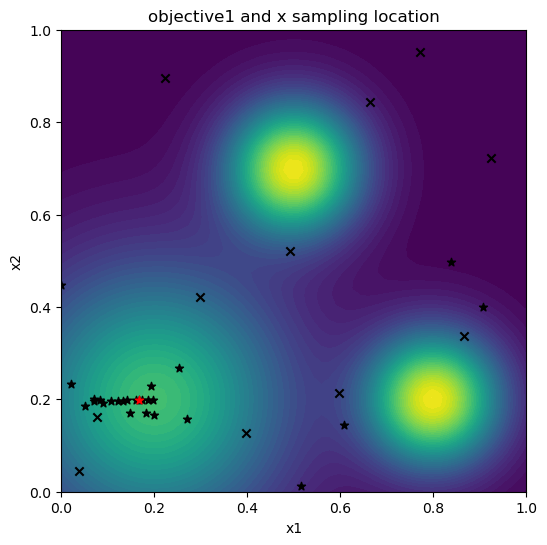

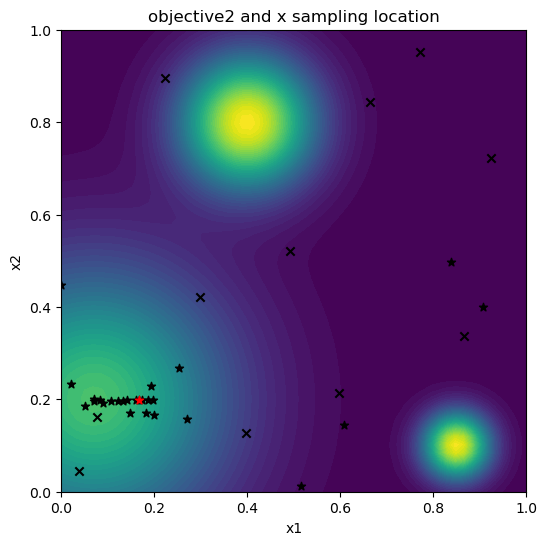

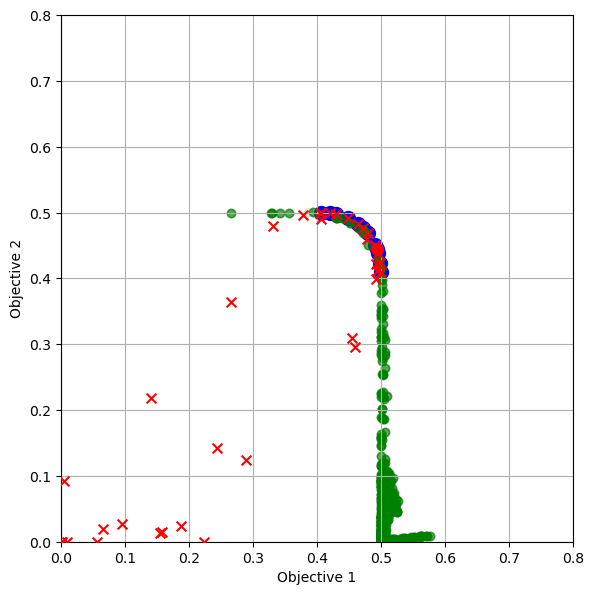

Iteration: 28
new candidats: tensor([[0.2182, 0.1983]], dtype=torch.float64)
new obj: tensor([[0.4979, 0.3799]], dtype=torch.float64)
Hypervolume (qPES): [0.07212454]
Time: 2.5809300239925506


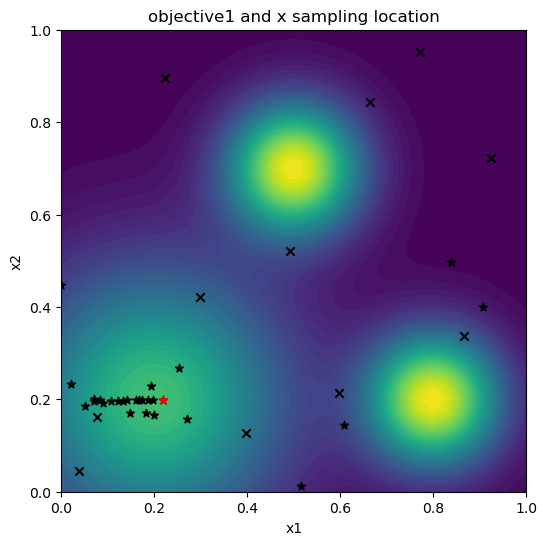

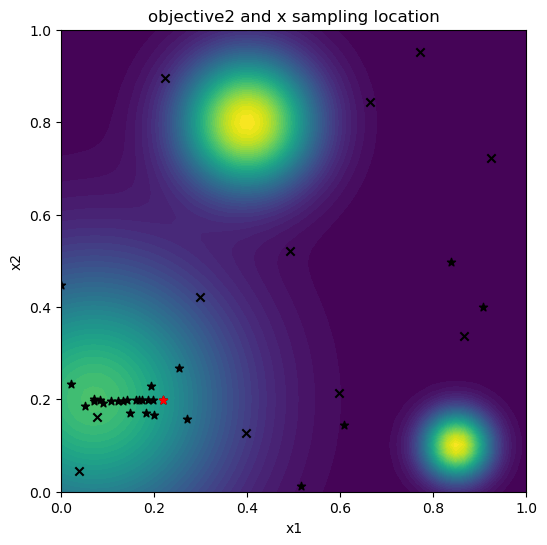

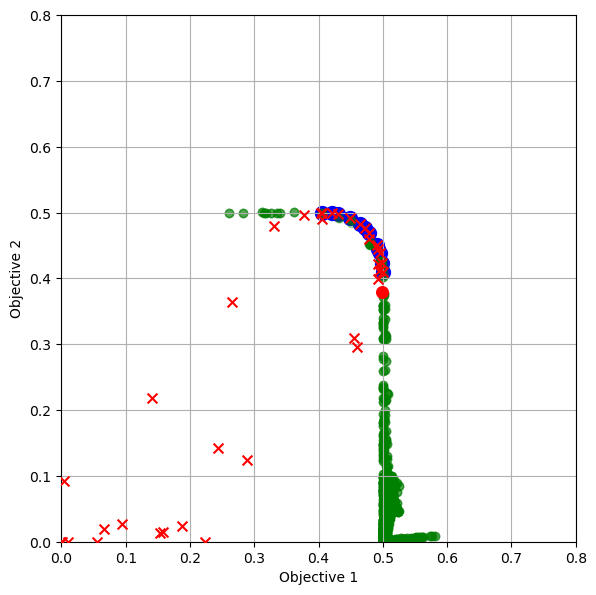

Iteration: 29
new candidats: tensor([[0.1151, 0.1995]], dtype=torch.float64)
new obj: tensor([[0.4569, 0.4875]], dtype=torch.float64)
Hypervolume (qPES): [0.07215986]
Time: 2.672980508999899


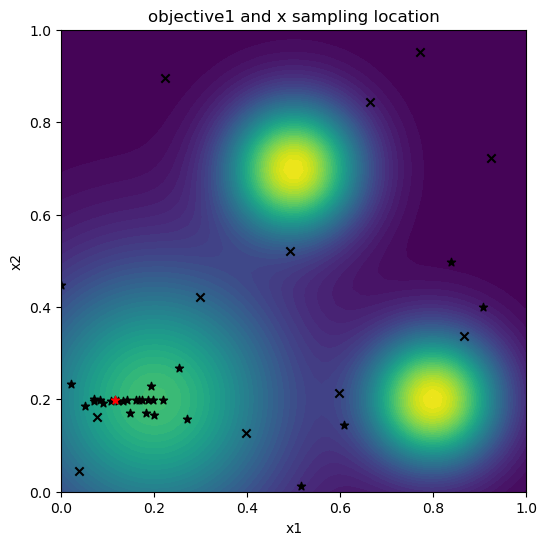

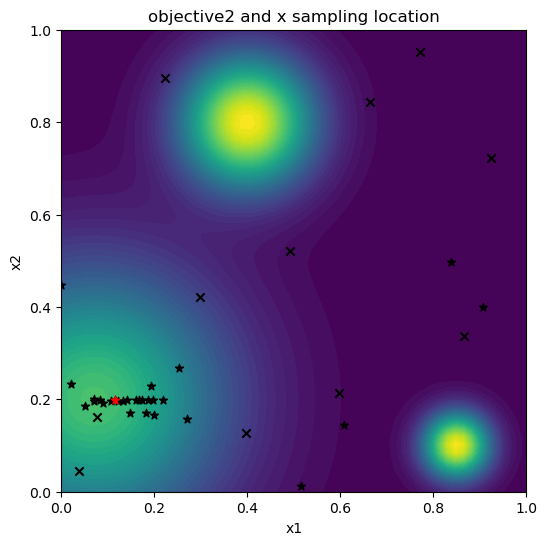

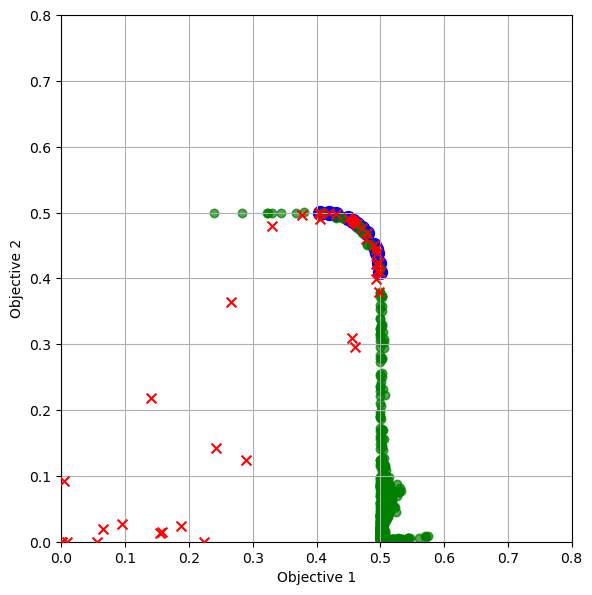

Iteration: 30
new candidats: tensor([[0.2451, 0.0715]], dtype=torch.float64)
new obj: tensor([[0.3966, 0.2773]], dtype=torch.float64)
Hypervolume (qPES): [0.07215986]
Time: 2.372887694000383


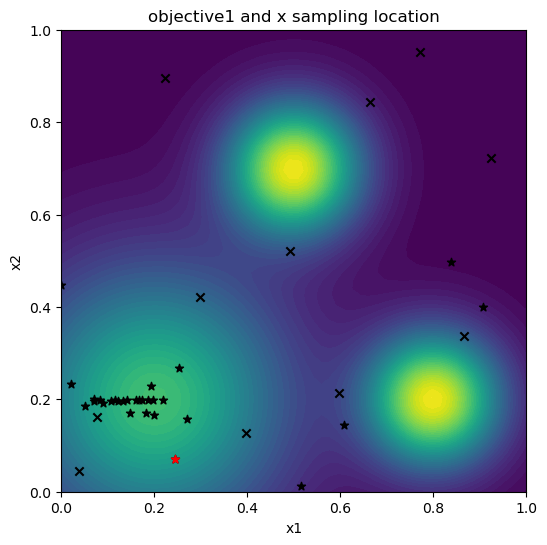

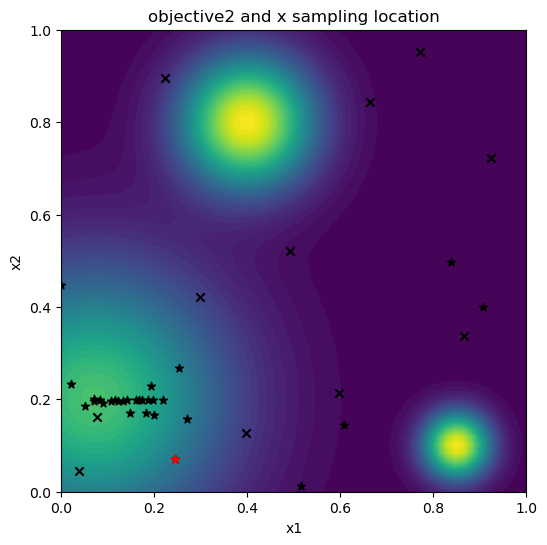

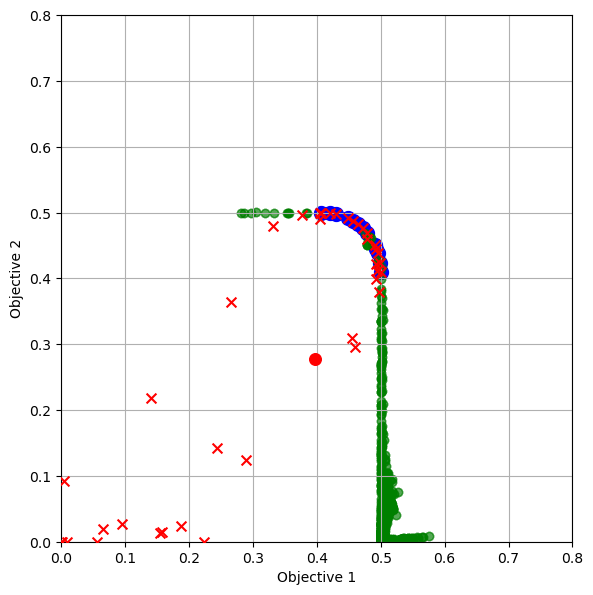

Iteration: 31
new candidats: tensor([[0.9252, 0.0108]], dtype=torch.float64)
new obj: tensor([[0.0538, 0.0460]], dtype=torch.float64)
Hypervolume (qPES): [0.07215986]
Time: 2.62005370100087


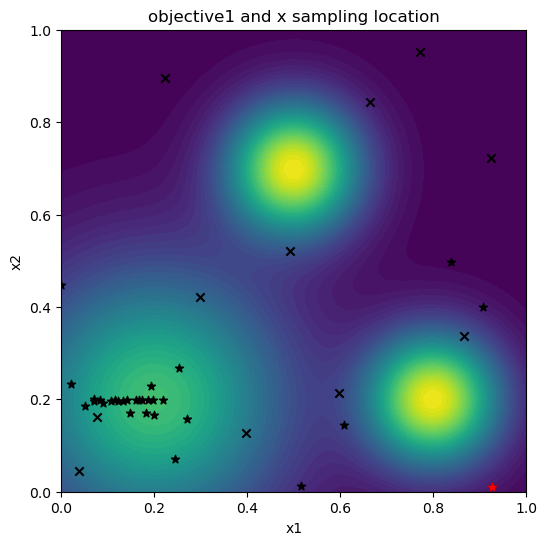

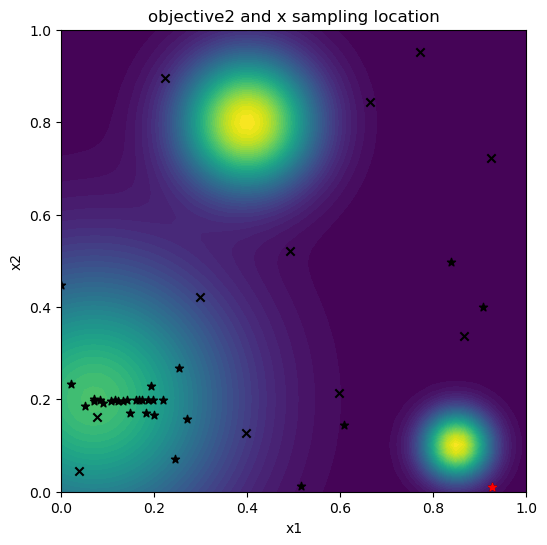

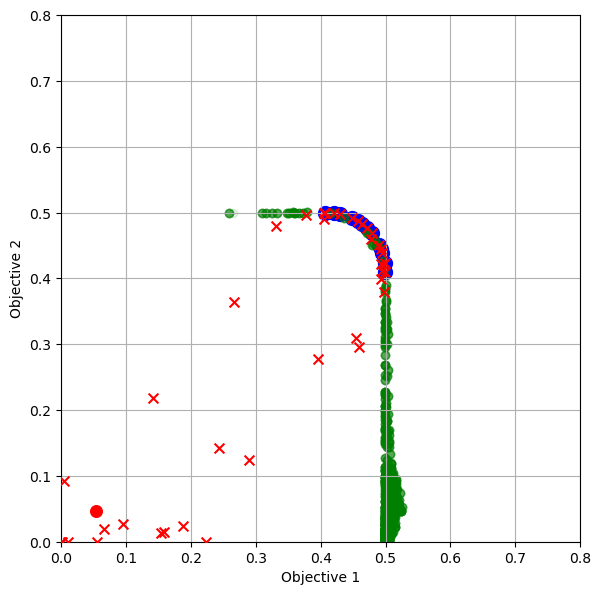

Iteration: 32
new candidats: tensor([[0.1788, 0.2001]], dtype=torch.float64)
new obj: tensor([[0.4972, 0.4313]], dtype=torch.float64)
Hypervolume (qPES): [0.07217571]
Time: 2.630387896002503


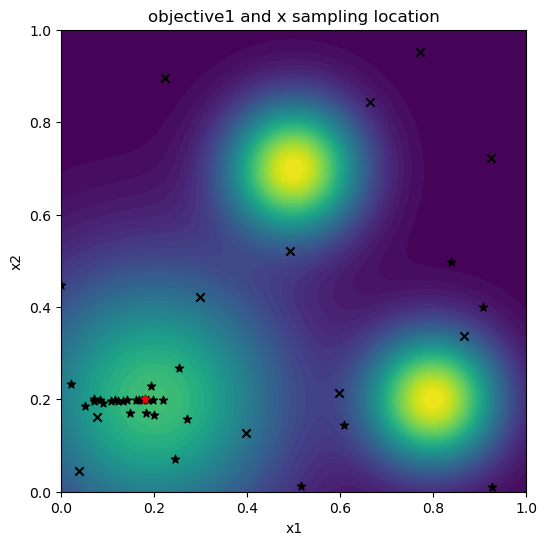

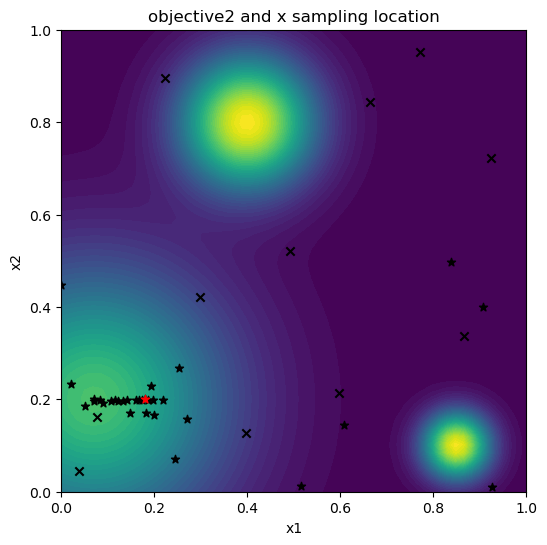

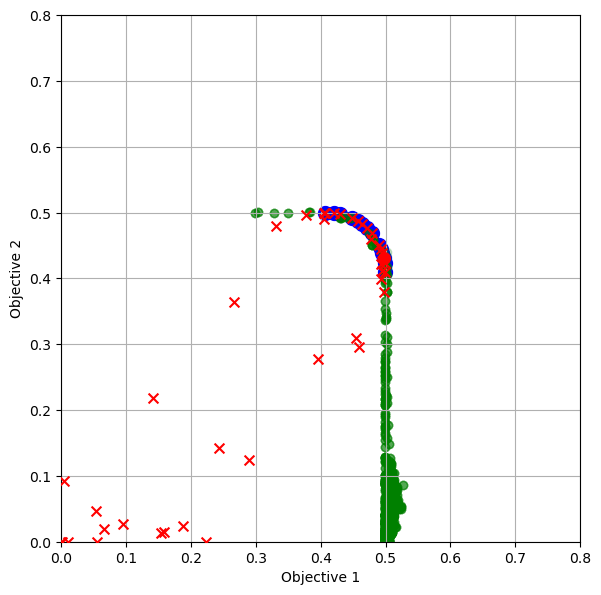

Iteration: 33
new candidats: tensor([[0.1112, 0.1995]], dtype=torch.float64)
new obj: tensor([[0.4531, 0.4895]], dtype=torch.float64)
Hypervolume (qPES): [0.07218399]
Time: 2.665214022999862


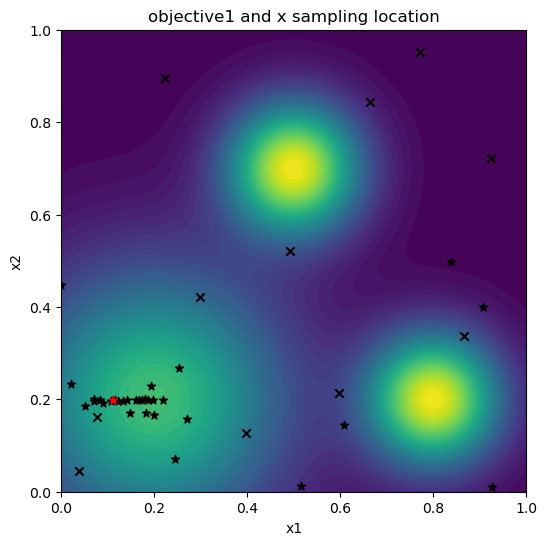

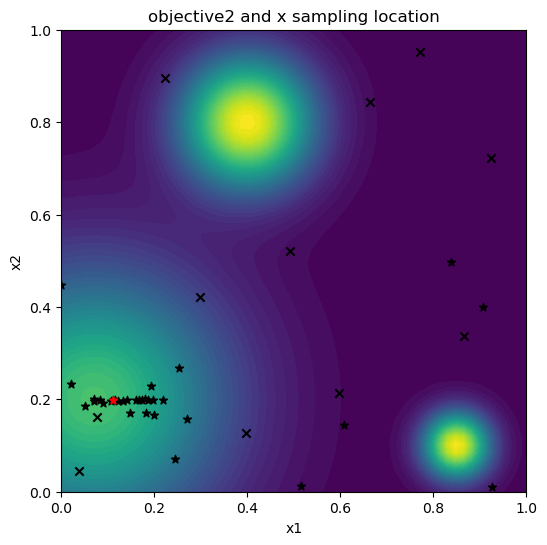

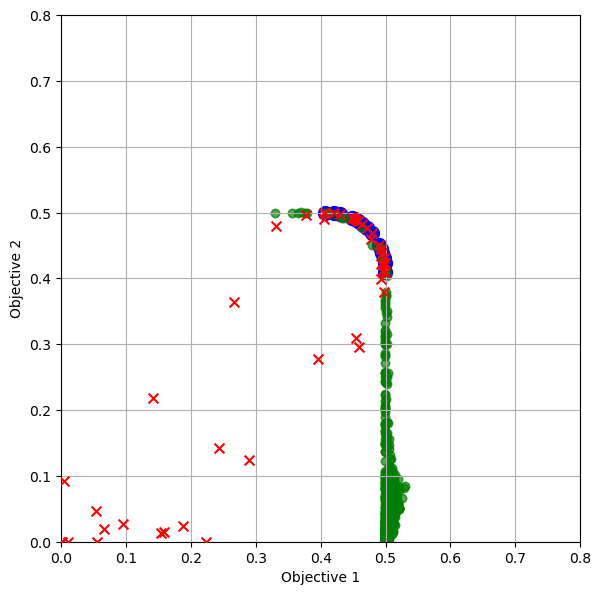

Iteration: 34
new candidats: tensor([[0.2000, 0.2010]], dtype=torch.float64)
new obj: tensor([[0.5000, 0.4048]], dtype=torch.float64)
Hypervolume (qPES): [0.07220693]
Time: 2.4197887479967903


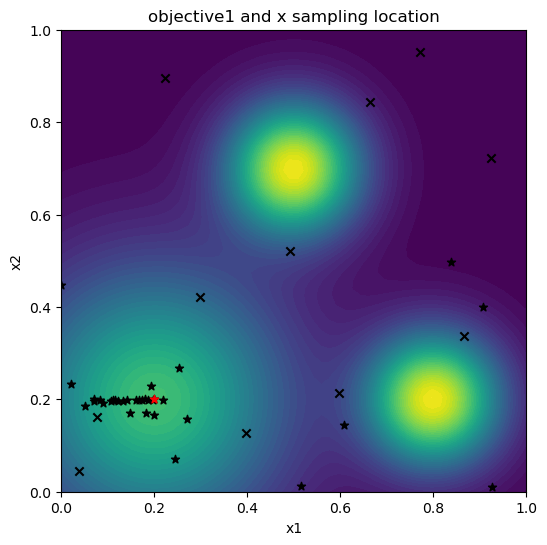

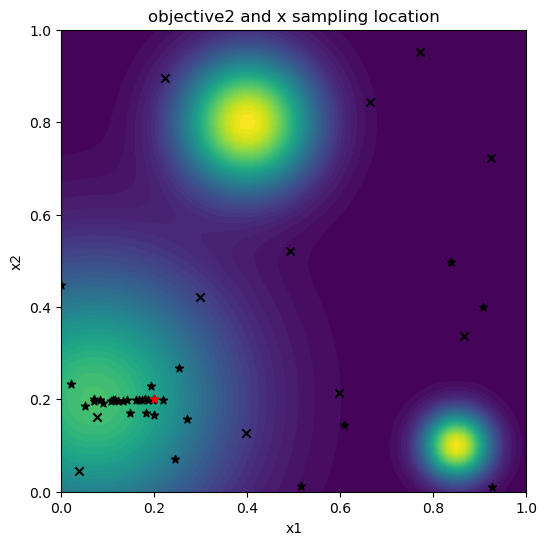

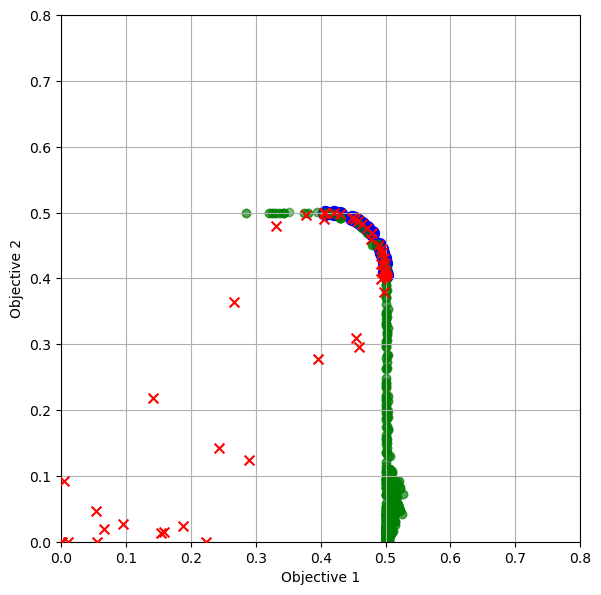

Iteration: 35
new candidats: tensor([[0.9905, 0.8004]], dtype=torch.float64)
new obj: tensor([[4.7631e-06, 1.5754e-07]], dtype=torch.float64)
Hypervolume (qPES): [0.07220693]
Time: 2.5856139740062645


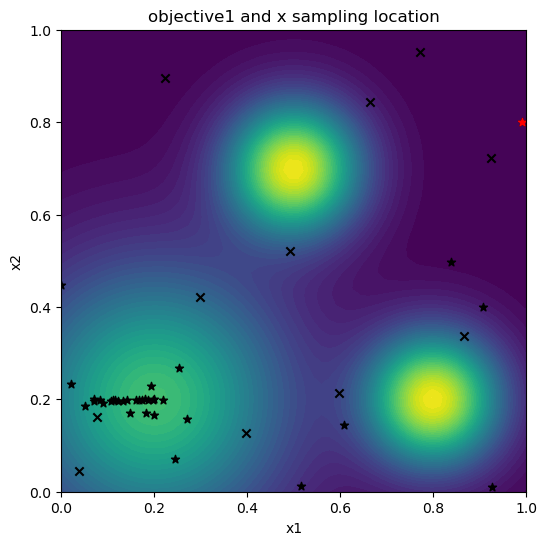

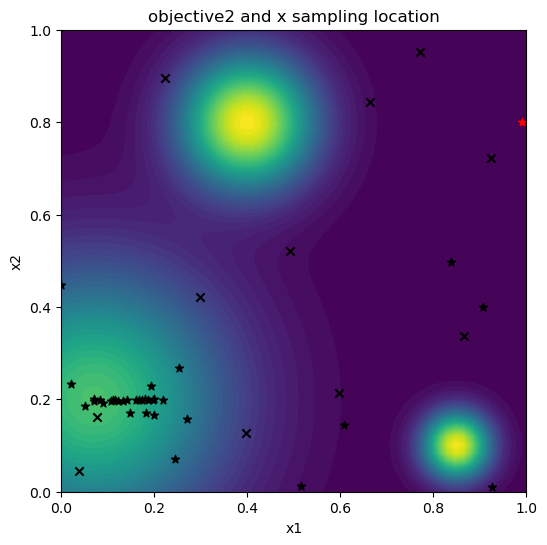

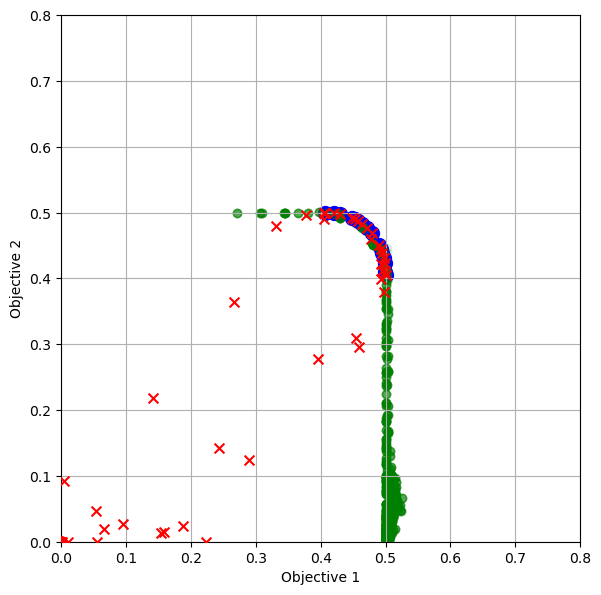

Iteration: 36
new candidats: tensor([[0.9007, 0.2056]], dtype=torch.float64)
new obj: tensor([[0.4220, 0.0451]], dtype=torch.float64)
Hypervolume (qPES): [0.07220693]
Time: 2.730360298999585


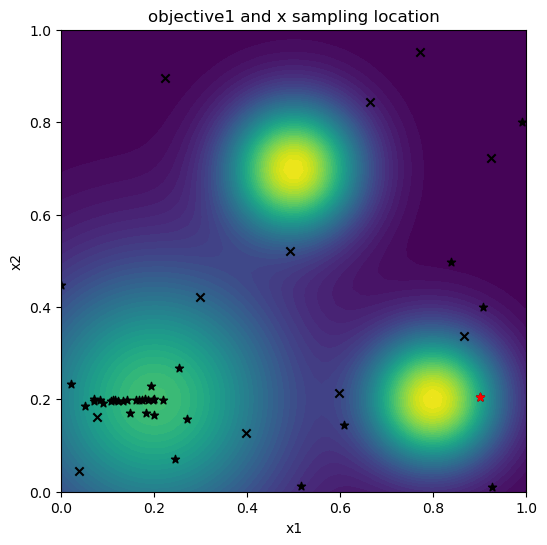

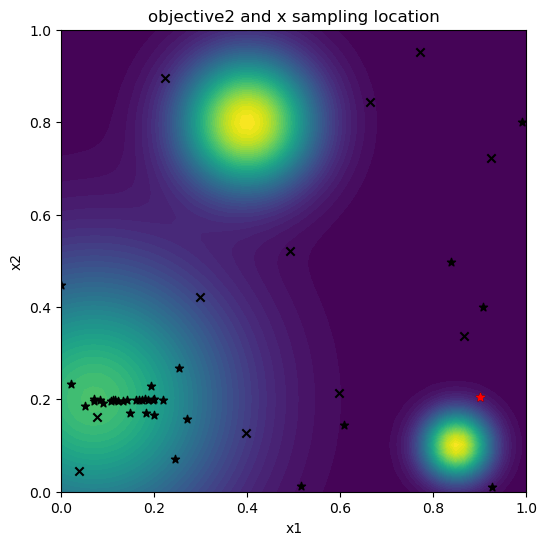

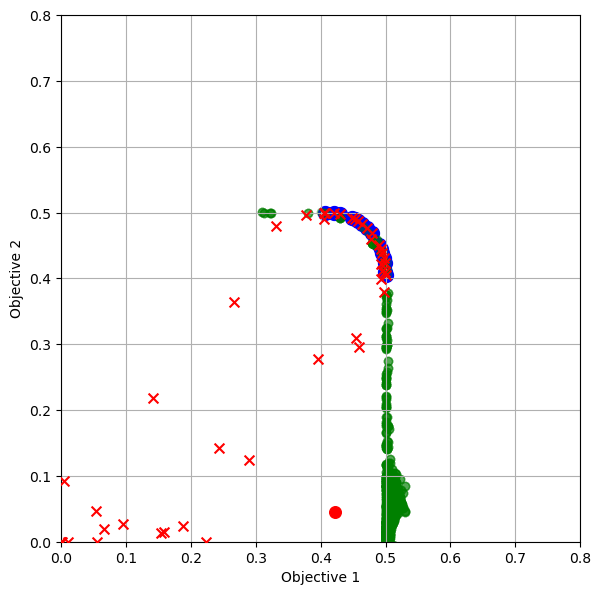

Iteration: 37
new candidats: tensor([[0.1511, 0.1998]], dtype=torch.float64)
new obj: tensor([[0.4853, 0.4605]], dtype=torch.float64)
Hypervolume (qPES): [0.07226812]
Time: 2.501222916995175


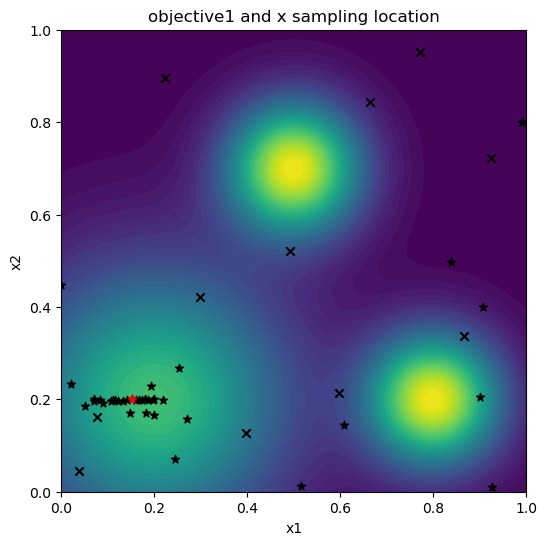

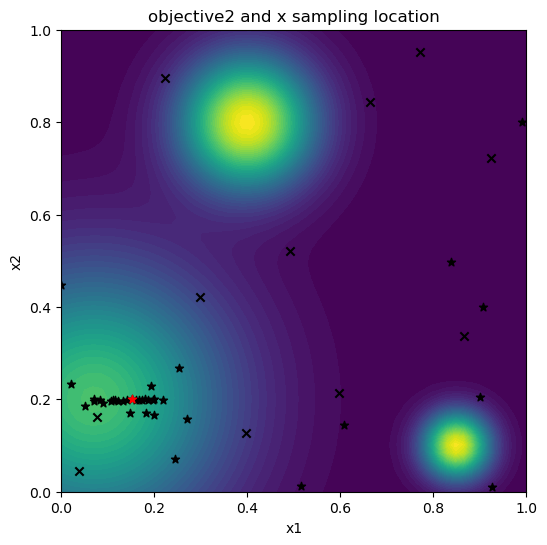

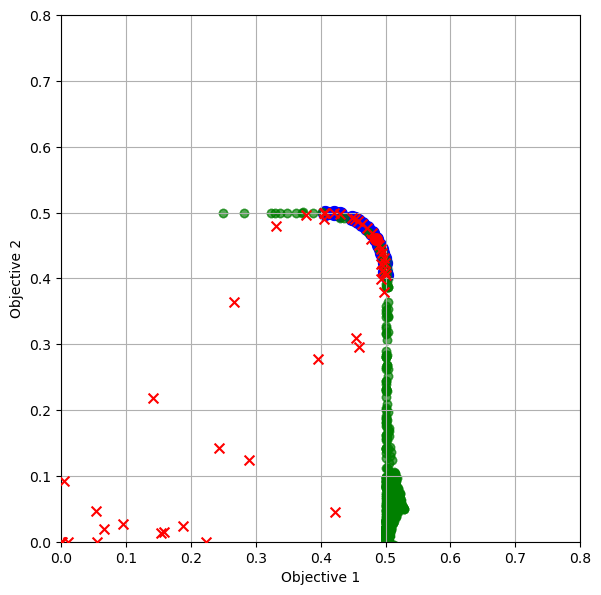

Iteration: 38
new candidats: tensor([[0.1261, 0.1734]], dtype=torch.float64)
new obj: tensor([[0.4629, 0.4764]], dtype=torch.float64)
Hypervolume (qPES): [0.07226812]
Time: 2.527719135003281


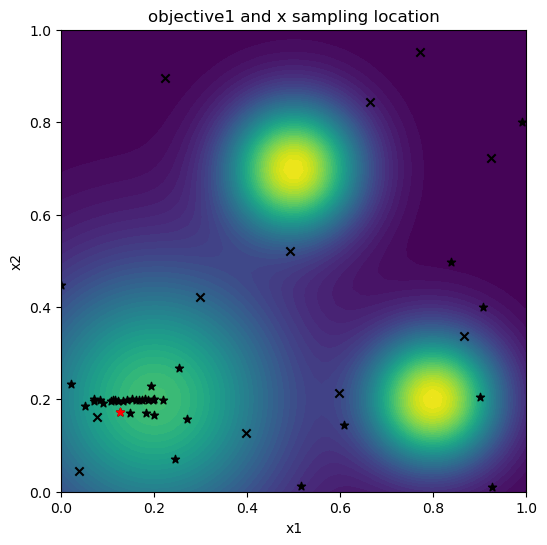

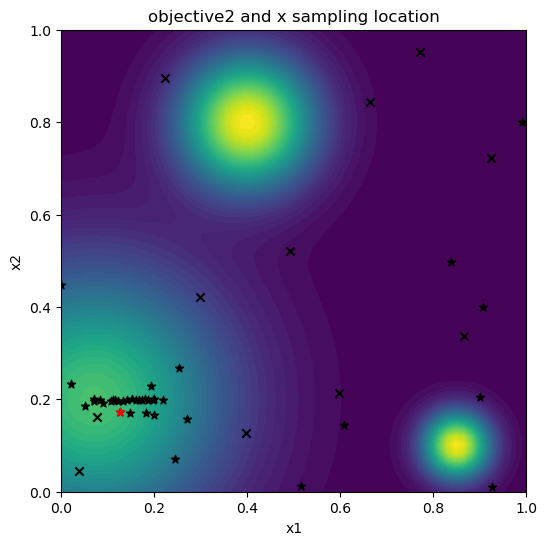

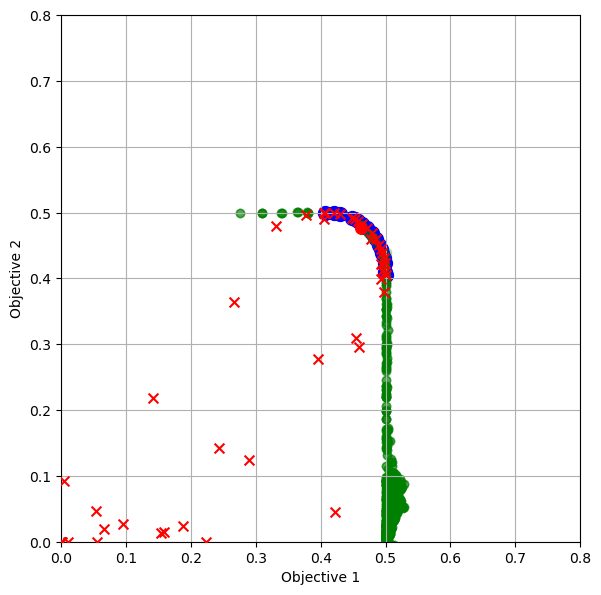

Iteration: 39
new candidats: tensor([[0.1561, 0.1999]], dtype=torch.float64)
new obj: tensor([[0.4881, 0.4558]], dtype=torch.float64)
Hypervolume (qPES): [0.07228231]
Time: 2.6932023639965337


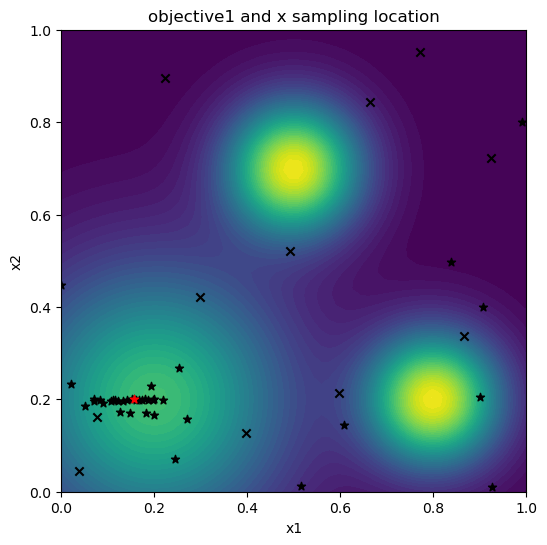

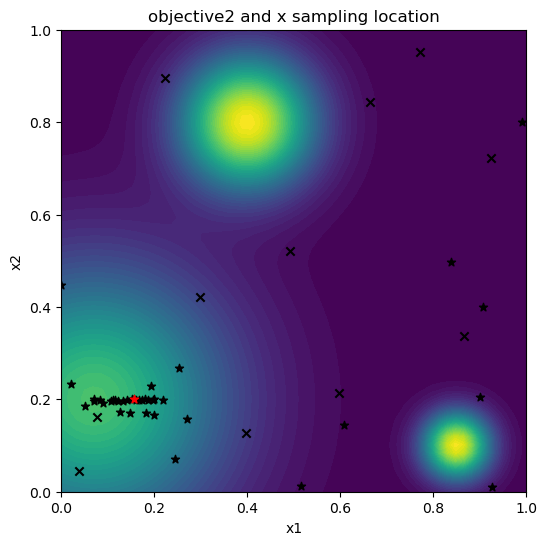

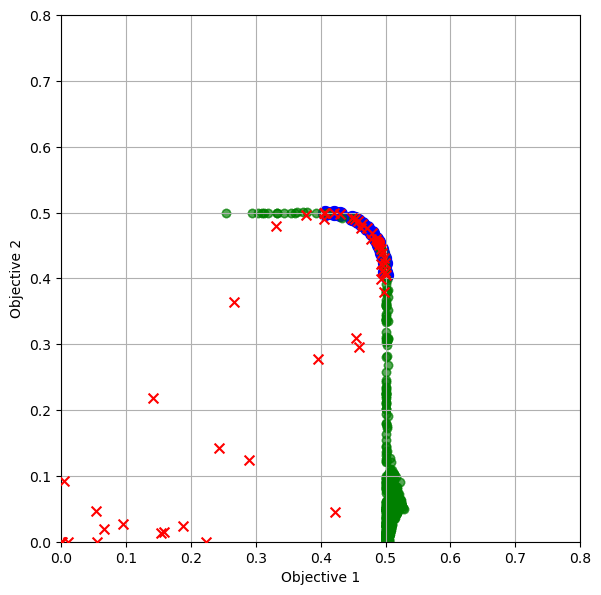

Iteration: 40
new candidats: tensor([[0.8801, 0.1785]], dtype=torch.float64)
new obj: tensor([[0.4979, 0.1705]], dtype=torch.float64)
Hypervolume (qPES): [0.07228231]
Time: 2.448074212006759


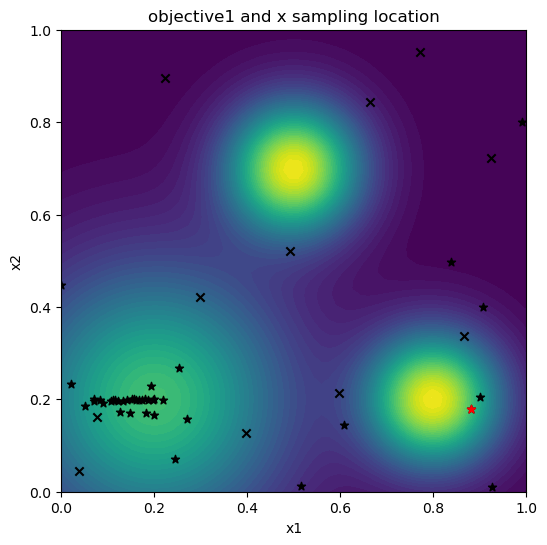

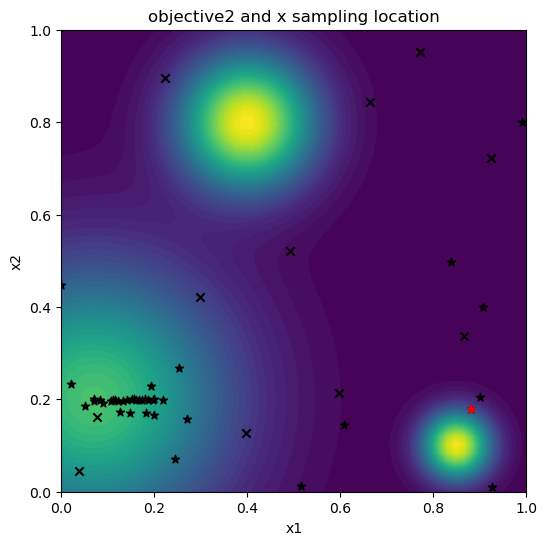

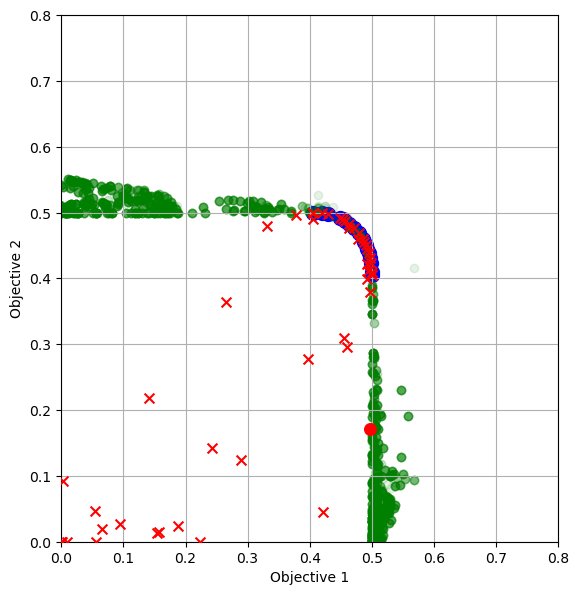

Iteration: 41
new candidats: tensor([[0.0998, 0.2019]], dtype=torch.float64)
new obj: tensor([[0.4410, 0.4944]], dtype=torch.float64)
Hypervolume (qPES): [0.0723172]
Time: 2.9522734109923476


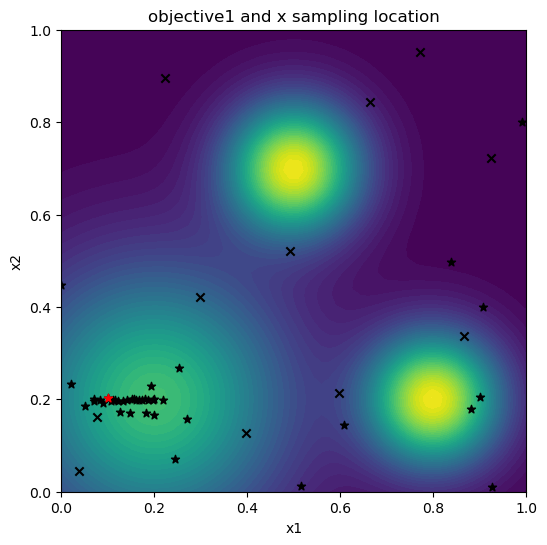

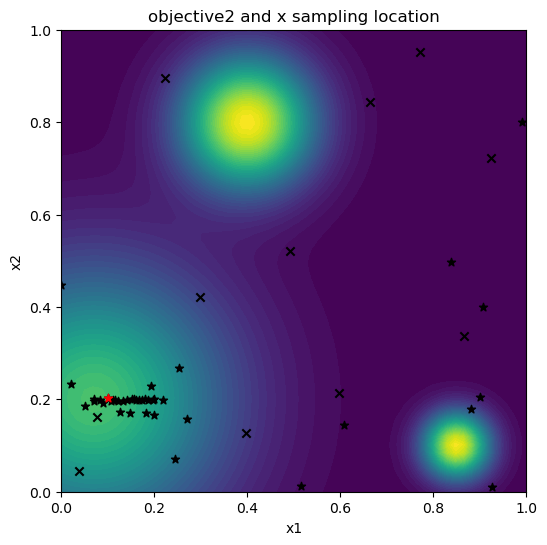

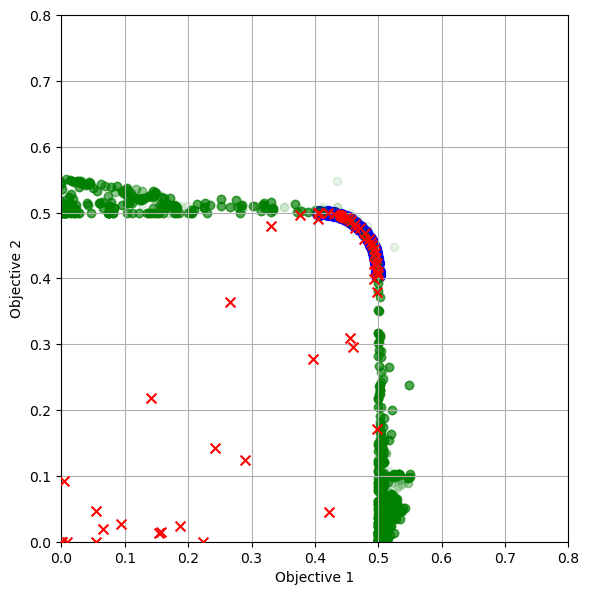

Iteration: 42
new candidats: tensor([[0.0685, 0.1158]], dtype=torch.float64)
new obj: tensor([[0.3686, 0.4576]], dtype=torch.float64)
Hypervolume (qPES): [0.0723172]
Time: 2.802885511002387


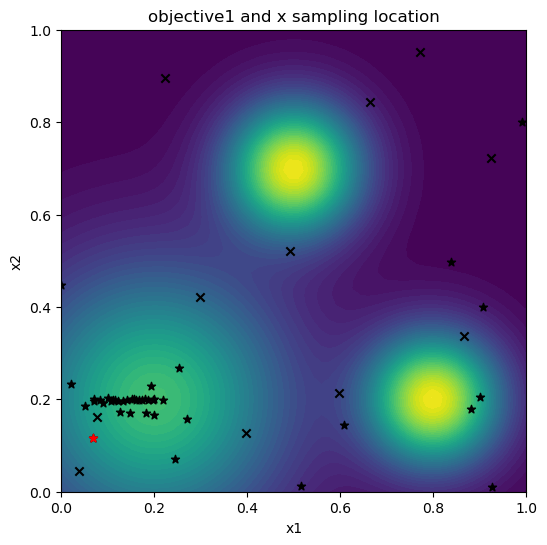

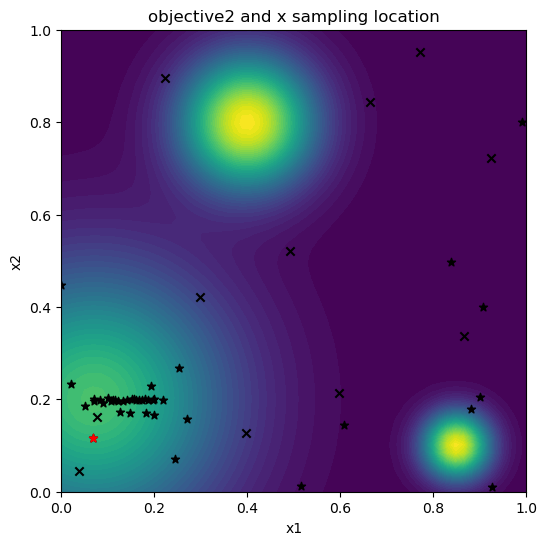

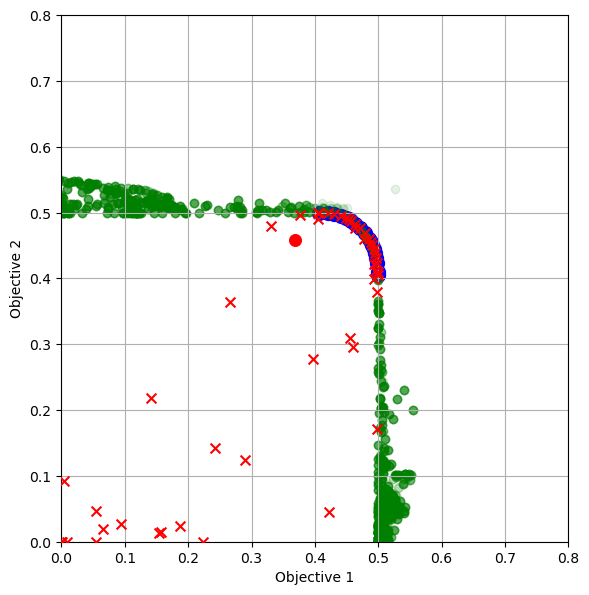

Iteration: 43
new candidats: tensor([[0.8463, 0.1390]], dtype=torch.float64)
new obj: tensor([[0.5245, 0.5156]], dtype=torch.float64)
Hypervolume (qPES): [0.08559038]
Time: 2.5631203090015333


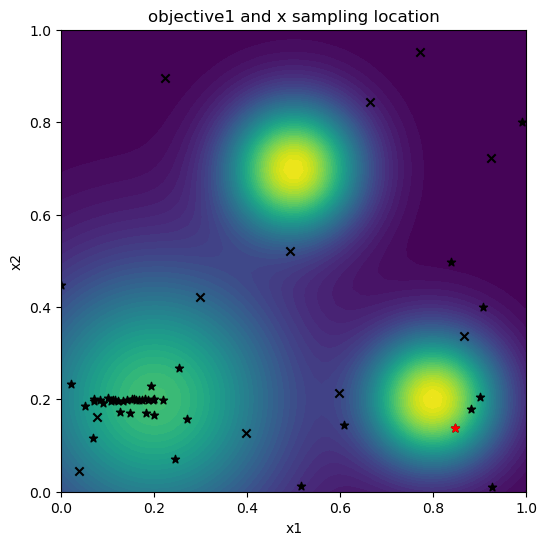

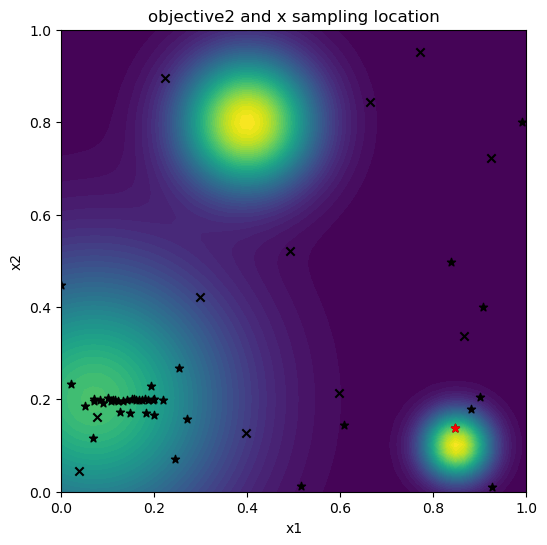

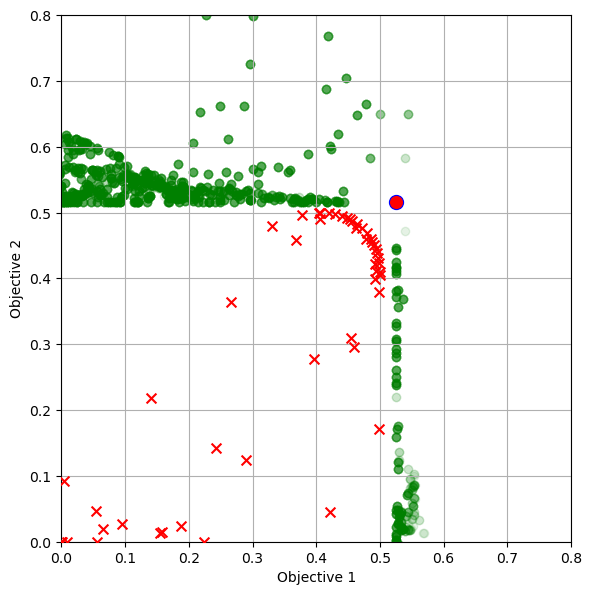

Iteration: 44
new candidats: tensor([[0.7926, 0.1231]], dtype=torch.float64)
new obj: tensor([[0.5250, 0.3264]], dtype=torch.float64)
Hypervolume (qPES): [0.08564193]
Time: 2.807999999000458


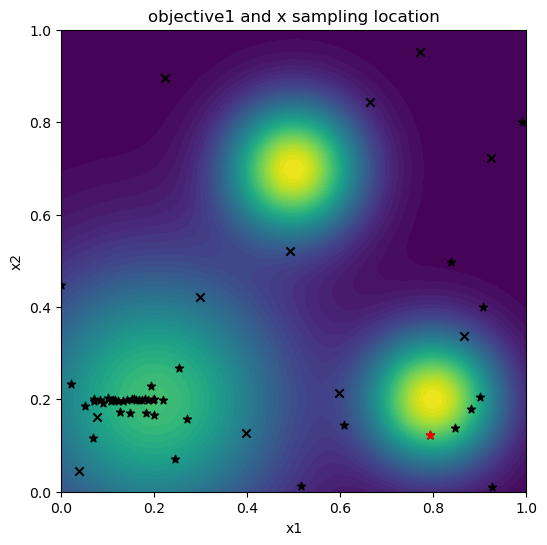

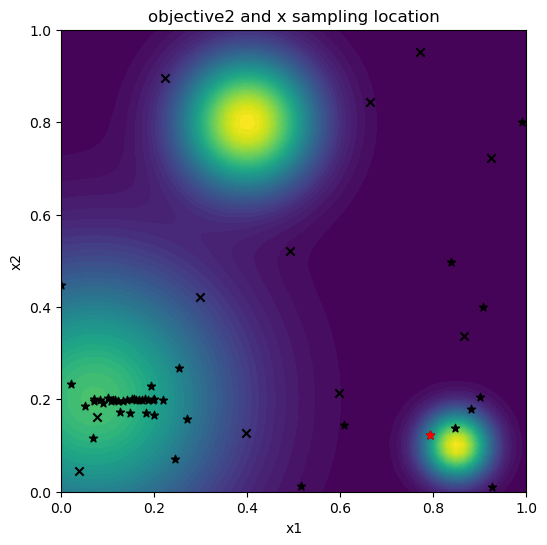

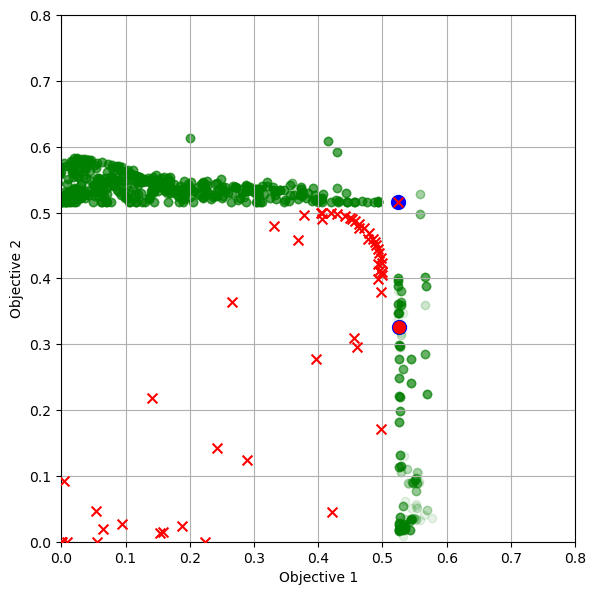

Iteration: 45
new candidats: tensor([[0.8344, 0.1001]], dtype=torch.float64)
new obj: tensor([[0.4035, 0.6669]], dtype=torch.float64)
Hypervolume (qPES): [0.11132541]
Time: 2.8715063349955017


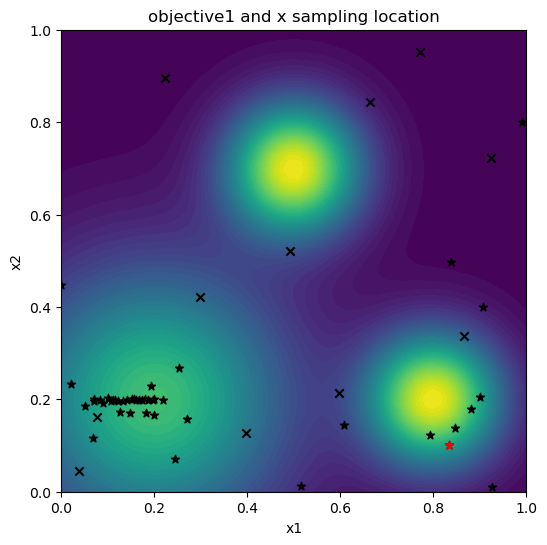

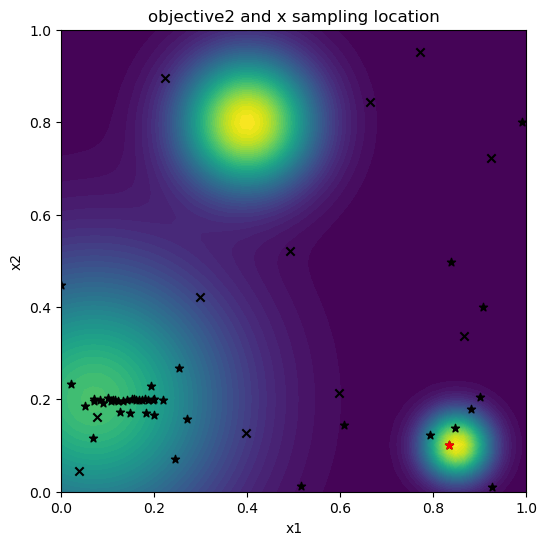

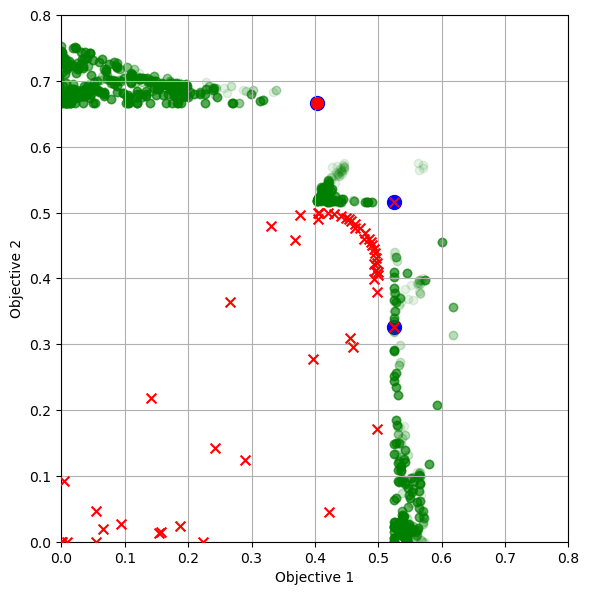

Iteration: 46
new candidats: tensor([[0.8243, 0.1625]], dtype=torch.float64)
new obj: tensor([[0.6373, 0.2812]], dtype=torch.float64)
Hypervolume (qPES): [0.11807211]
Time: 2.558593497000402


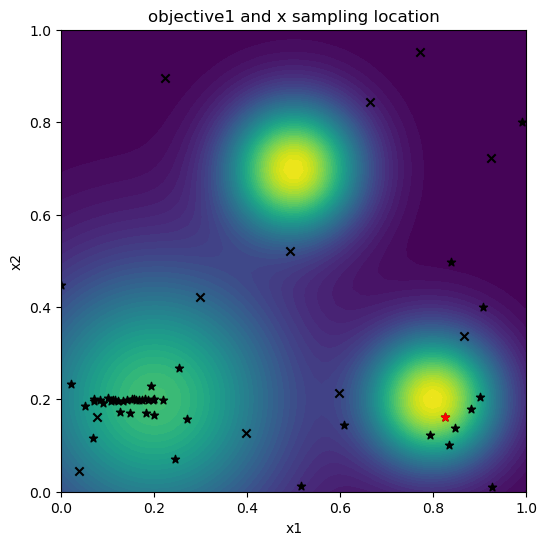

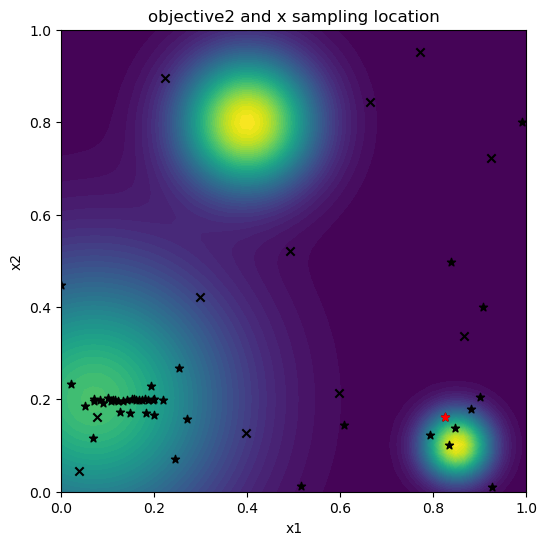

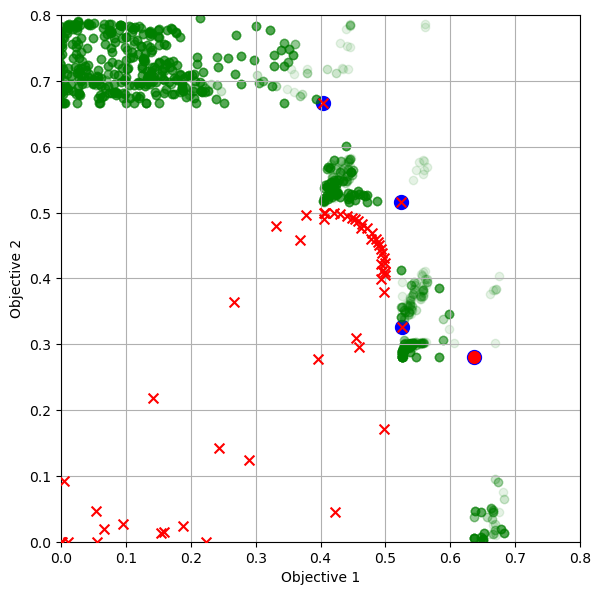

Iteration: 47
new candidats: tensor([[0.8221, 0.1478]], dtype=torch.float64)
new obj: tensor([[0.6000, 0.3797]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.9005552809976507


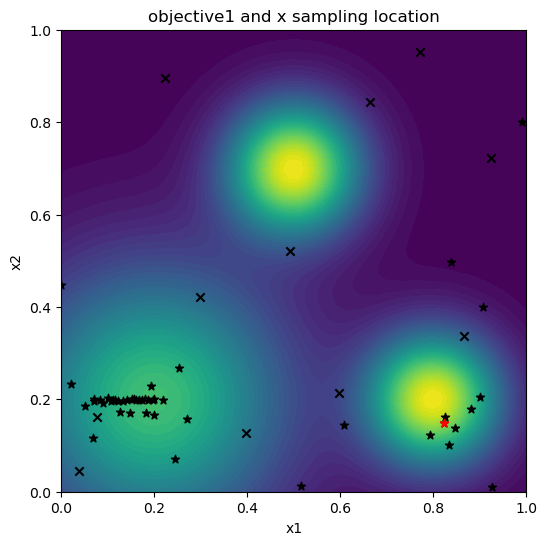

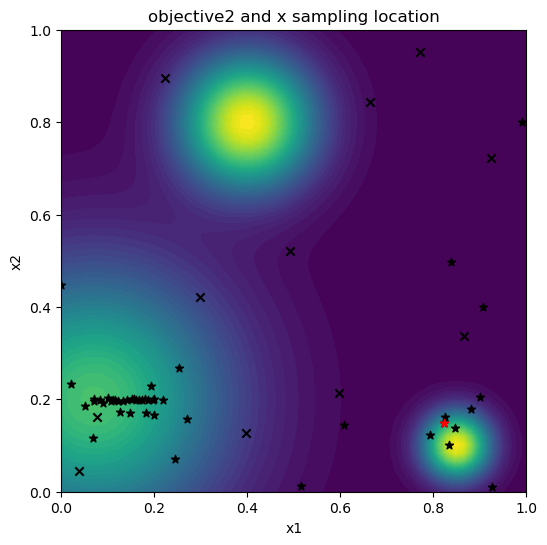

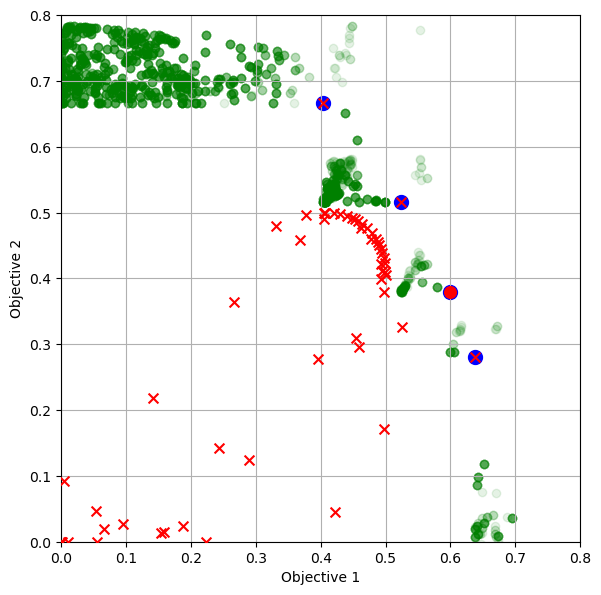

Iteration: 48
new candidats: tensor([[0.8805, 0.1073]], dtype=torch.float64)
new obj: tensor([[0.3309, 0.5748]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.78122120500484


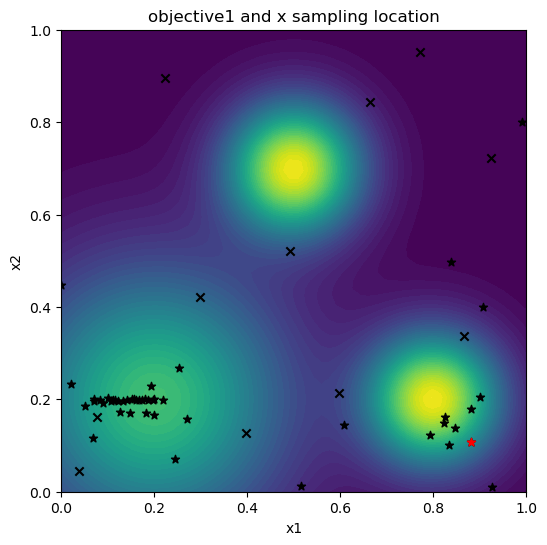

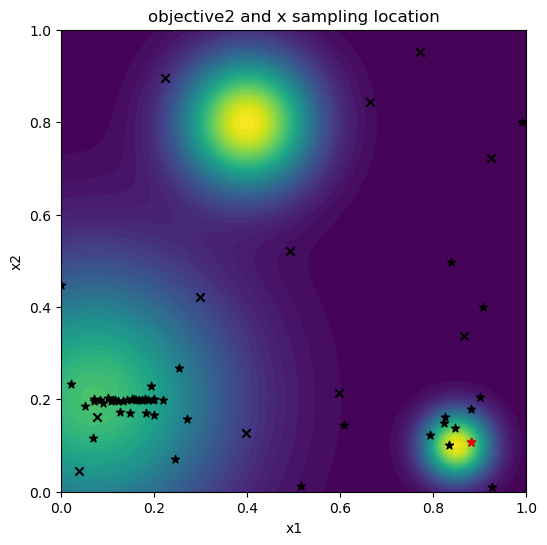

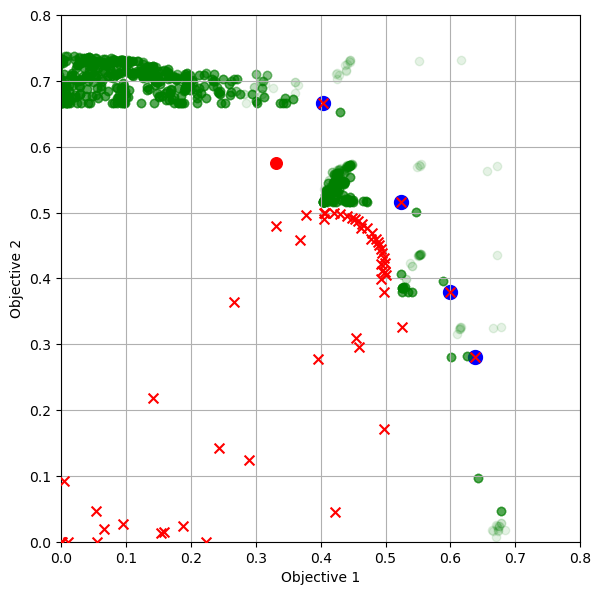

Iteration: 49
new candidats: tensor([[0.9602, 0.6770]], dtype=torch.float64)
new obj: tensor([[4.0580e-05, 1.5015e-06]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.326298992993543


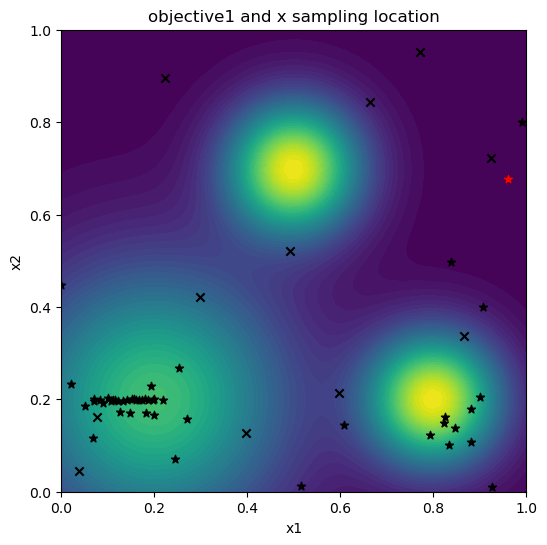

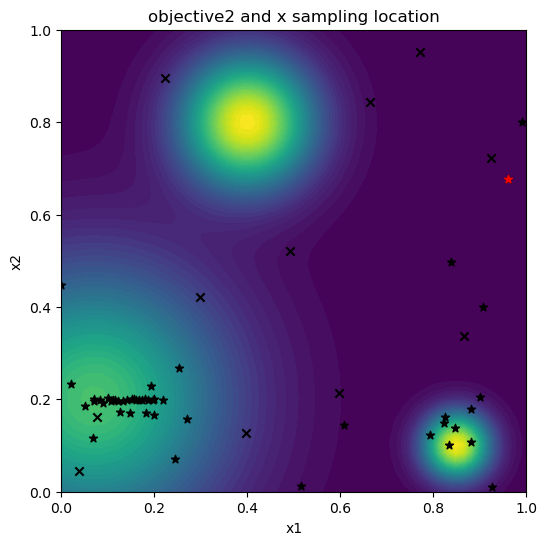

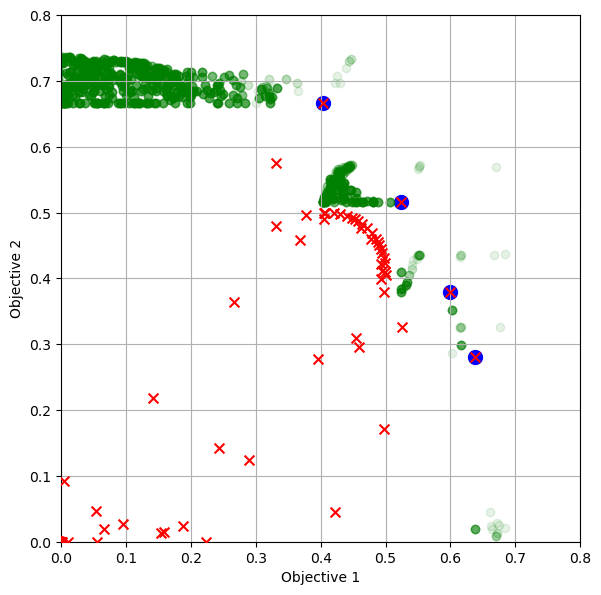

Iteration: 50
new candidats: tensor([[0., 1.]], dtype=torch.float64)
new obj: tensor([[0.0001, 0.0002]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.5376662880007643


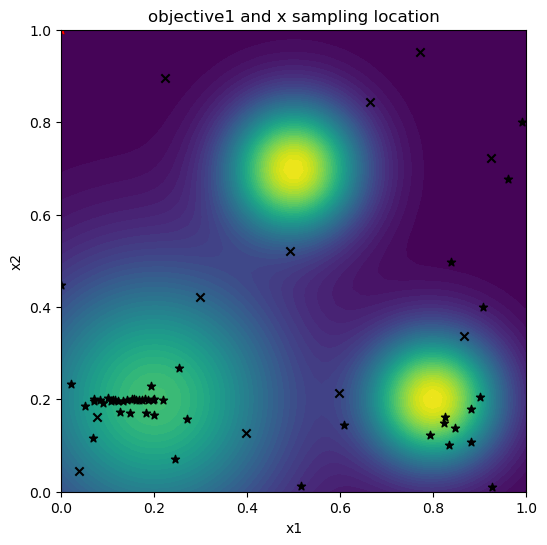

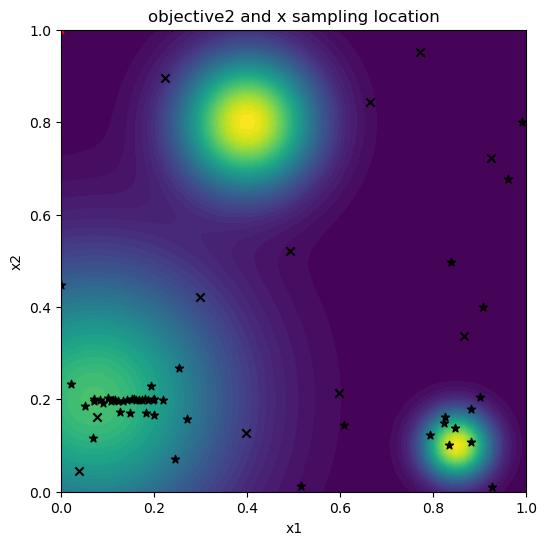

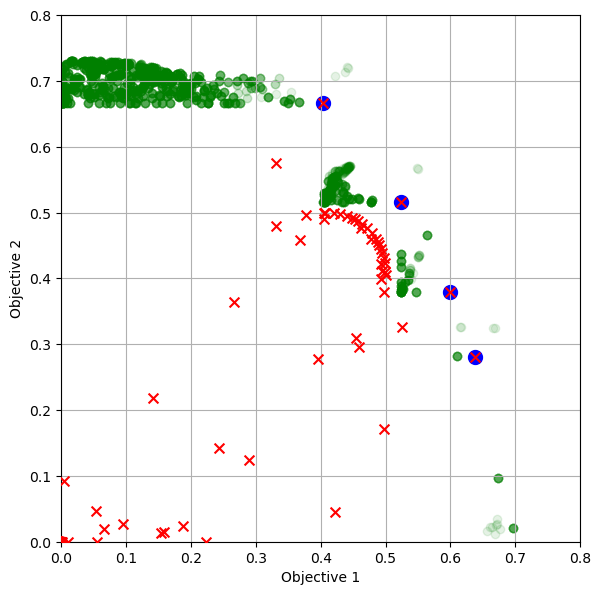

Iteration: 51
new candidats: tensor([[0.1167, 0.3265]], dtype=torch.float64)
new obj: tensor([[0.3753, 0.3983]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.793781982996734


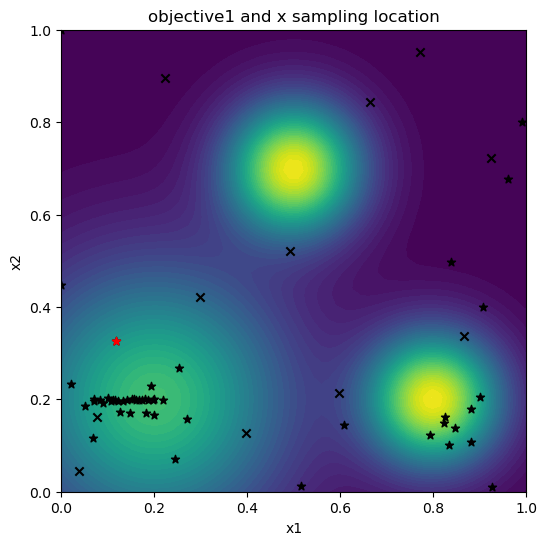

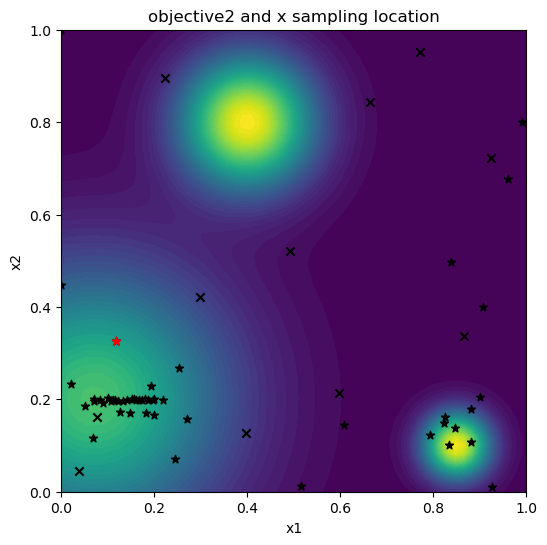

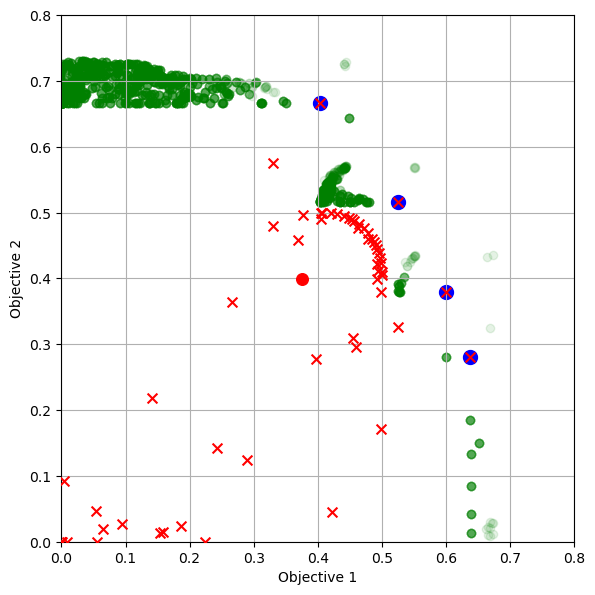

Iteration: 52
new candidats: tensor([[0.0883, 0.0952]], dtype=torch.float64)
new obj: tensor([[0.3729, 0.4340]], dtype=torch.float64)
Hypervolume (qPES): [0.12548712]
Time: 2.6813703189982334


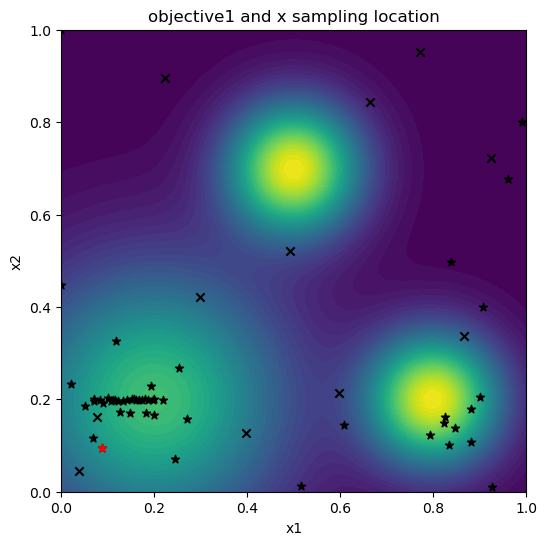

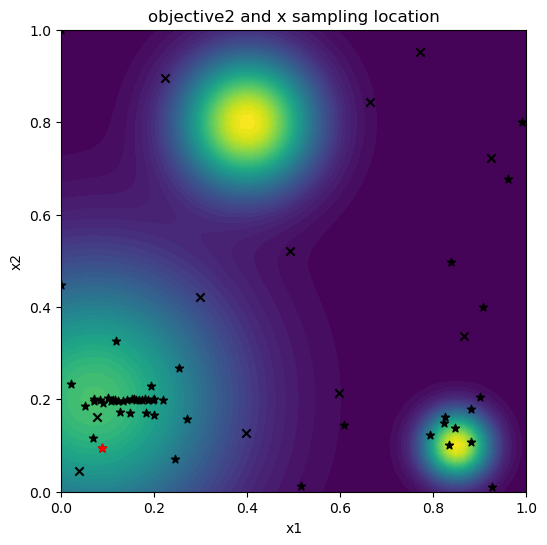

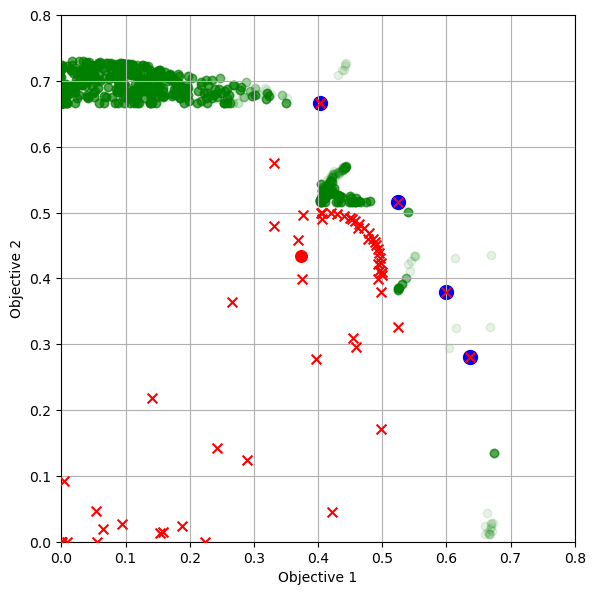

Iteration: 53
new candidats: tensor([[0.8140, 0.1136]], dtype=torch.float64)
new obj: tensor([[0.4812, 0.5209]], dtype=torch.float64)
Hypervolume (qPES): [0.1259022]
Time: 2.3989490320091136


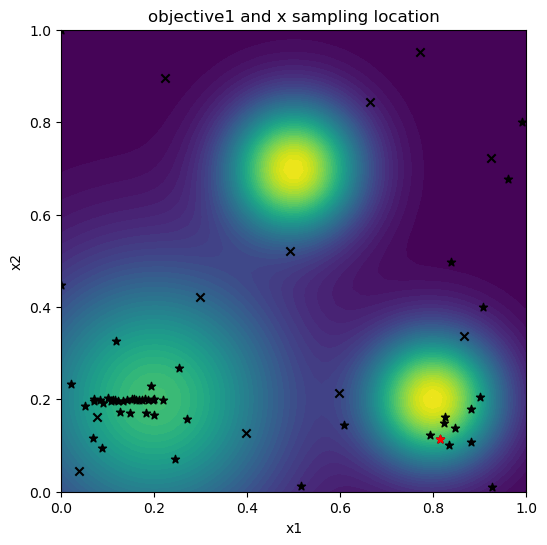

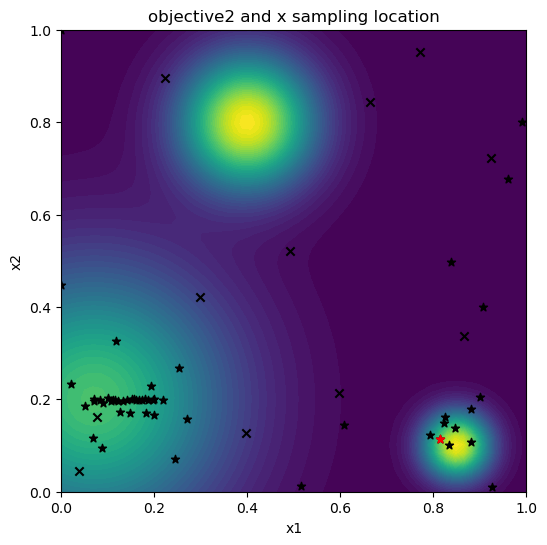

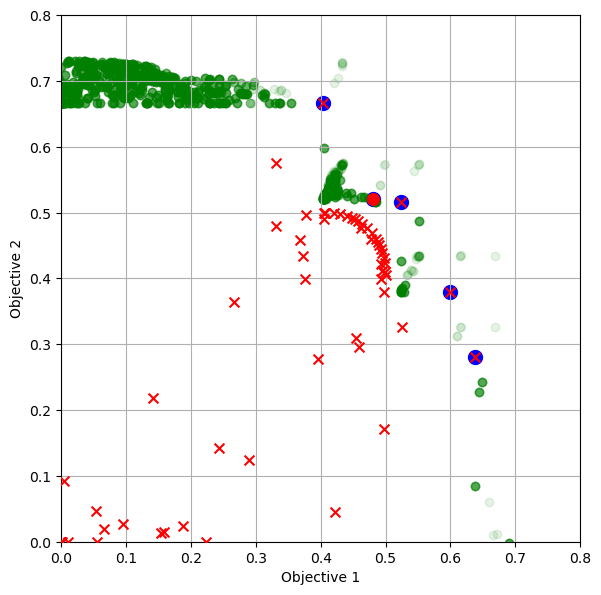

Iteration: 54
new candidats: tensor([[0.6537, 0.7193]], dtype=torch.float64)
new obj: tensor([[0.2122, 0.0205]], dtype=torch.float64)
Hypervolume (qPES): [0.1259022]
Time: 2.5295349299994996


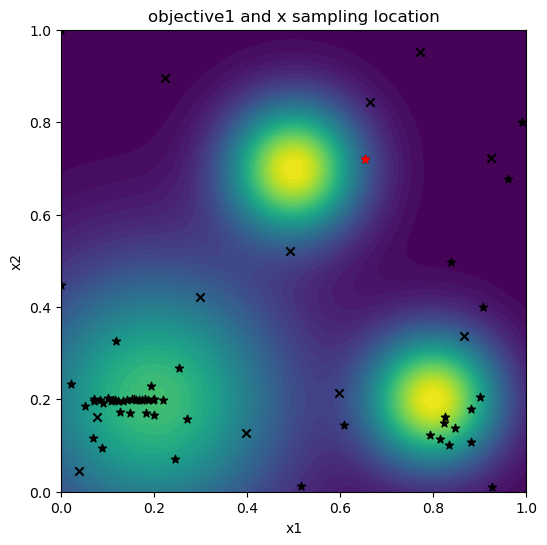

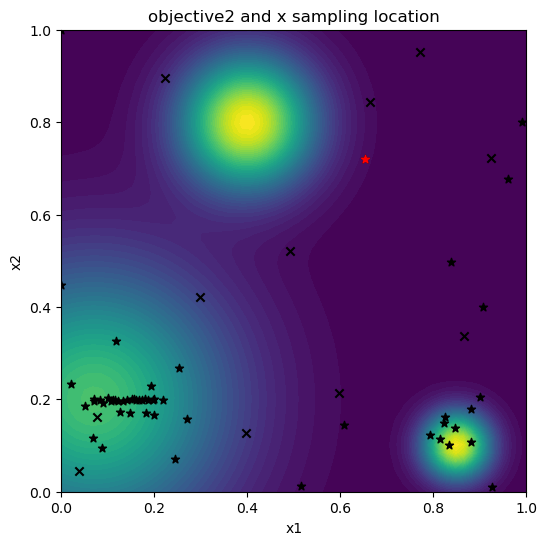

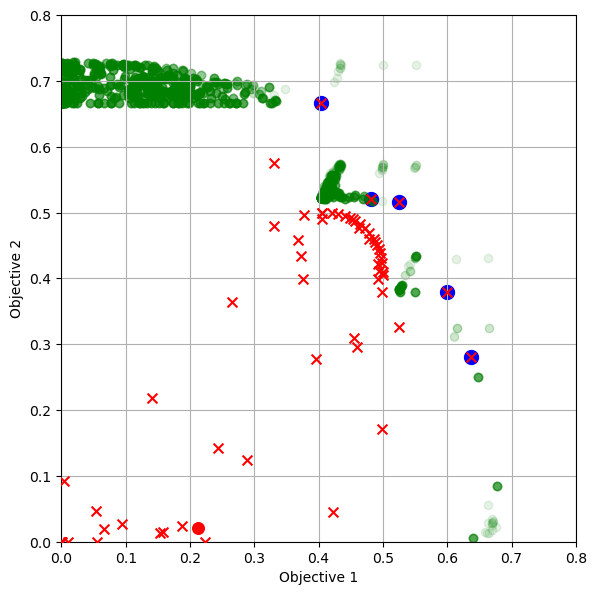

Iteration: 55
new candidats: tensor([[0.8393, 0.1209]], dtype=torch.float64)
new obj: tensor([[0.4768, 0.6271]], dtype=torch.float64)
Hypervolume (qPES): [0.13368907]
Time: 2.8721097509987885


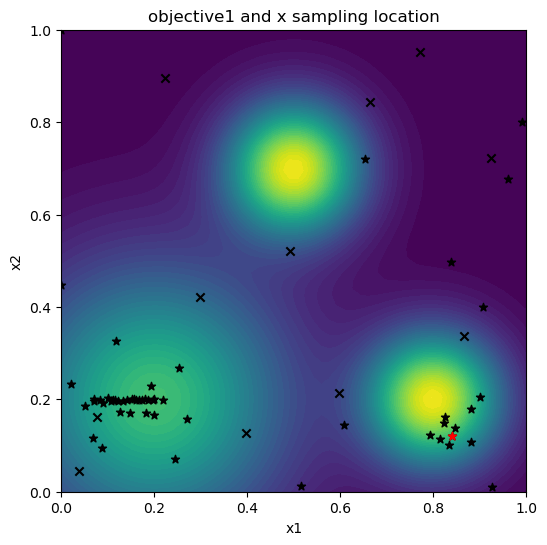

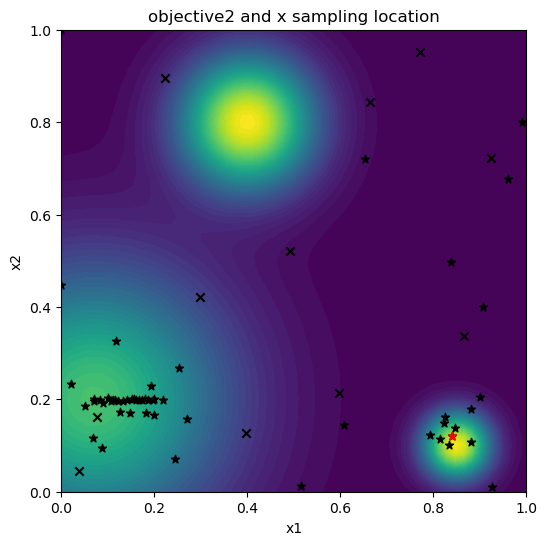

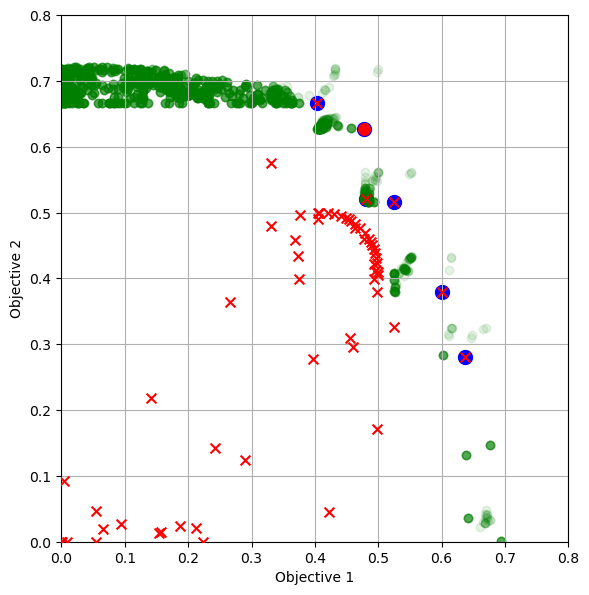

Iteration: 56
new candidats: tensor([[0.3996, 0.7232]], dtype=torch.float64)
new obj: tensor([[0.4217, 0.5256]], dtype=torch.float64)
Hypervolume (qPES): [0.13368907]
Time: 3.085806239992962


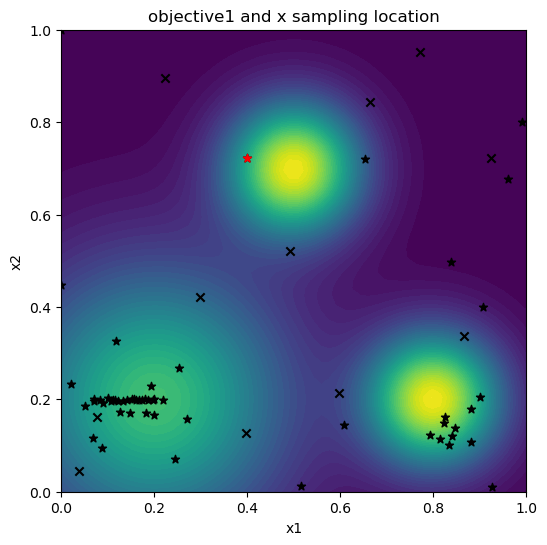

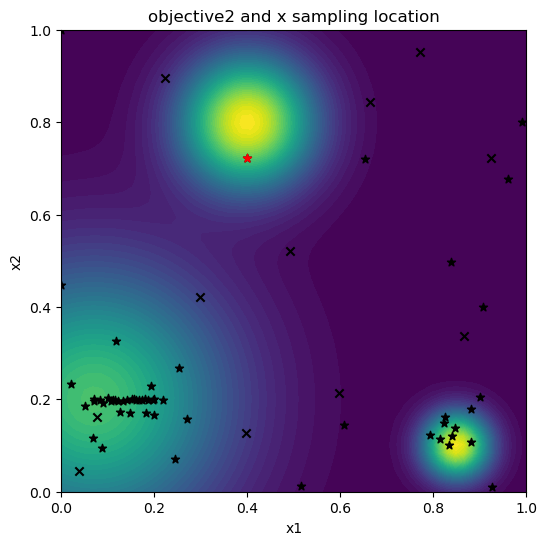

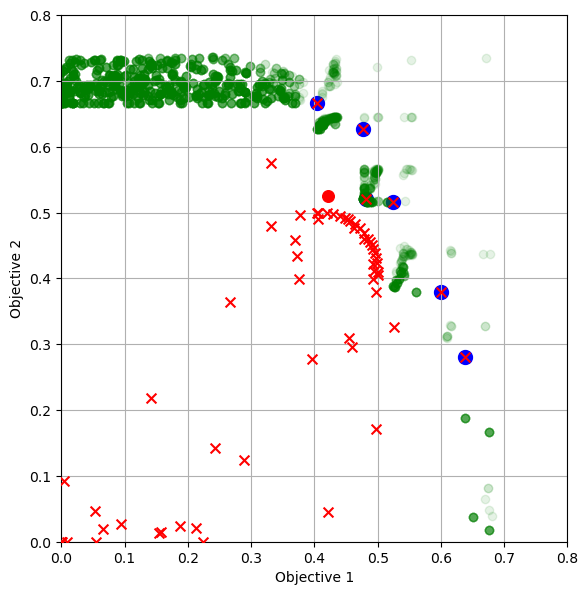

Iteration: 57
new candidats: tensor([[0.4264, 0.7929]], dtype=torch.float64)
new obj: tensor([[0.3502, 0.6755]], dtype=torch.float64)
Hypervolume (qPES): [0.13469139]
Time: 2.598457860003691


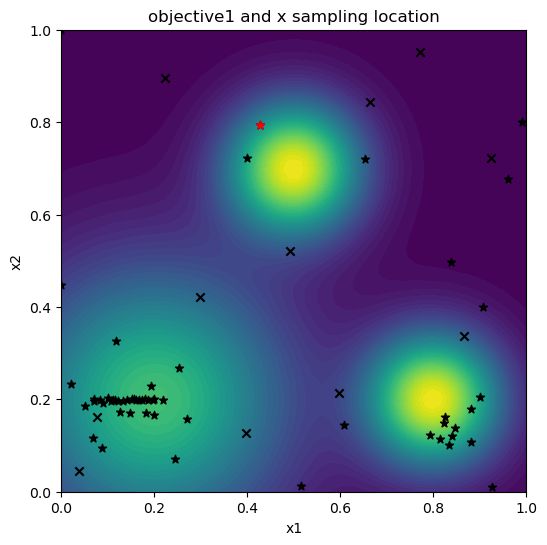

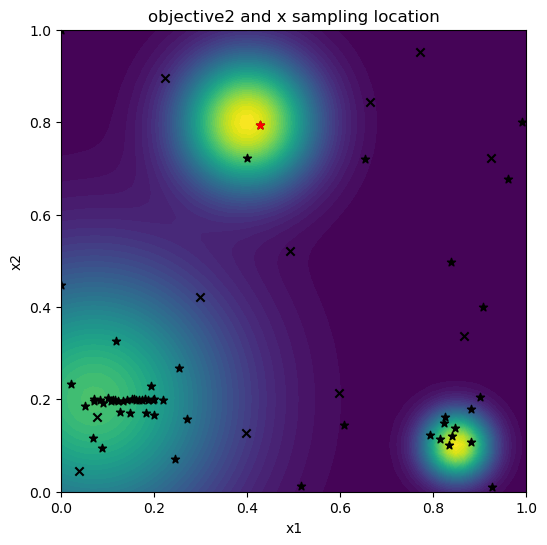

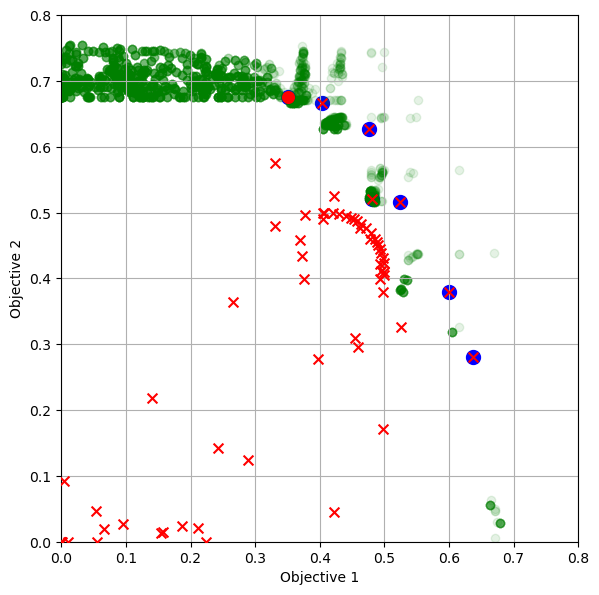

Iteration: 58
new candidats: tensor([[0.4589, 0.7676]], dtype=torch.float64)
new obj: tensor([[0.5159, 0.5596]], dtype=torch.float64)
Hypervolume (qPES): [0.1363896]
Time: 3.0954394190048333


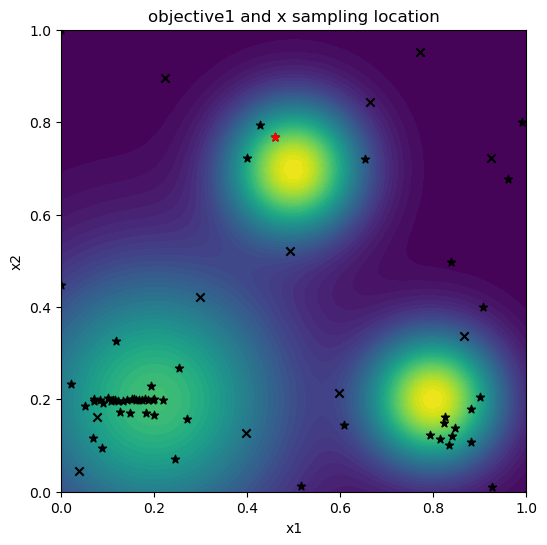

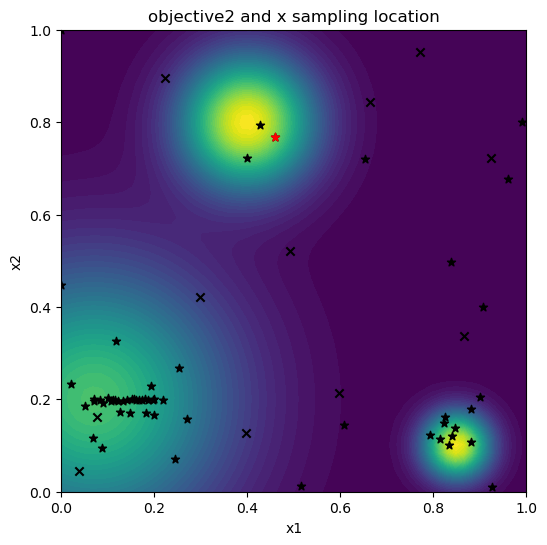

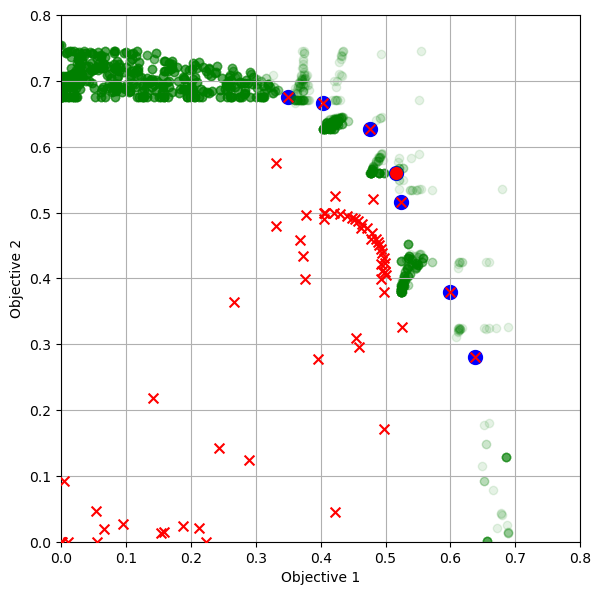

Iteration: 59
new candidats: tensor([[0.4674, 0.7428]], dtype=torch.float64)
new obj: tensor([[0.6108, 0.4754]], dtype=torch.float64)
Hypervolume (qPES): [0.14571891]
Time: 2.9053346939908806


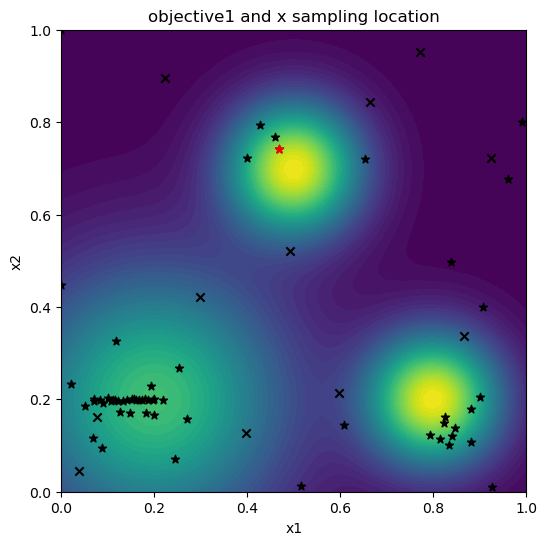

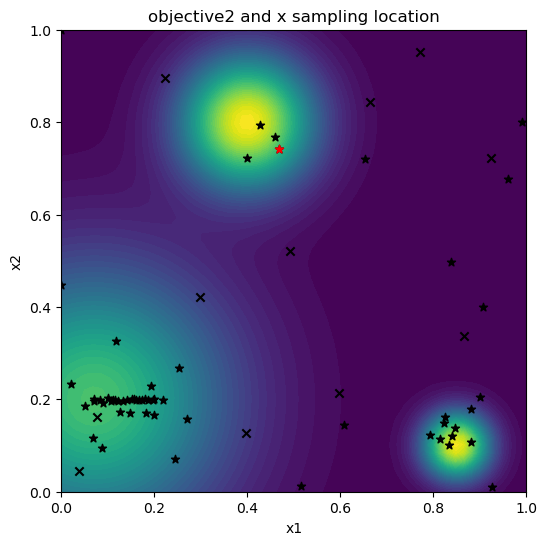

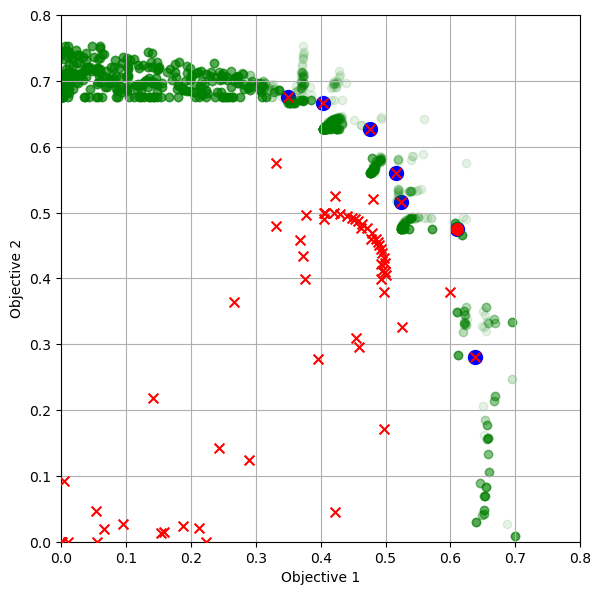

Iteration: 60
new candidats: tensor([[0.4807, 0.7180]], dtype=torch.float64)
new obj: tensor([[0.6827, 0.3630]], dtype=torch.float64)
Hypervolume (qPES): [0.15432915]
Time: 2.679330740997102


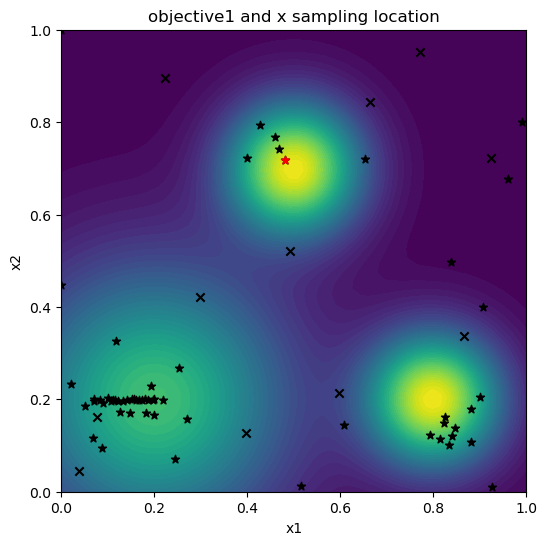

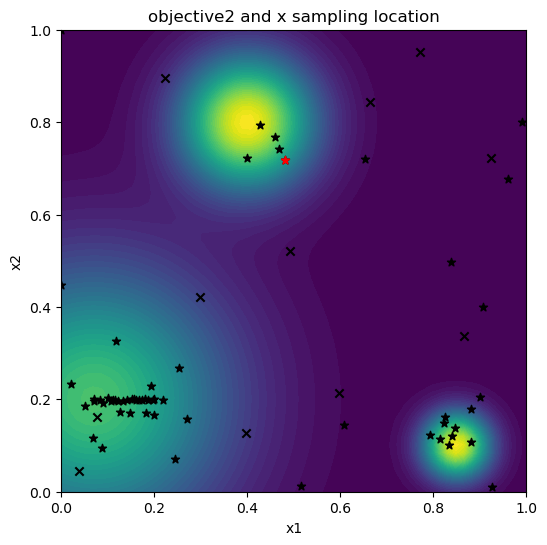

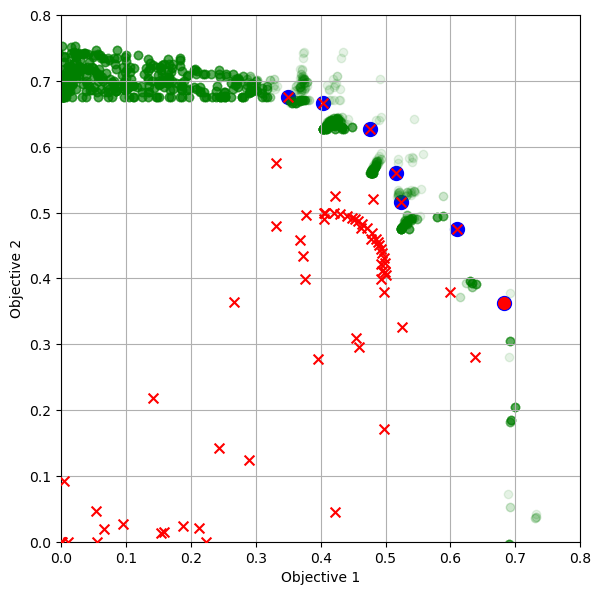

Iteration: 61
new candidats: tensor([[0.4530, 0.8958]], dtype=torch.float64)
new obj: tensor([[0.0928, 0.3848]], dtype=torch.float64)
Hypervolume (qPES): [0.15432915]
Time: 2.6340411730052438


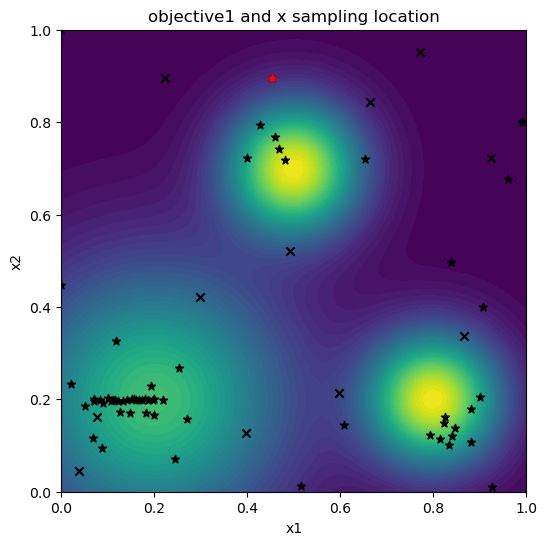

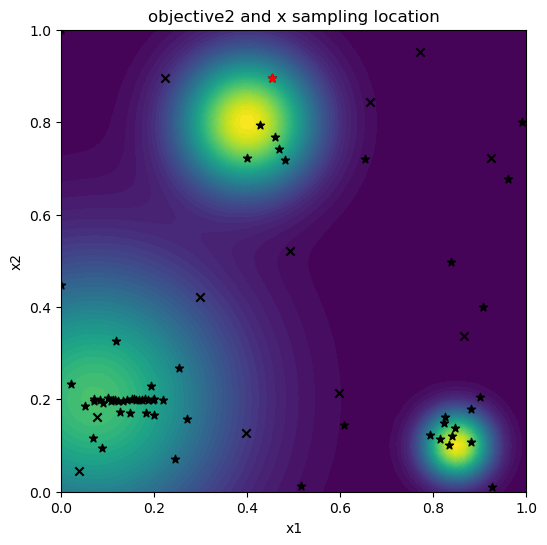

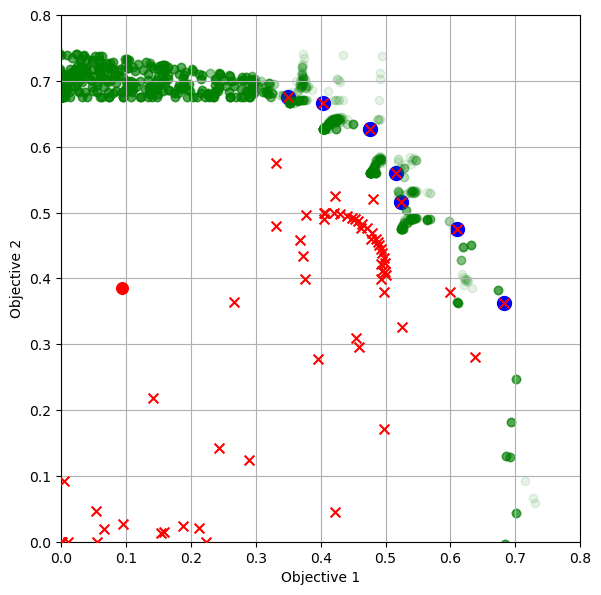

Iteration: 62
new candidats: tensor([[0.4443, 0.7152]], dtype=torch.float64)
new obj: tensor([[0.6012, 0.4459]], dtype=torch.float64)
Hypervolume (qPES): [0.15432915]
Time: 2.41298603299947


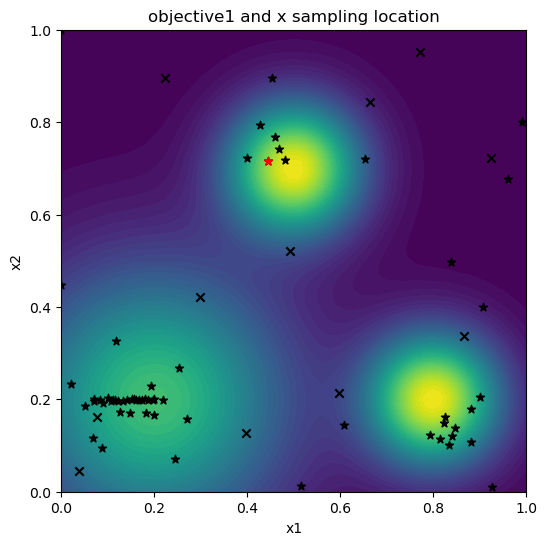

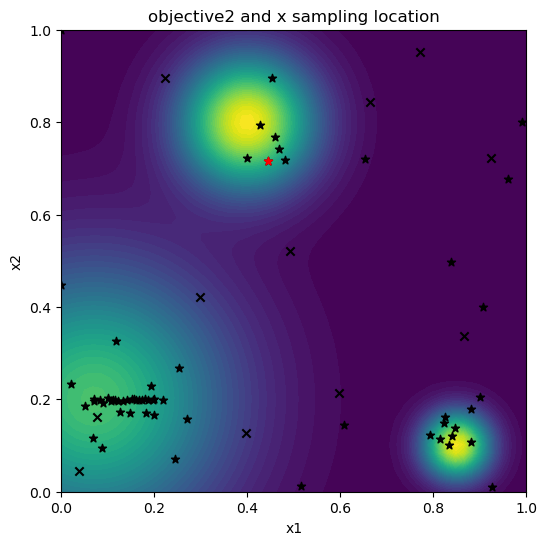

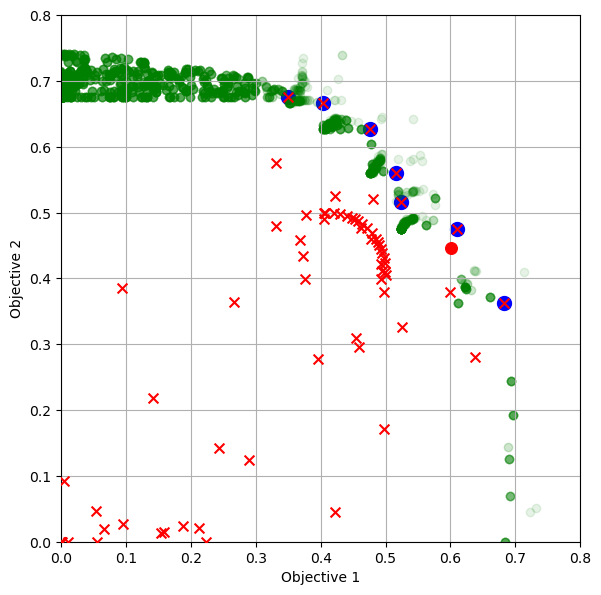

Iteration: 63
new candidats: tensor([[0.4709, 0.7288]], dtype=torch.float64)
new obj: tensor([[0.6498, 0.4246]], dtype=torch.float64)
Hypervolume (qPES): [0.15672754]
Time: 2.771516171997064


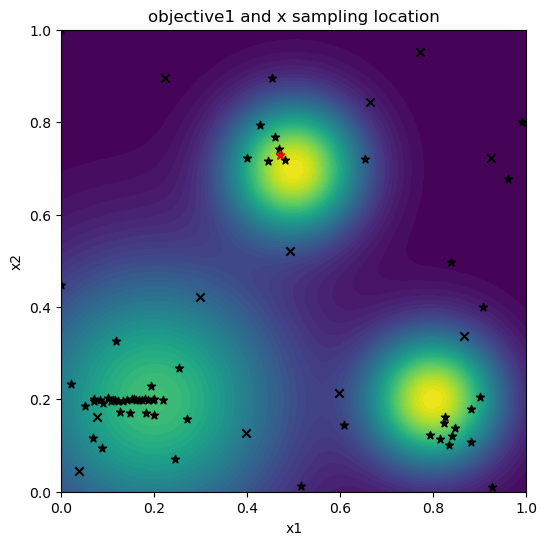

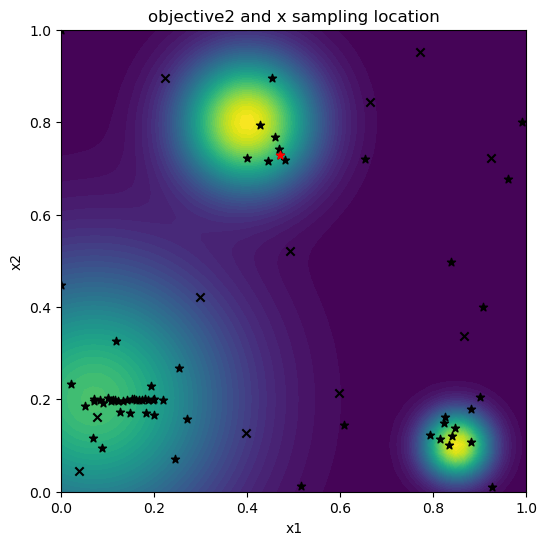

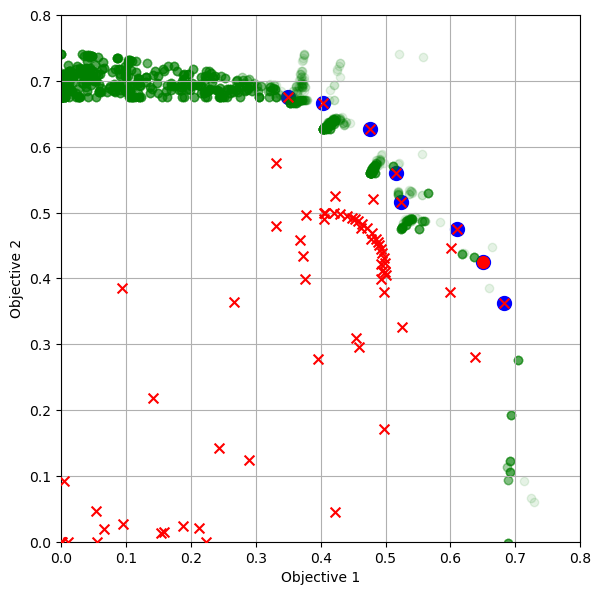

Iteration: 64
new candidats: tensor([[0.4535, 0.7467]], dtype=torch.float64)
new obj: tensor([[0.5688, 0.5281]], dtype=torch.float64)
Hypervolume (qPES): [0.15917266]
Time: 2.631260067995754


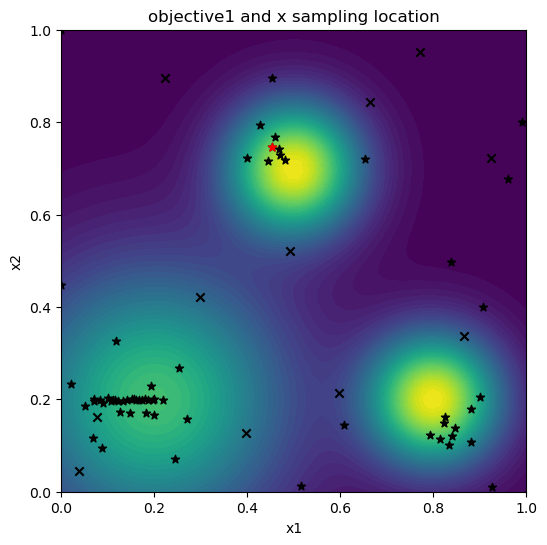

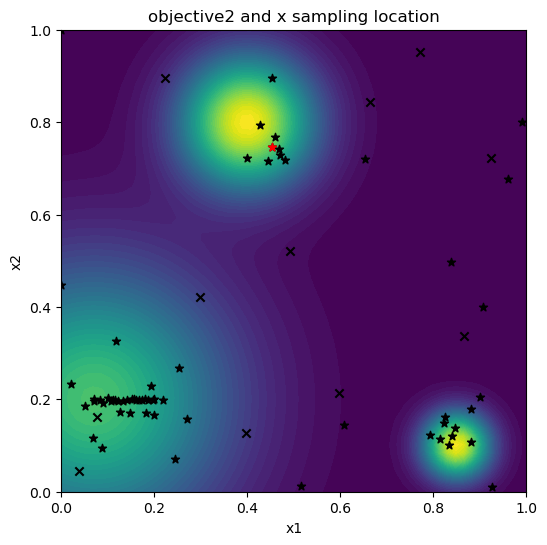

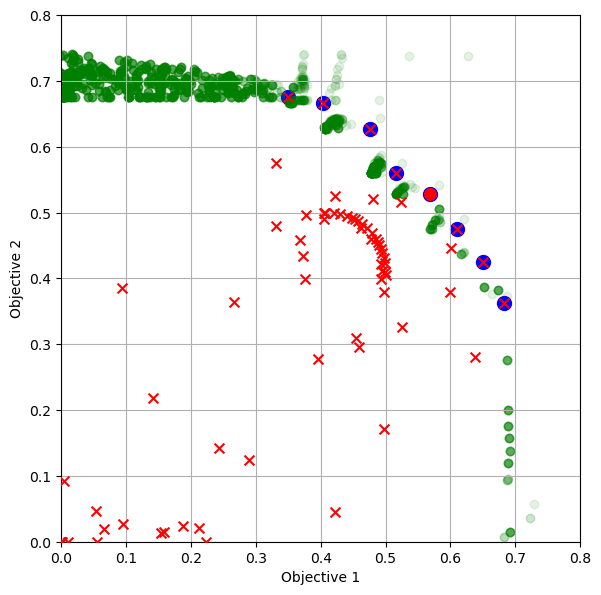

Iteration: 65
new candidats: tensor([[0.3968, 0.9075]], dtype=torch.float64)
new obj: tensor([[0.0483, 0.3927]], dtype=torch.float64)
Hypervolume (qPES): [0.15917266]
Time: 2.4166087210032856


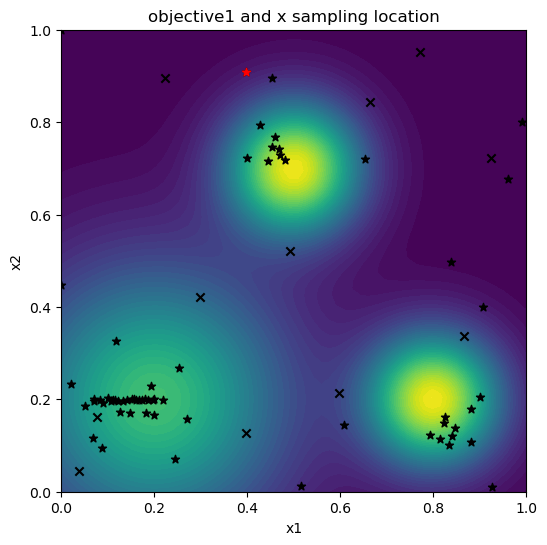

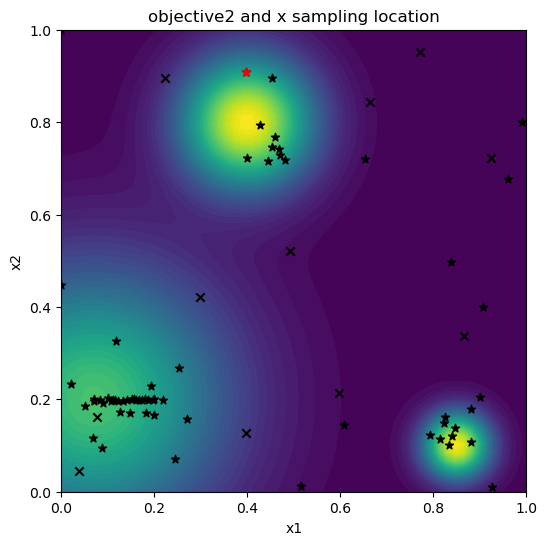

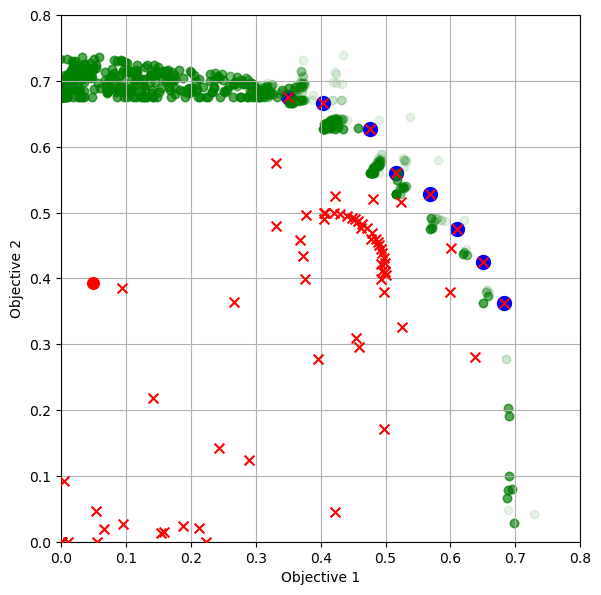

Iteration: 66
new candidats: tensor([[0.4927, 0.7098]], dtype=torch.float64)
new obj: tensor([[0.7014, 0.3054]], dtype=torch.float64)
Hypervolume (qPES): [0.16075494]
Time: 2.680038929989678


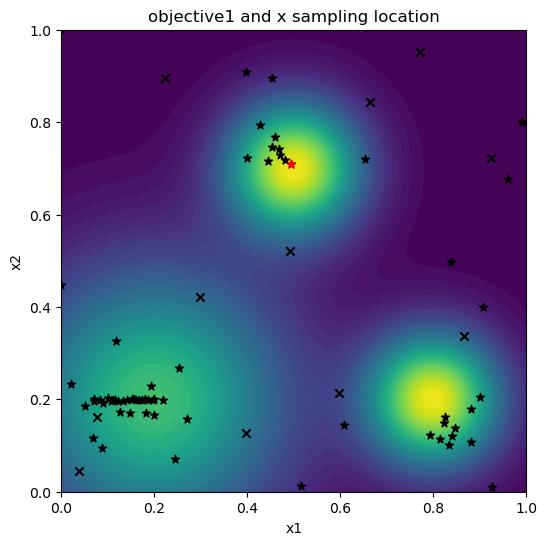

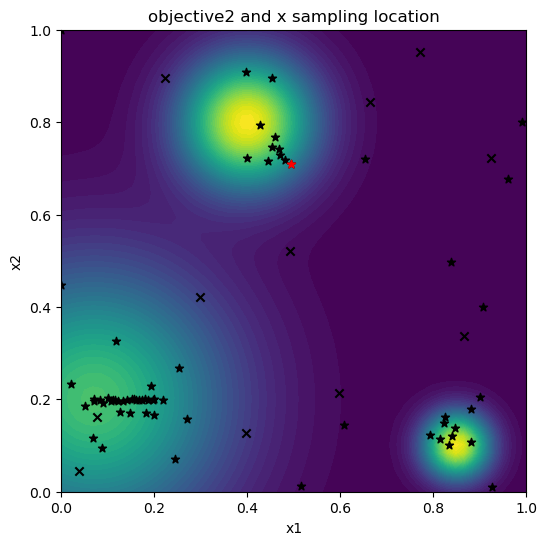

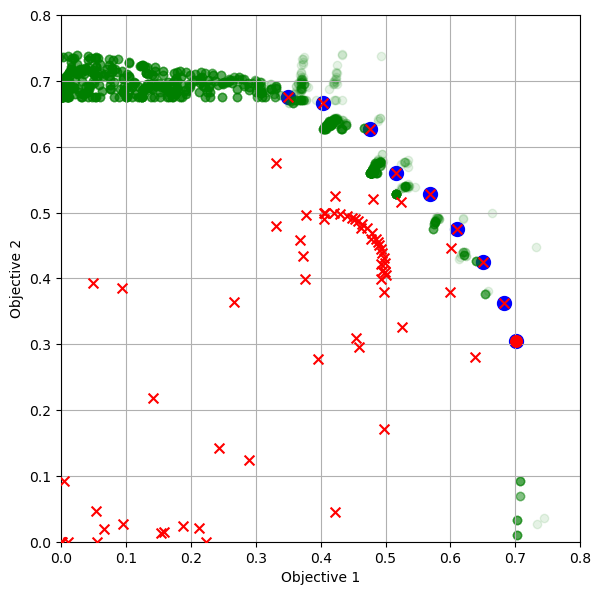

Iteration: 67
new candidats: tensor([[0.9675, 0.9843]], dtype=torch.float64)
new obj: tensor([[3.6577e-07, 2.2698e-08]], dtype=torch.float64)
Hypervolume (qPES): [0.16075494]
Time: 2.5211832810018677


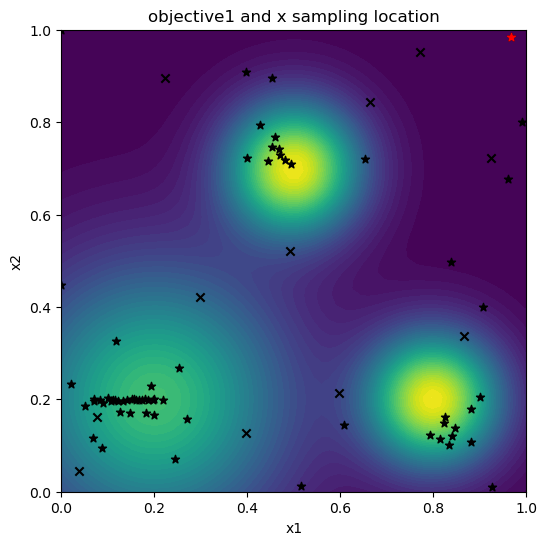

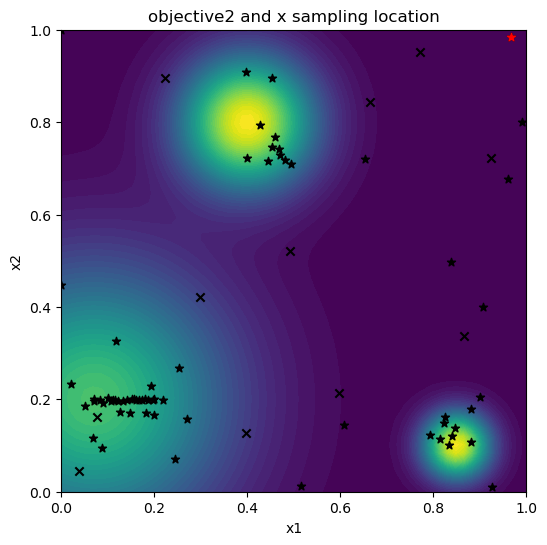

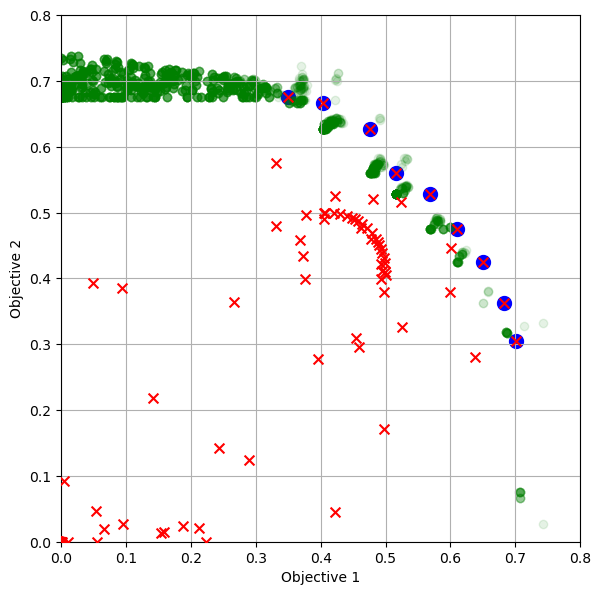

Iteration: 68
new candidats: tensor([[0.5013, 0.0777]], dtype=torch.float64)
new obj: tensor([[0.1371, 0.0405]], dtype=torch.float64)
Hypervolume (qPES): [0.16075494]
Time: 2.3488540469988948


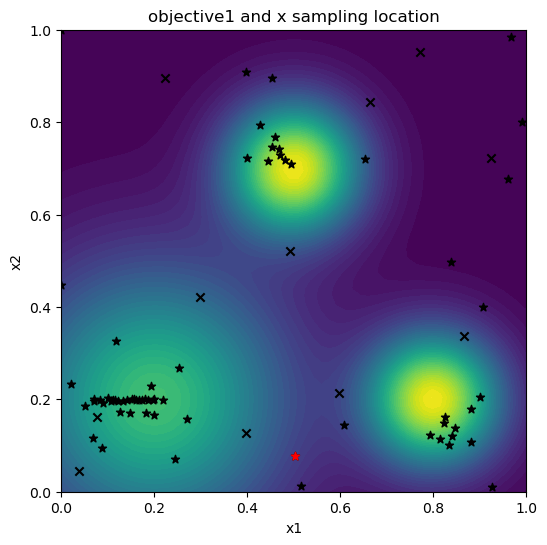

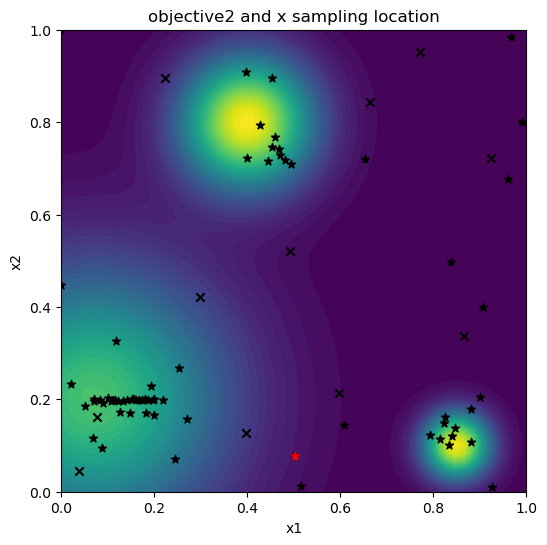

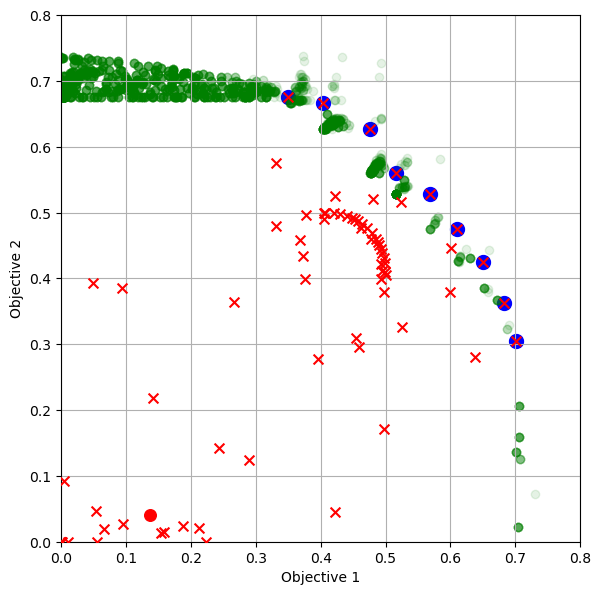

Iteration: 69
new candidats: tensor([[0.1775, 0.6661]], dtype=torch.float64)
new obj: tensor([[0.0365, 0.0527]], dtype=torch.float64)
Hypervolume (qPES): [0.16075494]
Time: 2.4739000190020306


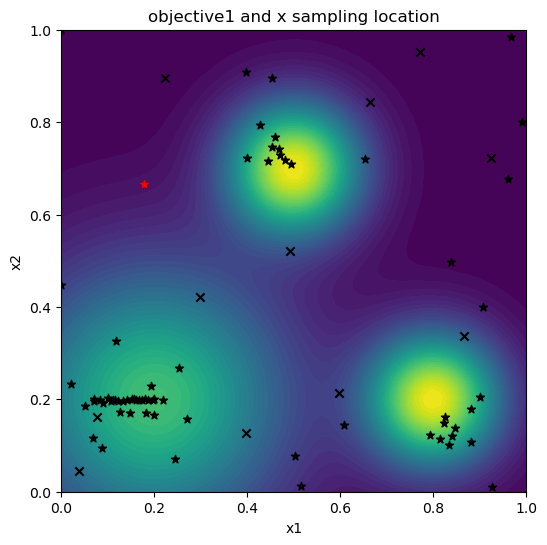

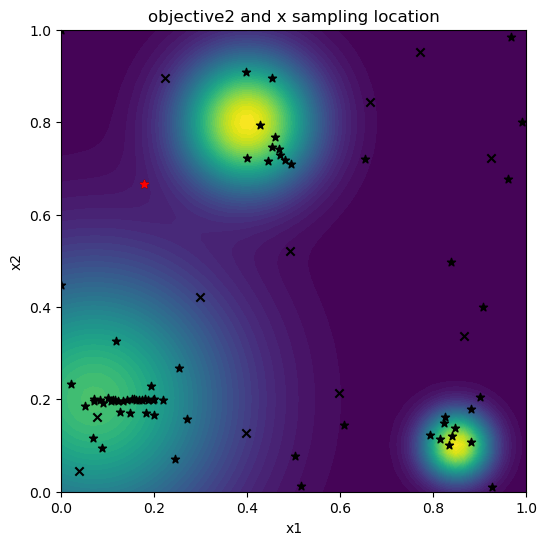

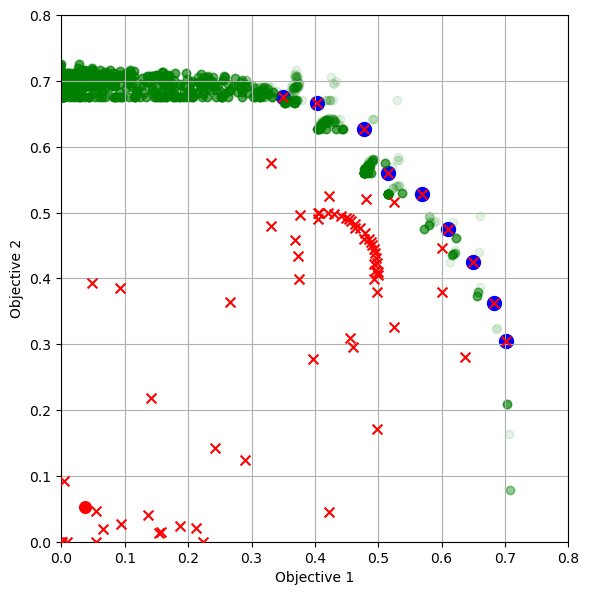

Iteration: 70
new candidats: tensor([[0.4422, 0.7571]], dtype=torch.float64)
new obj: tensor([[0.5082, 0.5859]], dtype=torch.float64)
Hypervolume (qPES): [0.16157967]
Time: 2.56118816799426


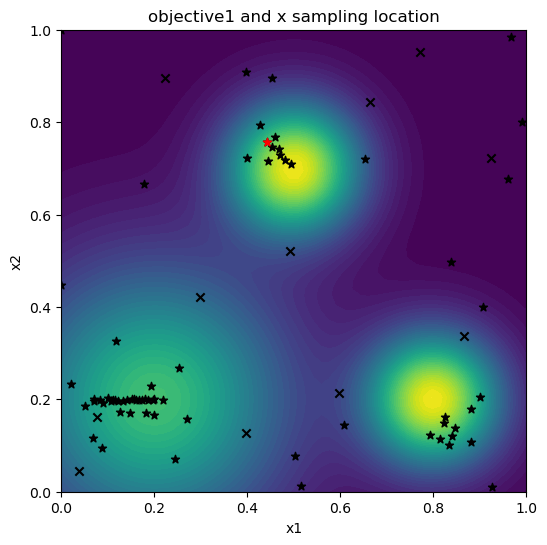

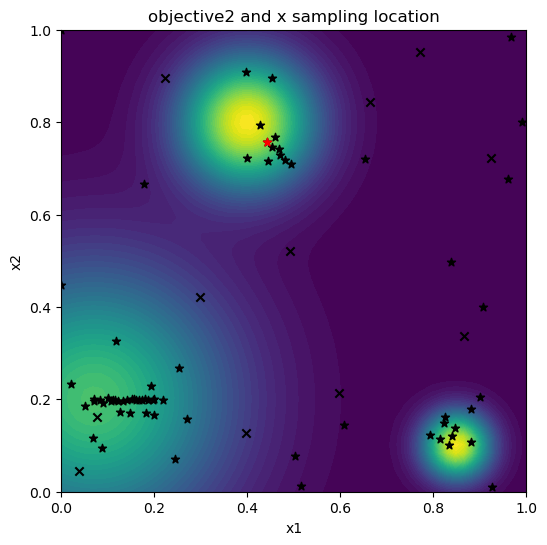

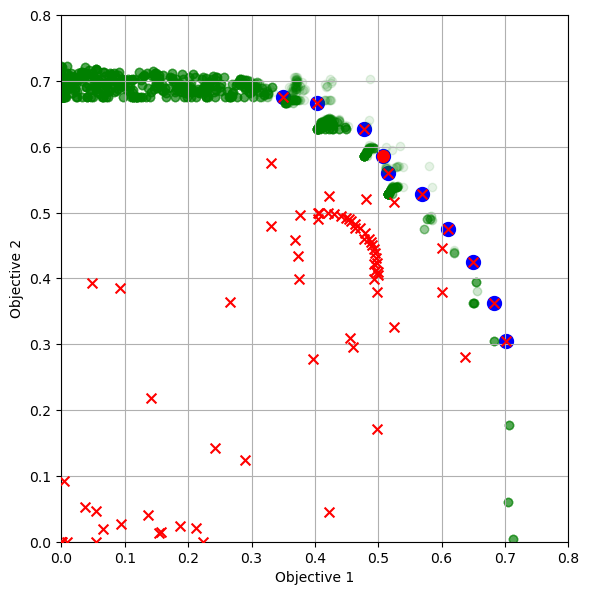

Iteration: 71
new candidats: tensor([[0.2848, 0.8680]], dtype=torch.float64)
new obj: tensor([[0.0186, 0.2870]], dtype=torch.float64)
Hypervolume (qPES): [0.16157967]
Time: 2.483417292998638


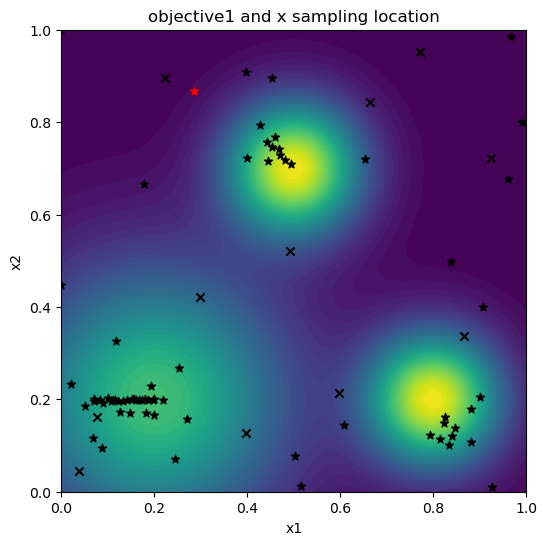

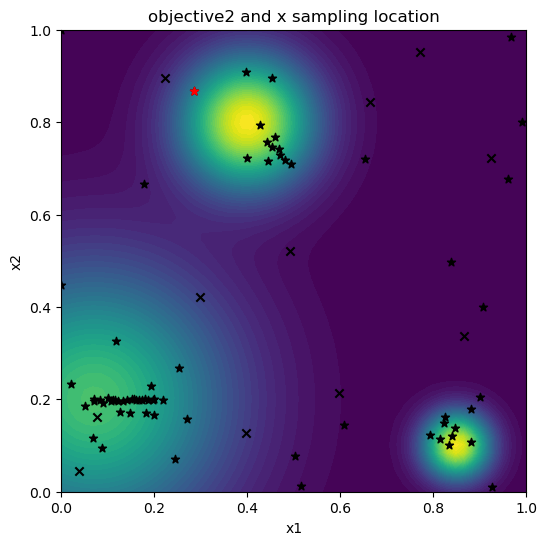

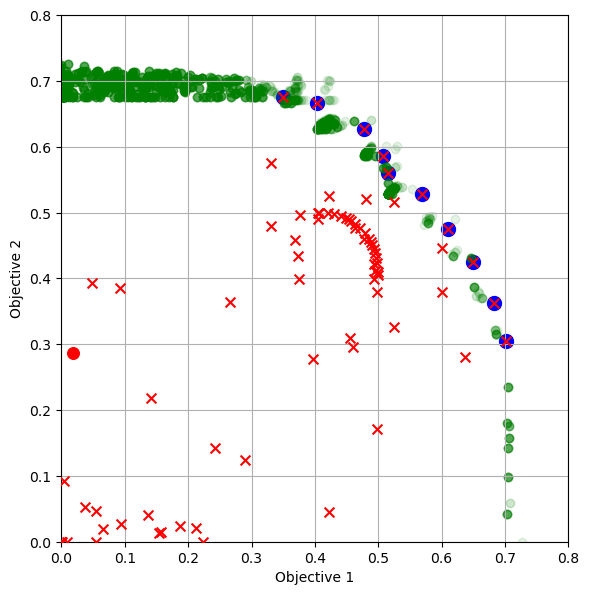

Iteration: 72
new candidats: tensor([[0.4573, 0.7414]], dtype=torch.float64)
new obj: tensor([[0.5920, 0.5024]], dtype=torch.float64)
Hypervolume (qPES): [0.1622062]
Time: 2.596985596988816


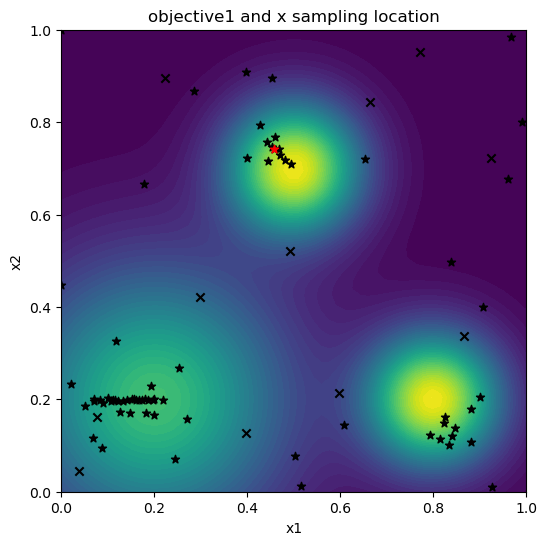

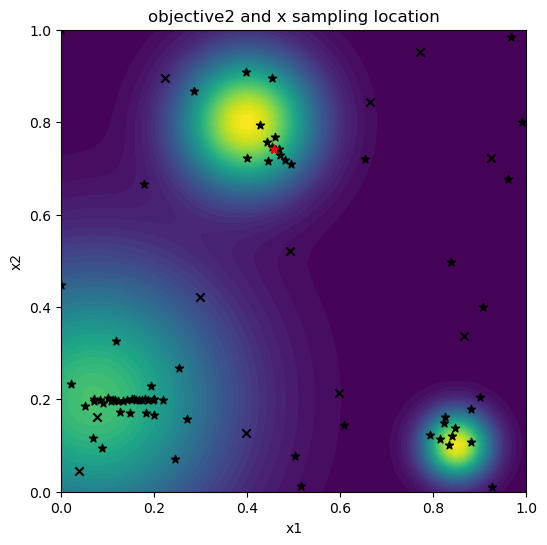

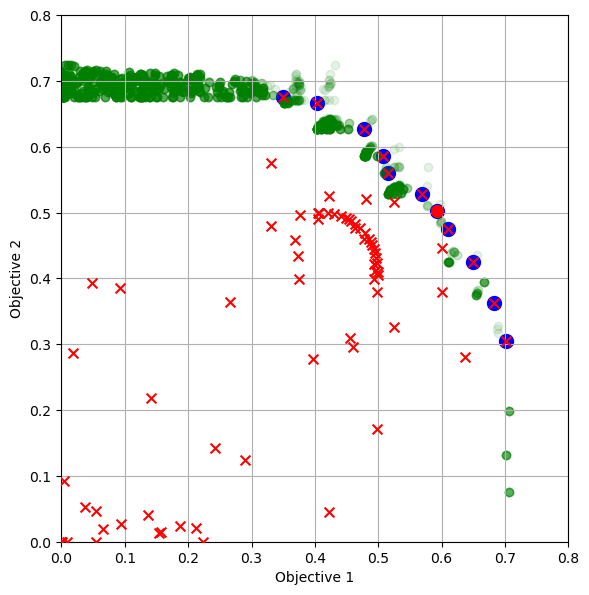

Iteration: 73
new candidats: tensor([[0.3818, 0.4316]], dtype=torch.float64)
new obj: tensor([[0.1787, 0.0766]], dtype=torch.float64)
Hypervolume (qPES): [0.1622062]
Time: 2.3923603590083076


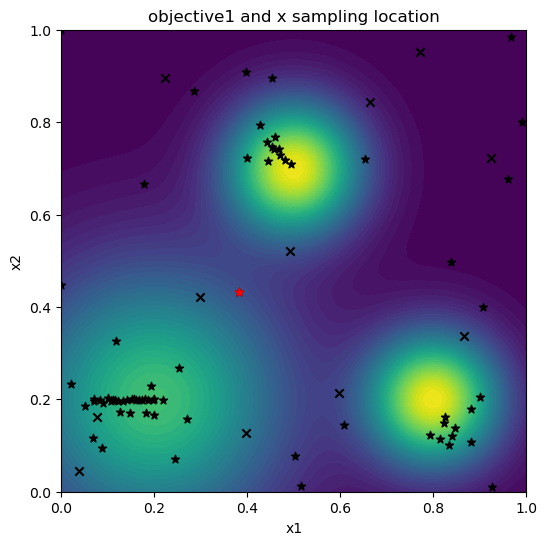

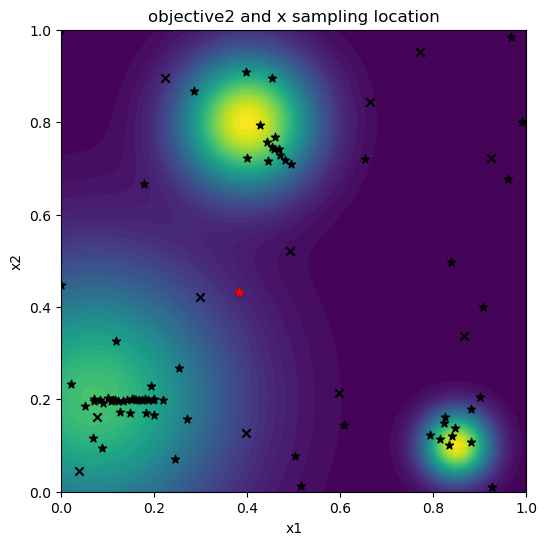

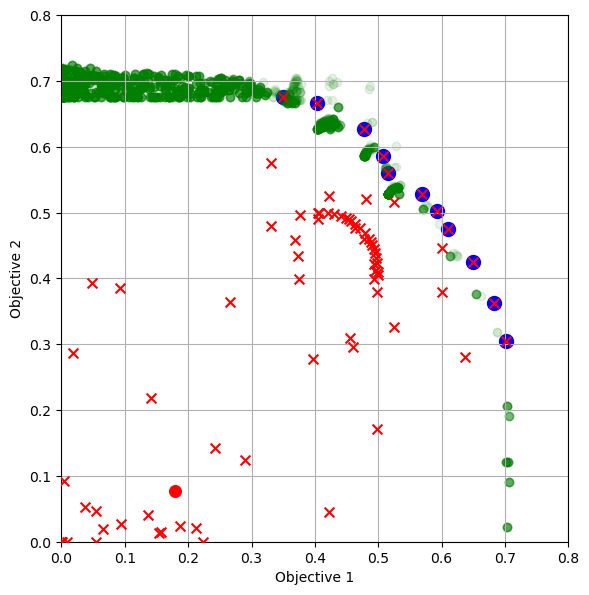

Iteration: 74
new candidats: tensor([[0.8477, 0.1017]], dtype=torch.float64)
new obj: tensor([[0.3876, 0.6991]], dtype=torch.float64)
Hypervolume (qPES): [0.16614784]
Time: 2.538795428001322


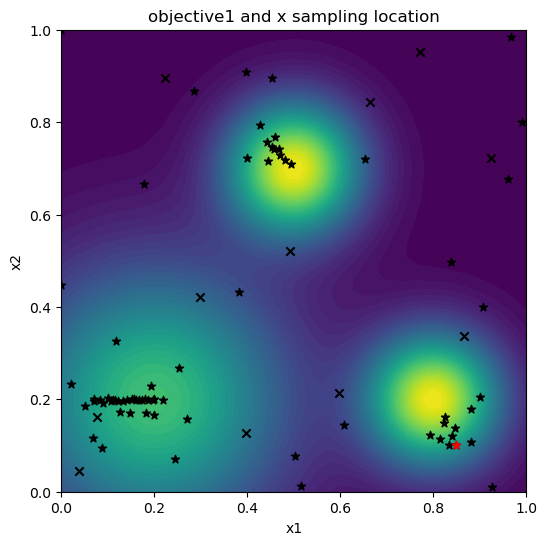

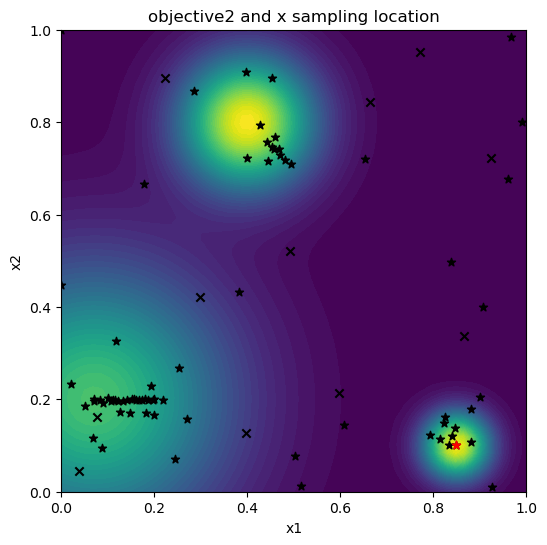

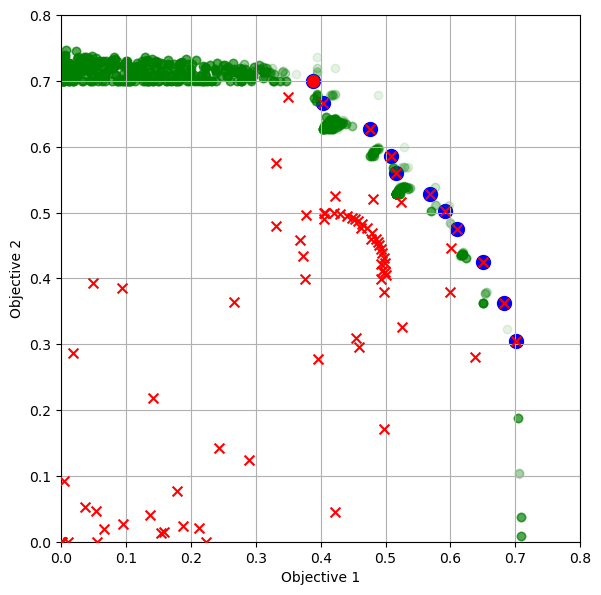

Iteration: 75
new candidats: tensor([[0.4656, 0.7329]], dtype=torch.float64)
new obj: tensor([[0.6309, 0.4528]], dtype=torch.float64)
Hypervolume (qPES): [0.16671606]
Time: 2.739526709992788


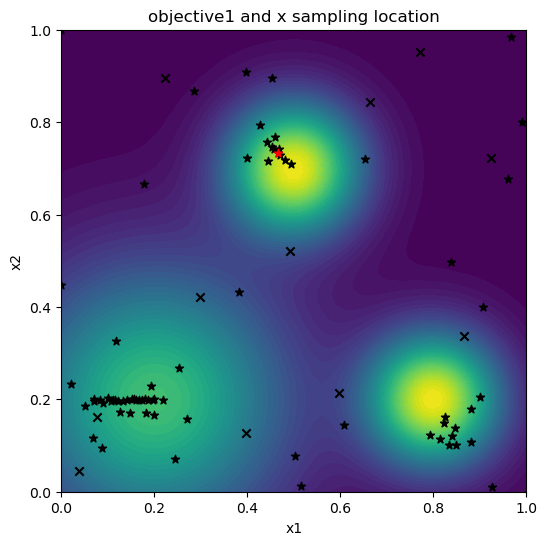

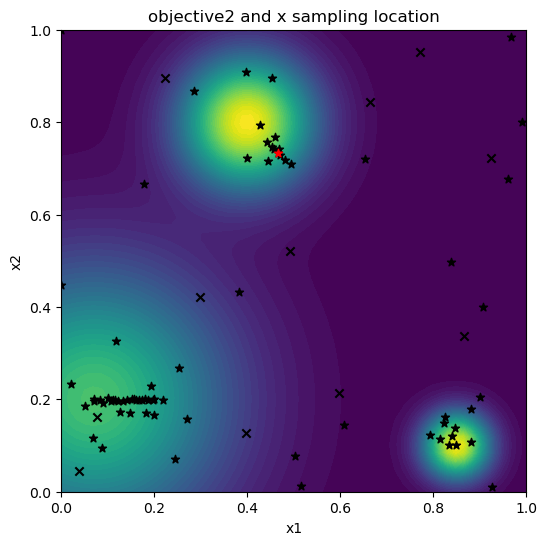

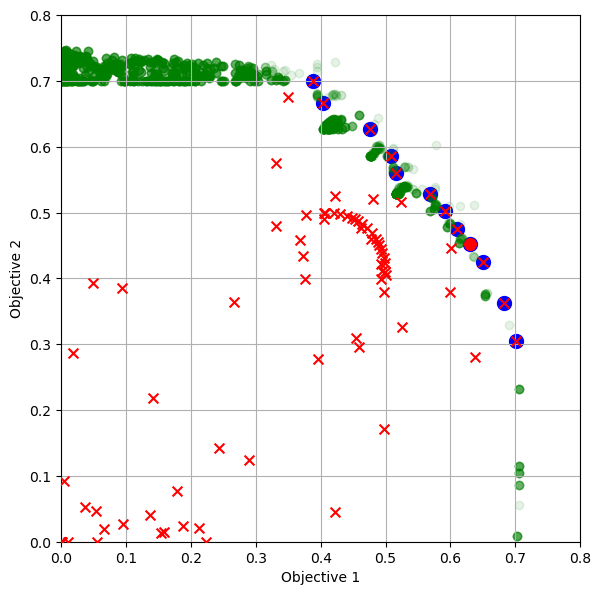

Iteration: 76
new candidats: tensor([[0.4074, 0.7510]], dtype=torch.float64)
new obj: tensor([[0.4070, 0.6218]], dtype=torch.float64)
Hypervolume (qPES): [0.16671606]
Time: 2.550087869996787


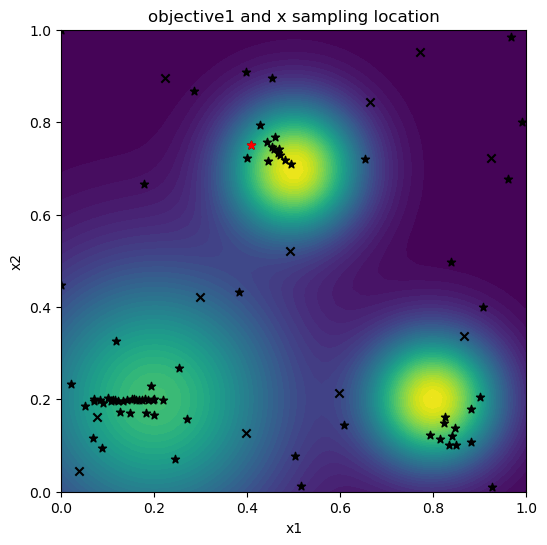

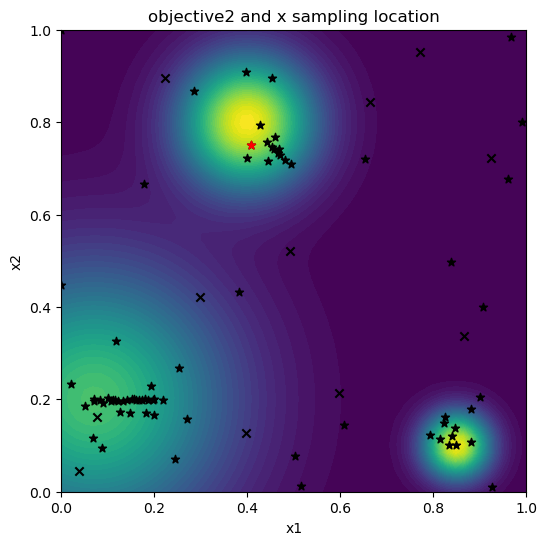

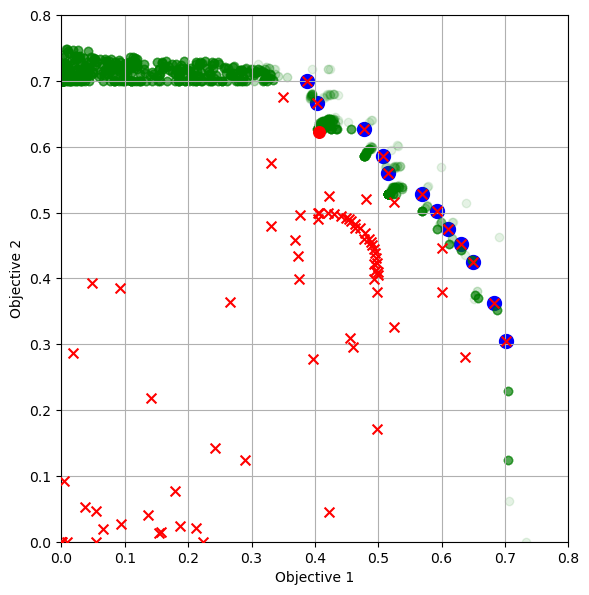

Iteration: 77
new candidats: tensor([[0.9979, 0.5825]], dtype=torch.float64)
new obj: tensor([[9.5433e-05, 1.7042e-06]], dtype=torch.float64)
Hypervolume (qPES): [0.16671606]
Time: 2.439272850009729


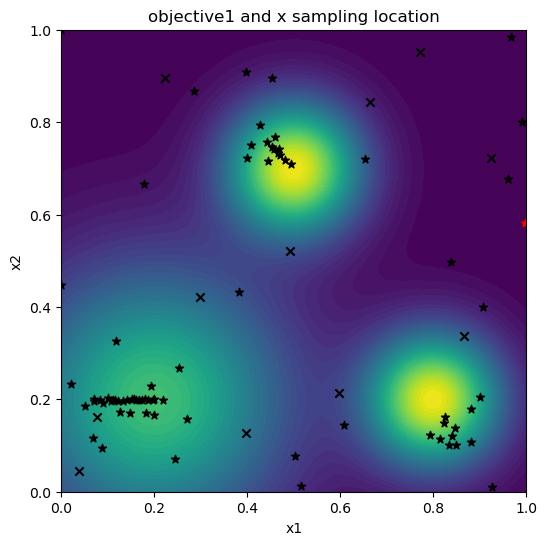

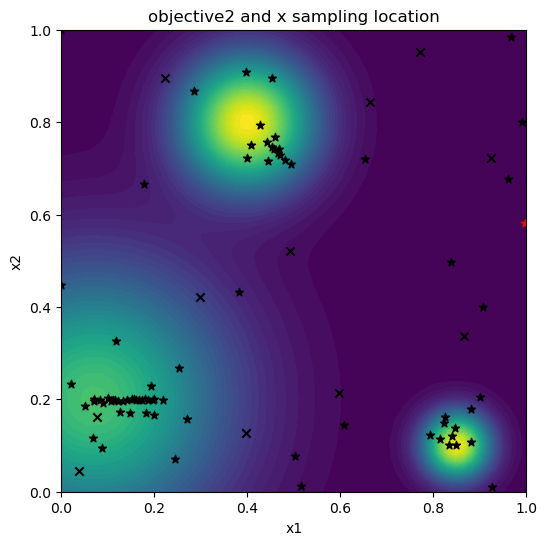

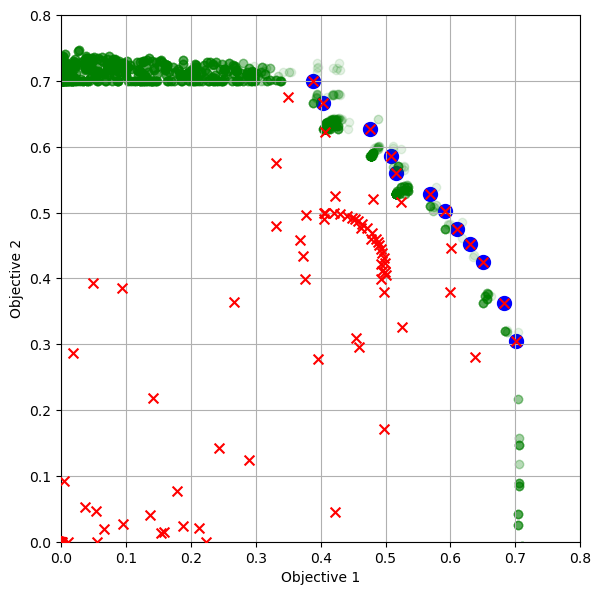

Iteration: 78
new candidats: tensor([[0.4393, 0.7594]], dtype=torch.float64)
new obj: tensor([[0.4927, 0.5987]], dtype=torch.float64)
Hypervolume (qPES): [0.16692068]
Time: 2.6425591699953657


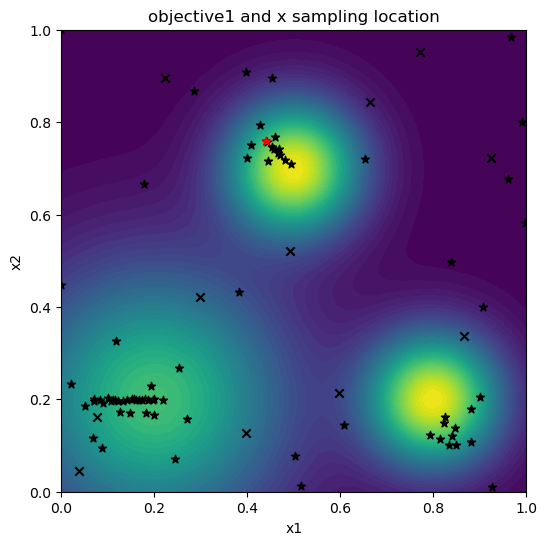

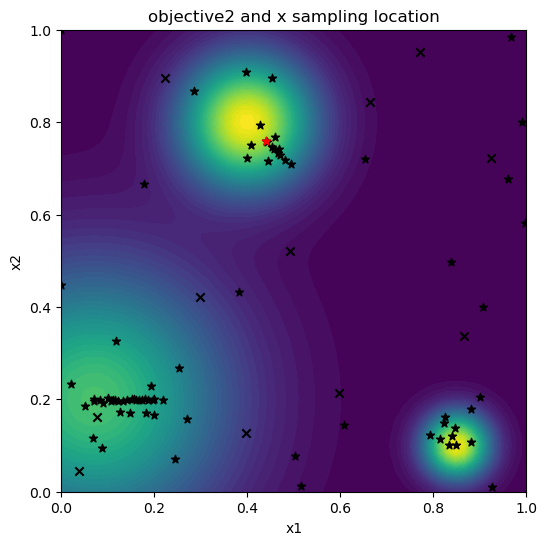

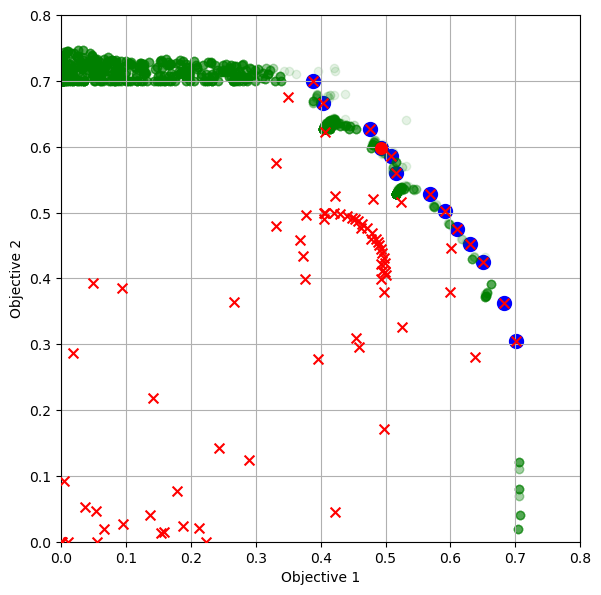

Iteration: 79
new candidats: tensor([[0.9559, 0.0900]], dtype=torch.float64)
new obj: tensor([[0.1137, 0.0728]], dtype=torch.float64)
Hypervolume (qPES): [0.16692068]
Time: 2.5166987599950517


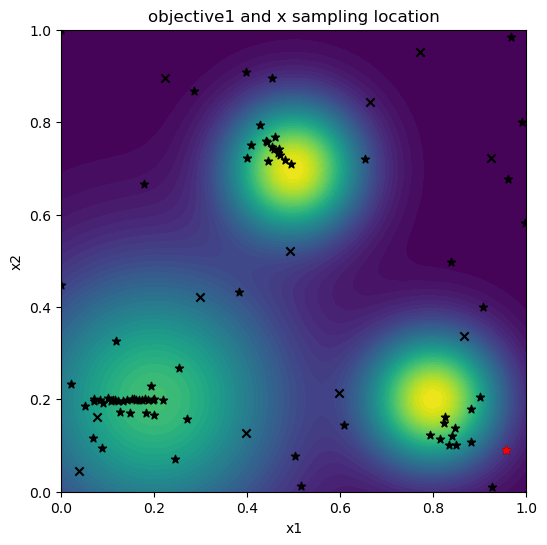

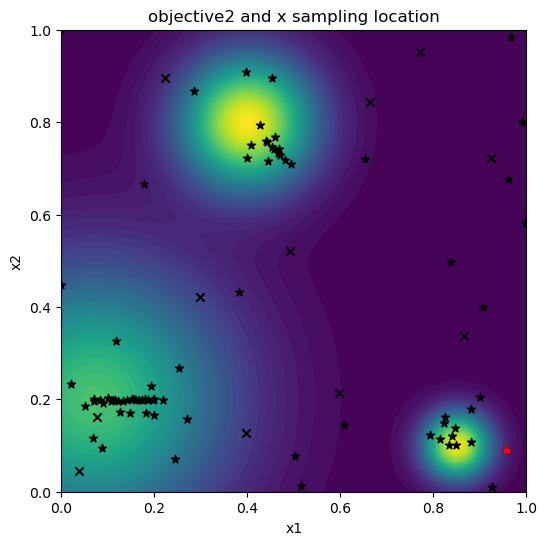

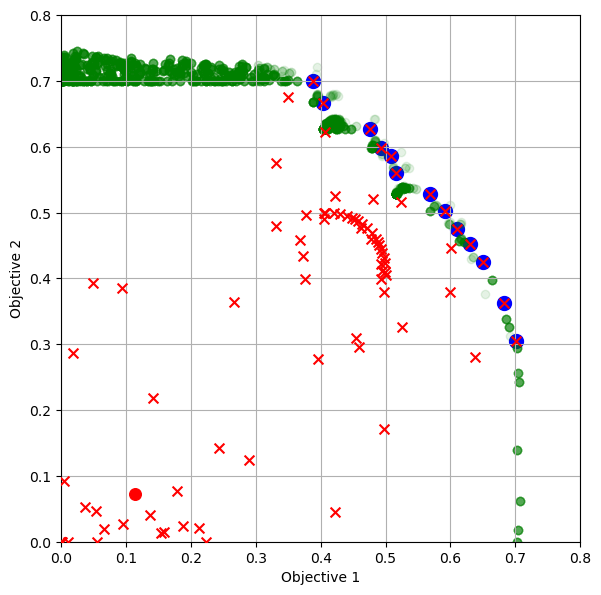

Iteration: 80
new candidats: tensor([[0.3468, 0.8989]], dtype=torch.float64)
new obj: tensor([[0.0308, 0.3731]], dtype=torch.float64)
Hypervolume (qPES): [0.16692068]
Time: 2.3710363769932883


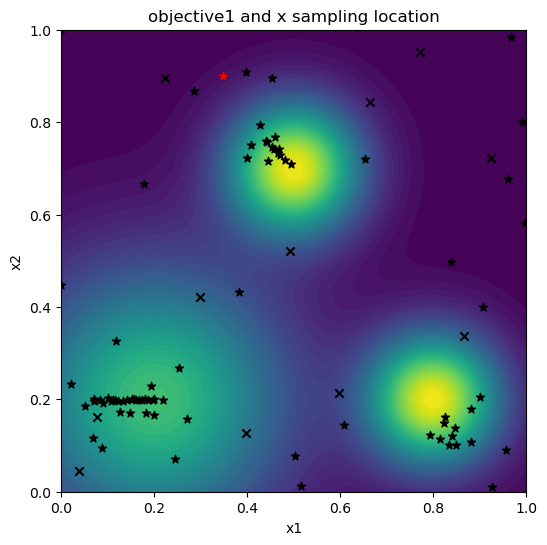

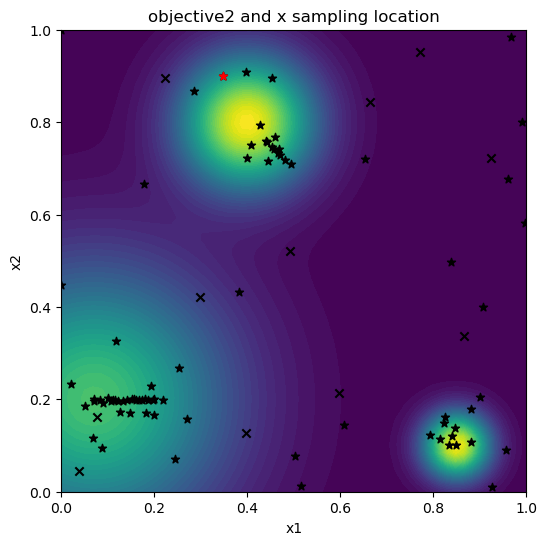

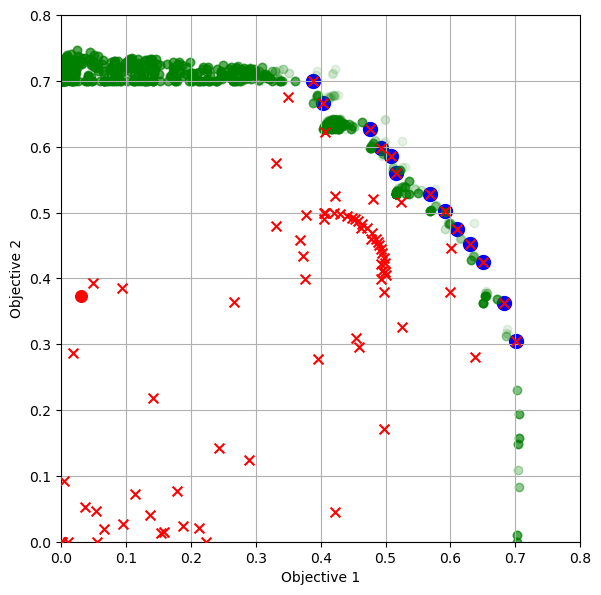

Iteration: 81
new candidats: tensor([[0.4469, 0.7491]], dtype=torch.float64)
new obj: tensor([[0.5443, 0.5528]], dtype=torch.float64)
Hypervolume (qPES): [0.16762427]
Time: 2.6525964710017433


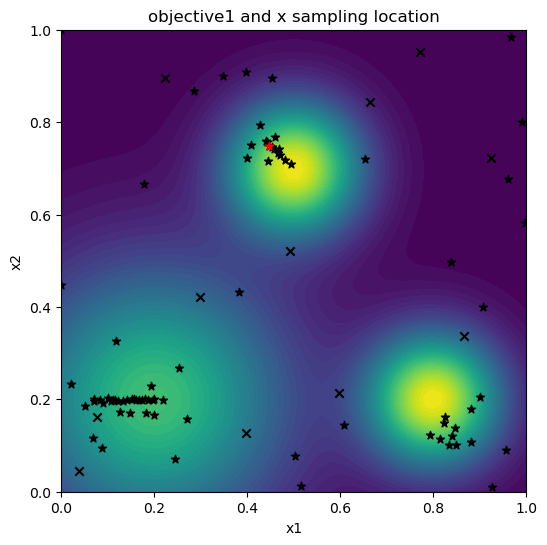

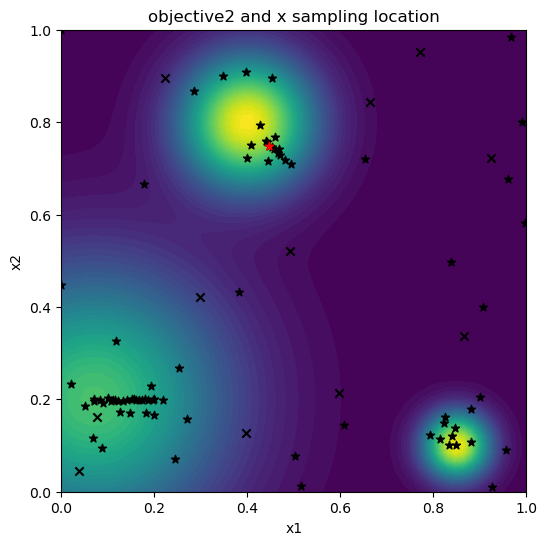

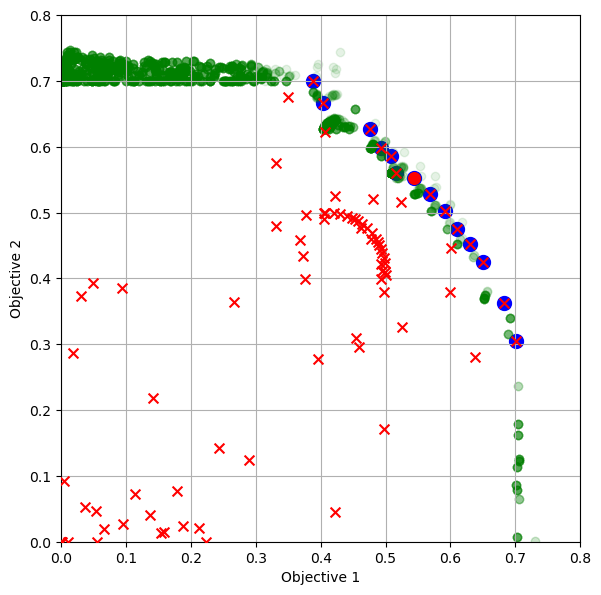

Iteration: 82
new candidats: tensor([[0.8437, 0.0825]], dtype=torch.float64)
new obj: tensor([[0.3215, 0.6536]], dtype=torch.float64)
Hypervolume (qPES): [0.16762427]
Time: 2.5846797340054763


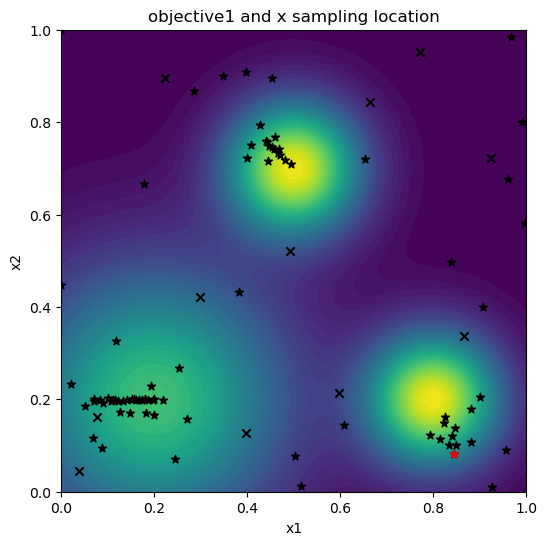

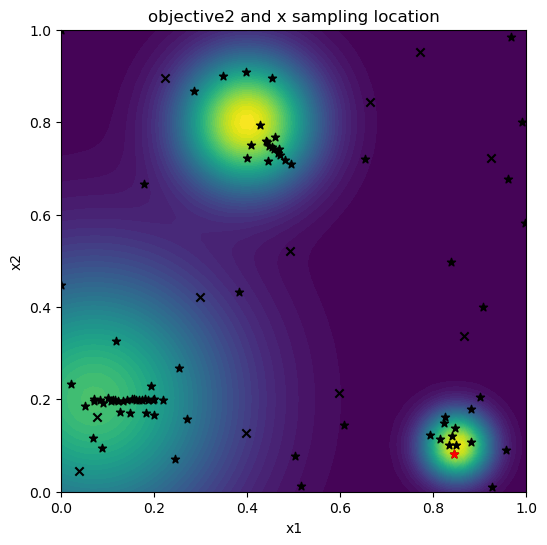

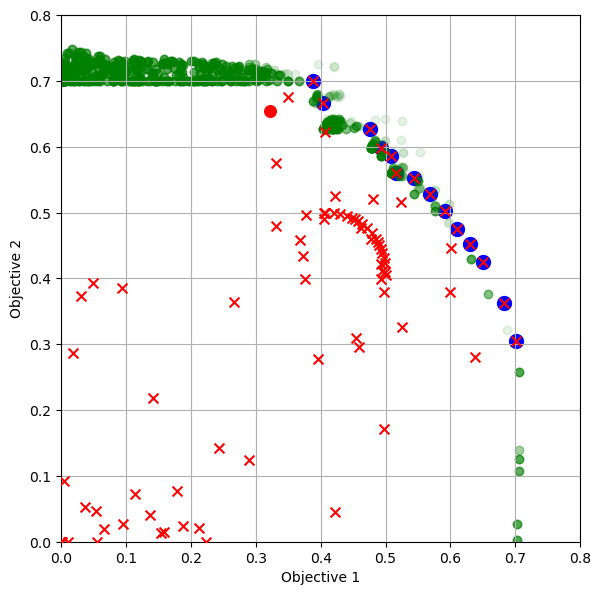

Iteration: 83
new candidats: tensor([[0.4958, 0.7019]], dtype=torch.float64)
new obj: tensor([[0.7064, 0.2757]], dtype=torch.float64)
Hypervolume (qPES): [0.16789713]
Time: 2.5094974229868967


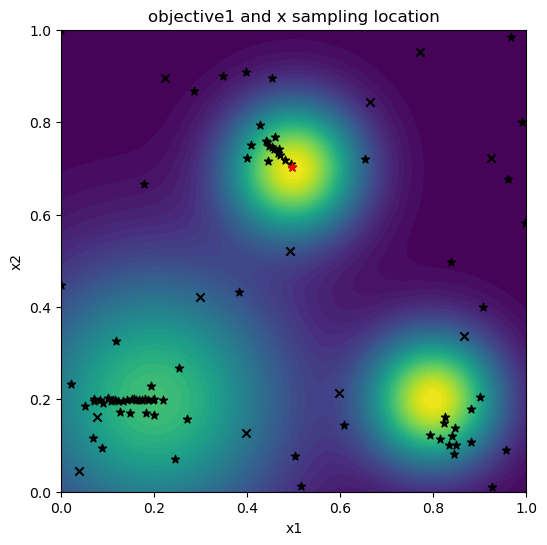

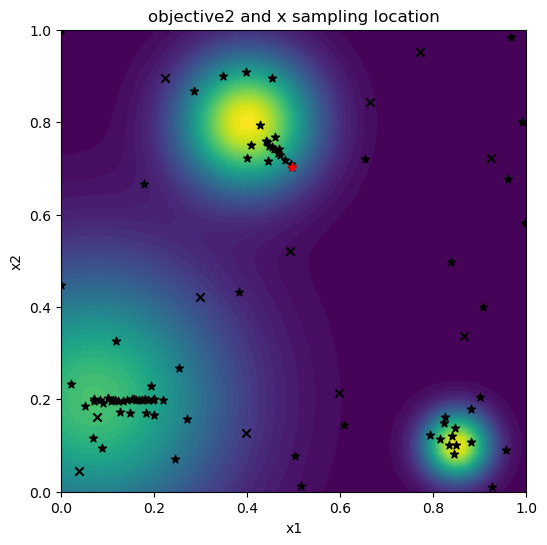

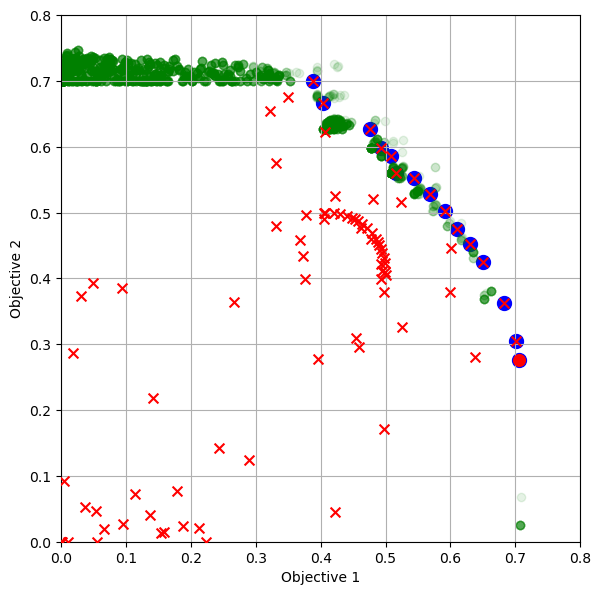

Iteration: 84
new candidats: tensor([[0.3248, 0.7551]], dtype=torch.float64)
new obj: tensor([[0.1384, 0.4817]], dtype=torch.float64)
Hypervolume (qPES): [0.16789713]
Time: 2.5962576939928113


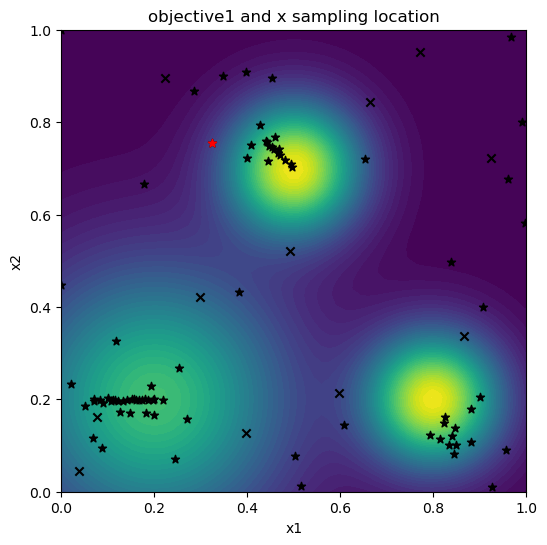

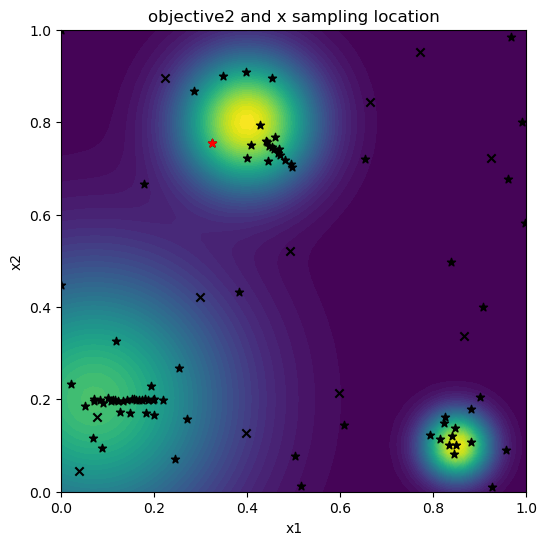

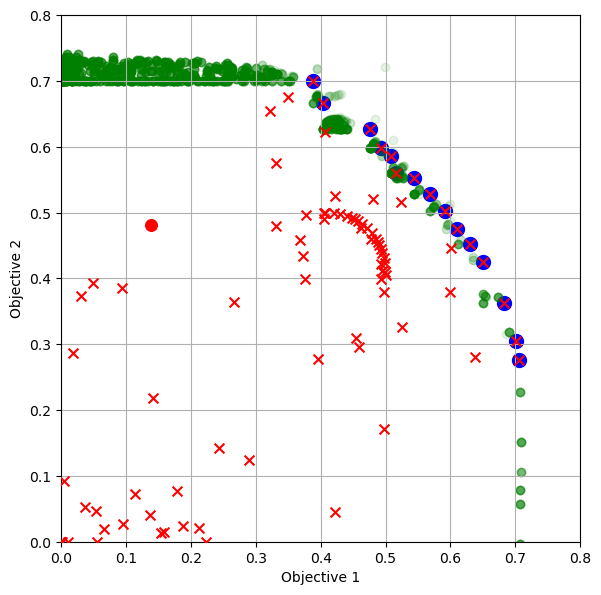

Iteration: 85
new candidats: tensor([[0.4450, 0.7535]], dtype=torch.float64)
new obj: tensor([[0.5267, 0.5696]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.661012470998685


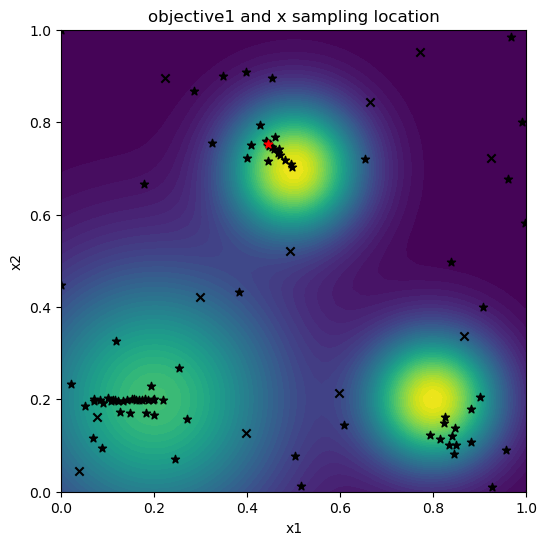

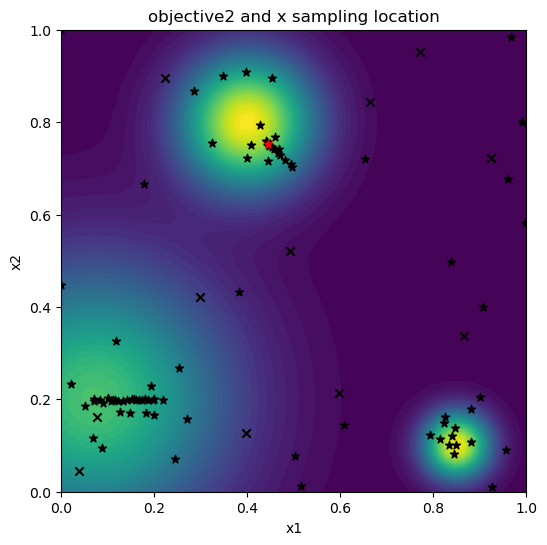

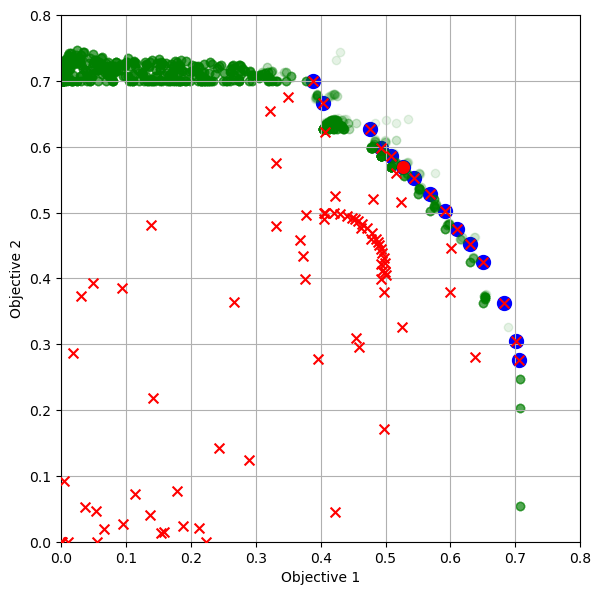

Iteration: 86
new candidats: tensor([[0.1115, 0.7706]], dtype=torch.float64)
new obj: tensor([[0.0080, 0.0188]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.438917509993189


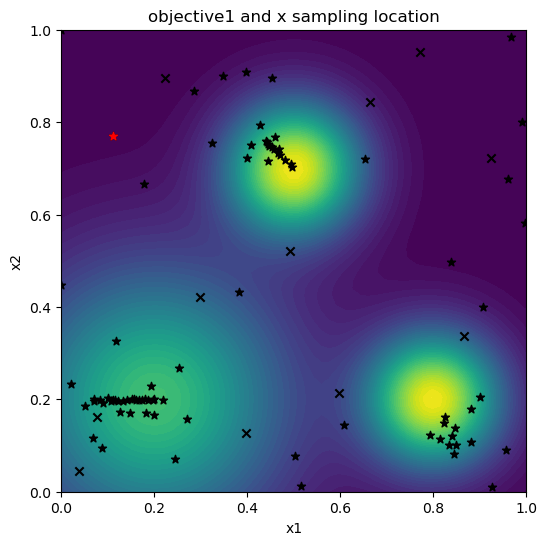

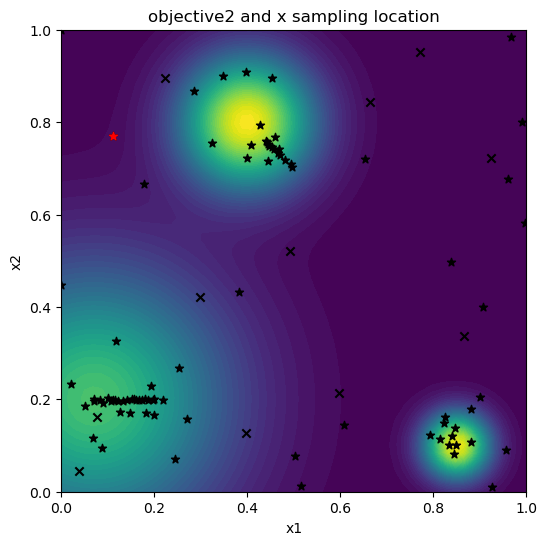

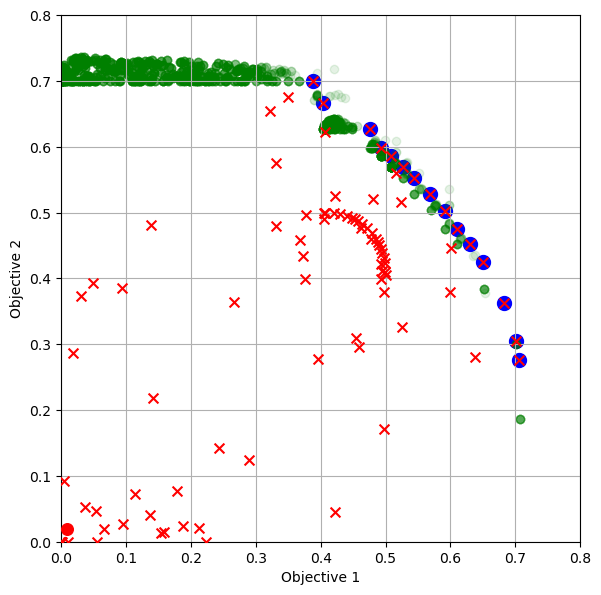

Iteration: 87
new candidats: tensor([[0.8577, 0.4118]], dtype=torch.float64)
new obj: tensor([[0.0642, 0.0001]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.5455680579907494


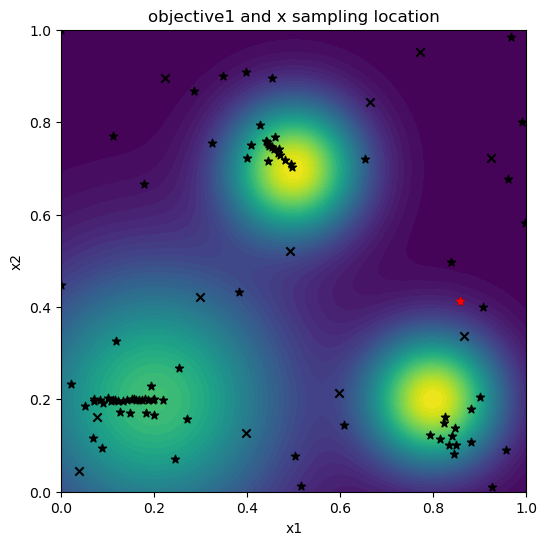

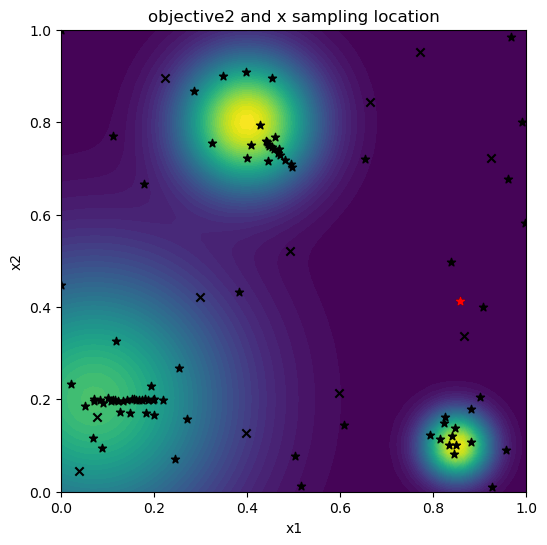

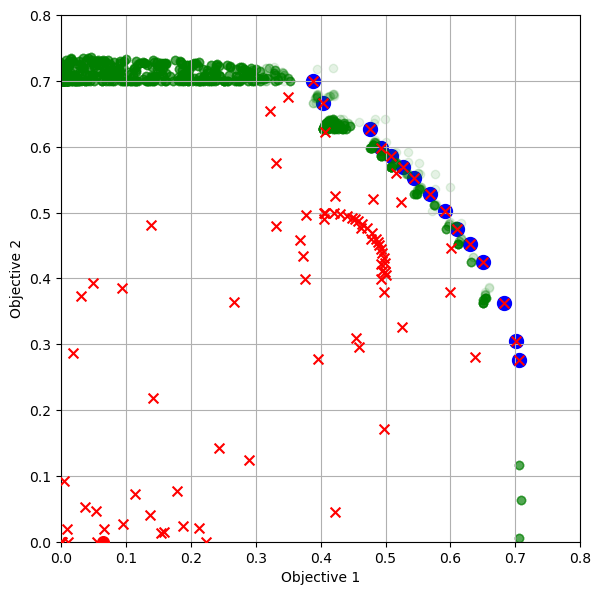

Iteration: 88
new candidats: tensor([[0.9452, 0.0908]], dtype=torch.float64)
new obj: tensor([[0.1348, 0.1124]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.61903606299893


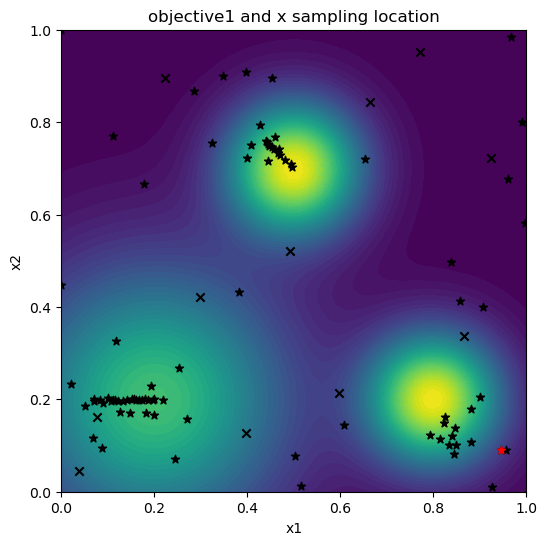

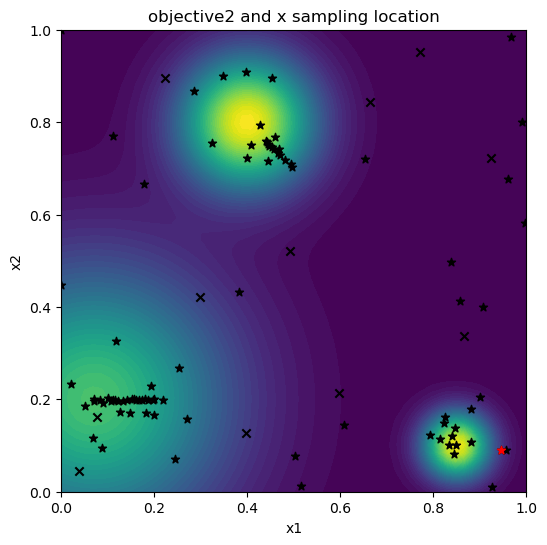

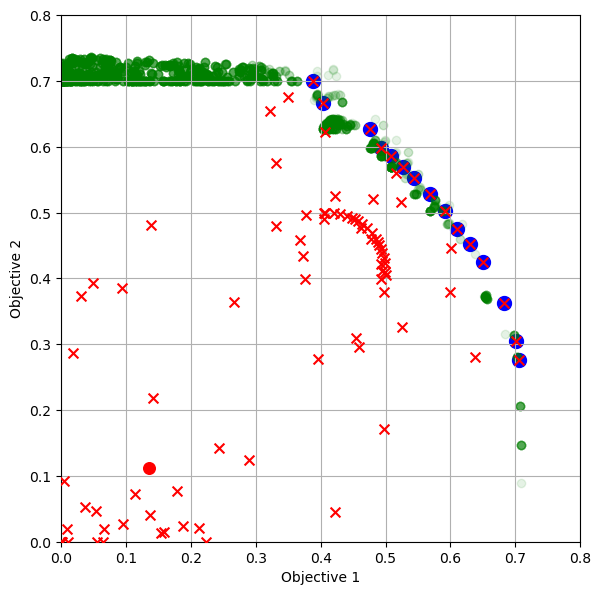

Iteration: 89
new candidats: tensor([[0.3593, 0.6945]], dtype=torch.float64)
new obj: tensor([[0.2770, 0.3777]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.475572707990068


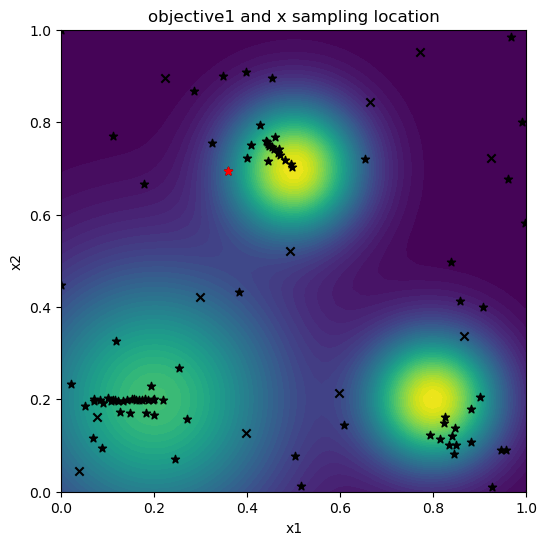

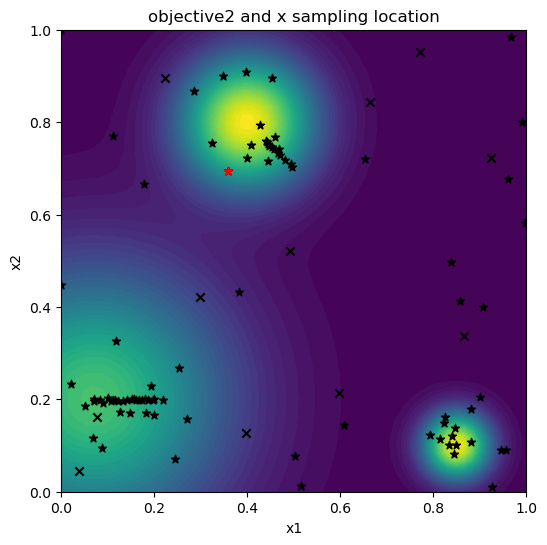

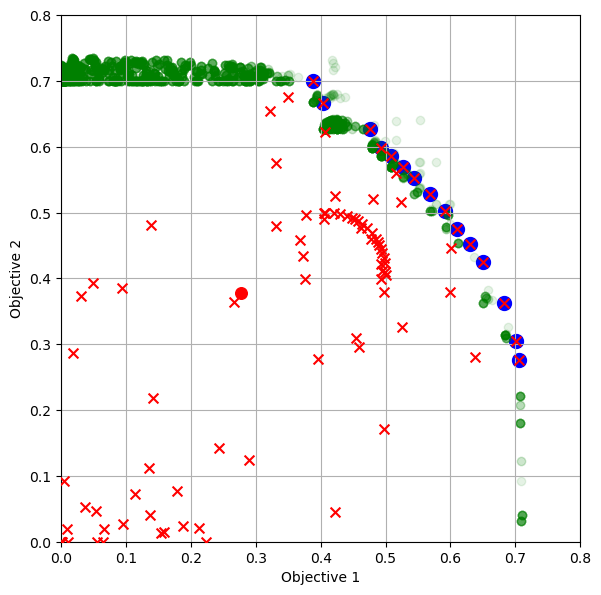

Iteration: 90
new candidats: tensor([[0.5412, 0.3369]], dtype=torch.float64)
new obj: tensor([[0.1028, 0.0247]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.6013918240059866


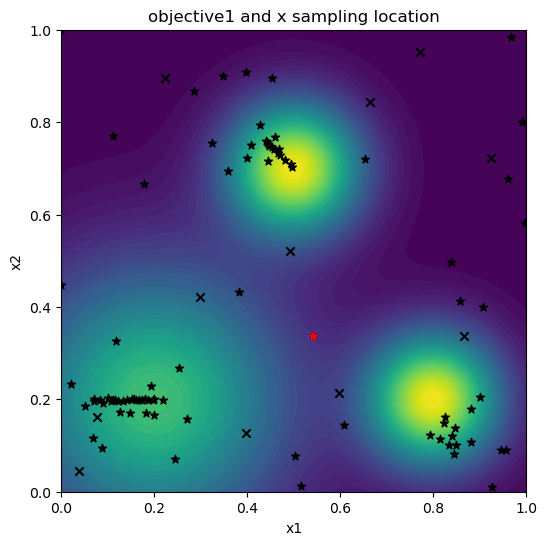

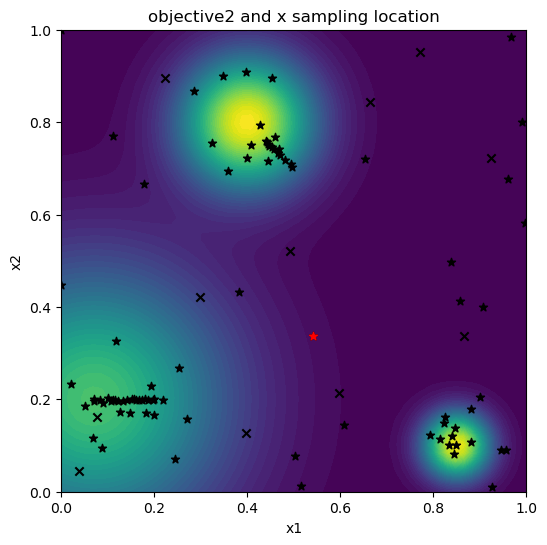

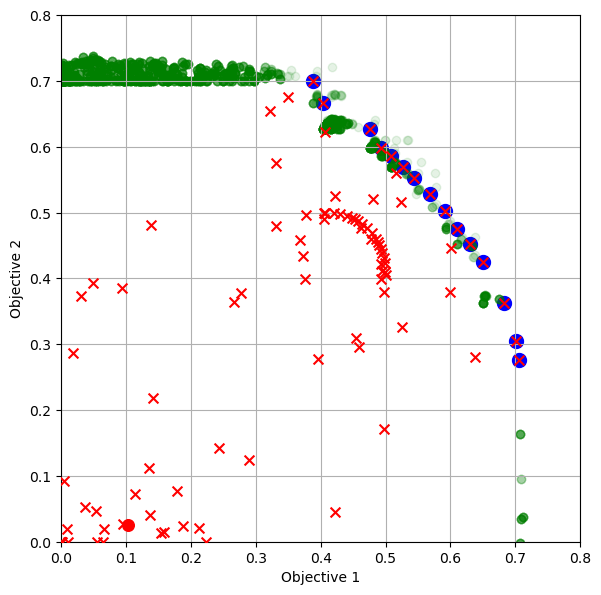

Iteration: 91
new candidats: tensor([[0.2067, 0.4378]], dtype=torch.float64)
new obj: tensor([[0.2468, 0.1954]], dtype=torch.float64)
Hypervolume (qPES): [0.16815499]
Time: 2.7121879710030043


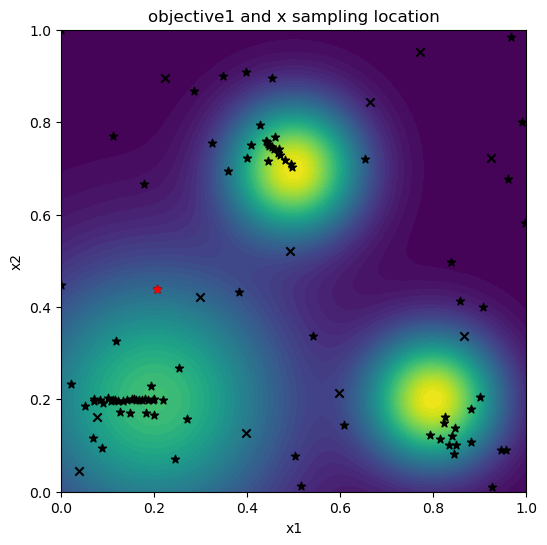

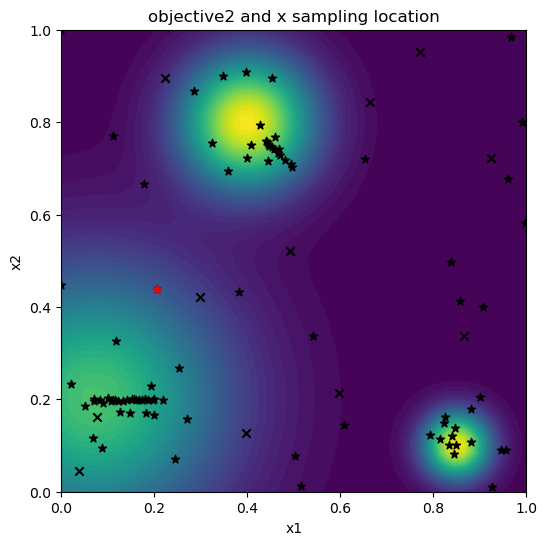

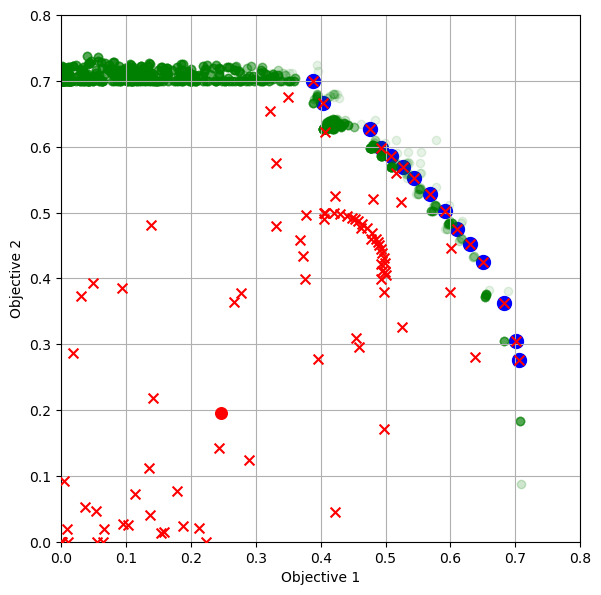

Iteration: 92
new candidats: tensor([[0.4752, 0.7232]], dtype=torch.float64)
new obj: tensor([[0.6670, 0.3951]], dtype=torch.float64)
Hypervolume (qPES): [0.16870769]
Time: 2.545032321009785


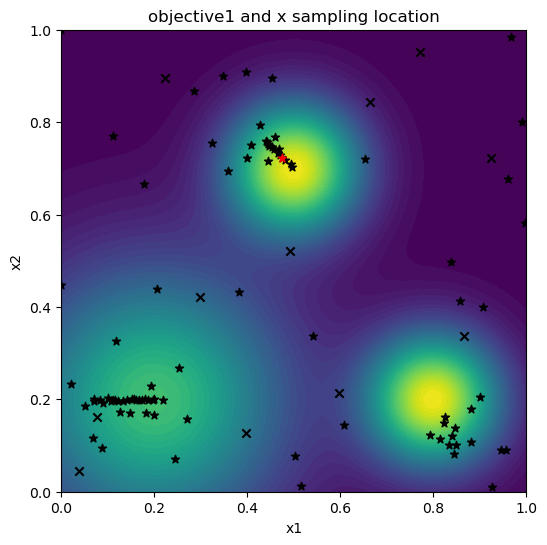

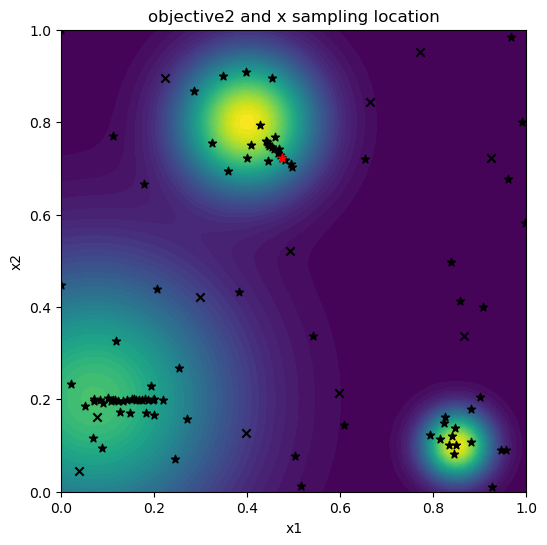

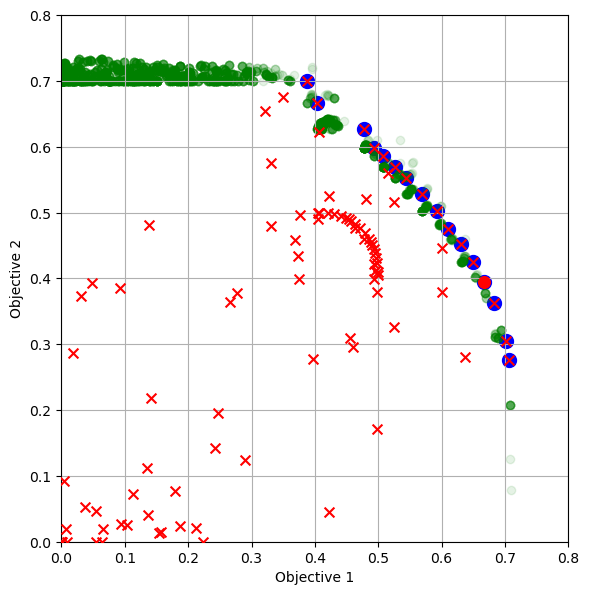

Iteration: 93
new candidats: tensor([[0.6709, 0.6522]], dtype=torch.float64)
new obj: tensor([[0.1474, 0.0064]], dtype=torch.float64)
Hypervolume (qPES): [0.16870769]
Time: 2.6638790860015433


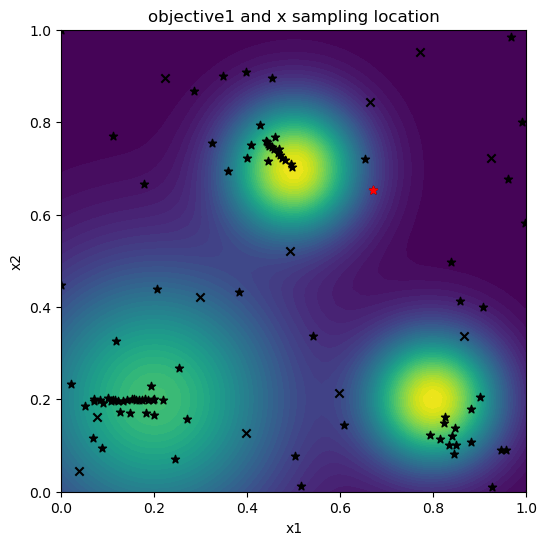

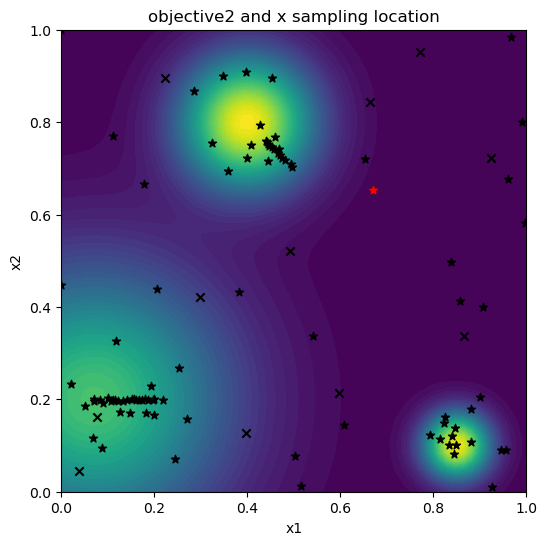

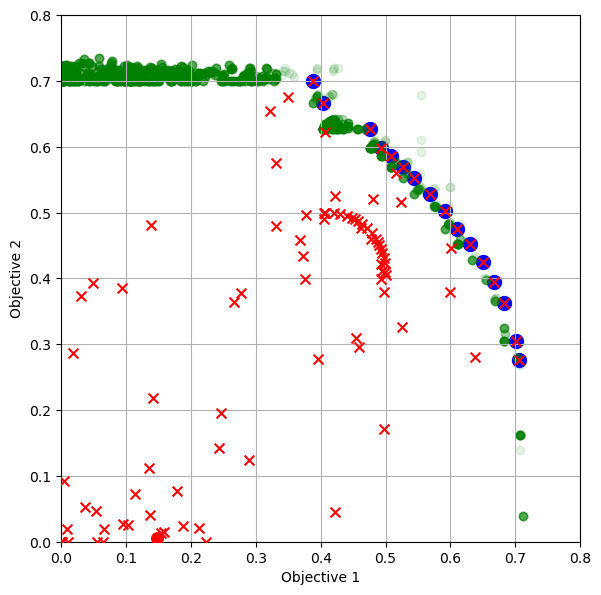

Iteration: 94
new candidats: tensor([[0.3190, 0.2985]], dtype=torch.float64)
new obj: tensor([[0.3710, 0.2040]], dtype=torch.float64)
Hypervolume (qPES): [0.16870769]
Time: 2.6954750709992368


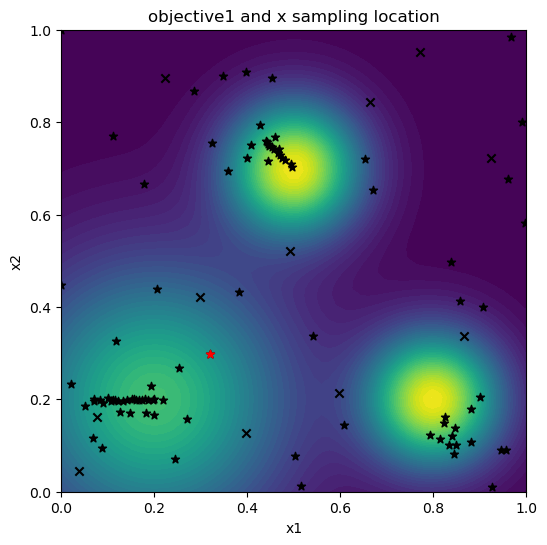

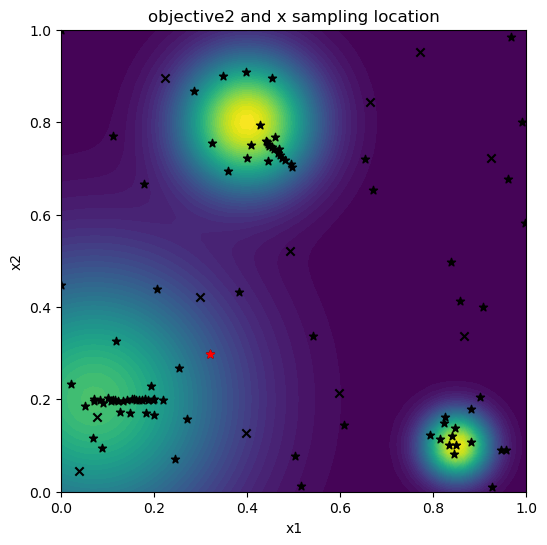

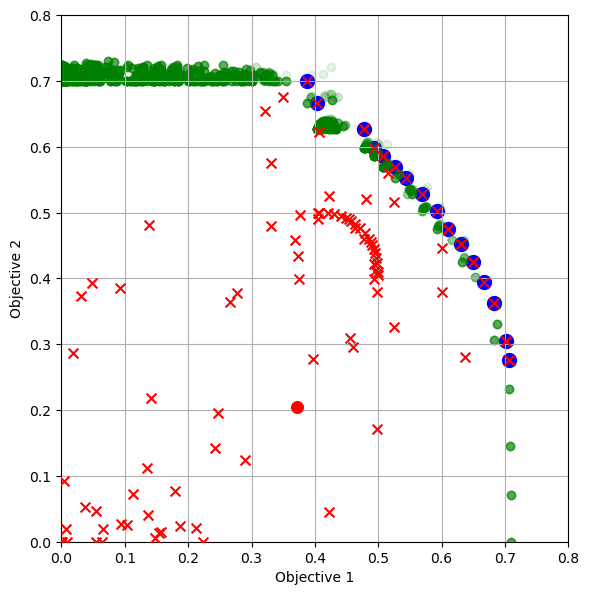

Iteration: 95
new candidats: tensor([[0.4305, 0.7721]], dtype=torch.float64)
new obj: tensor([[0.4284, 0.6443]], dtype=torch.float64)
Hypervolume (qPES): [0.16913614]
Time: 2.763508488002117


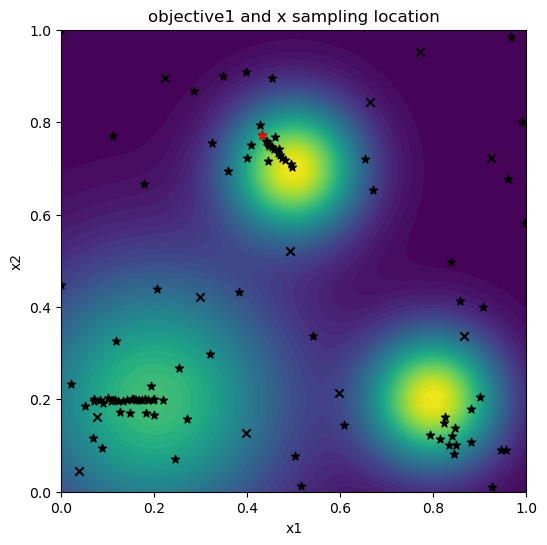

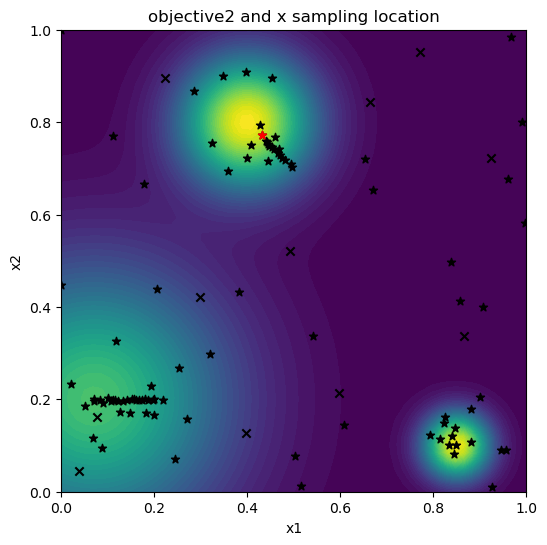

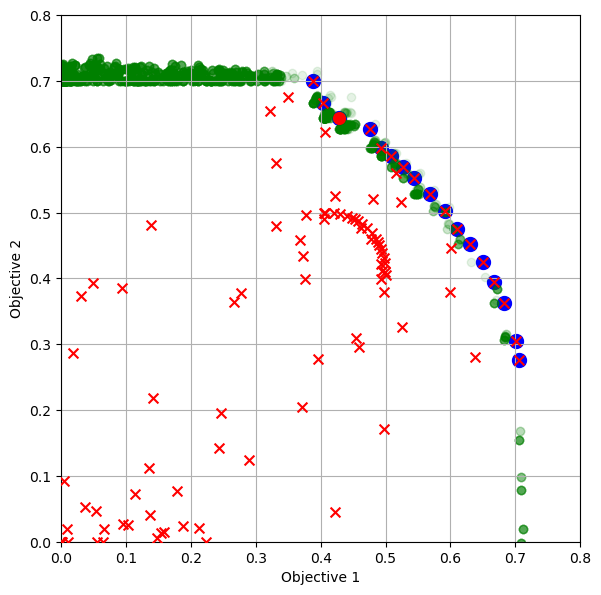

Iteration: 96
new candidats: tensor([[0.7671, 0.2308]], dtype=torch.float64)
new obj: tensor([[0.6412, 0.0069]], dtype=torch.float64)
Hypervolume (qPES): [0.16913614]
Time: 2.7712840769963805


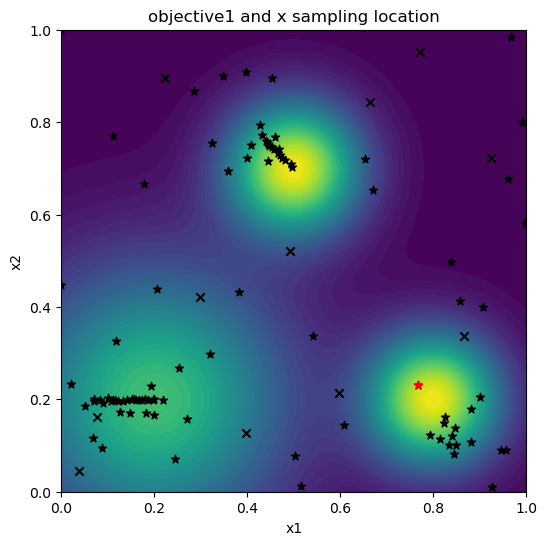

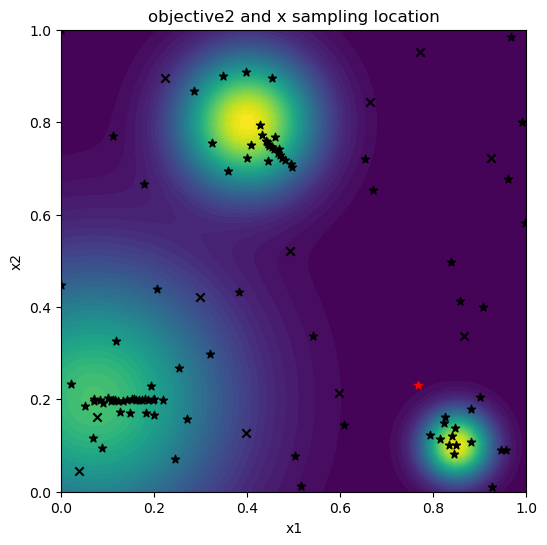

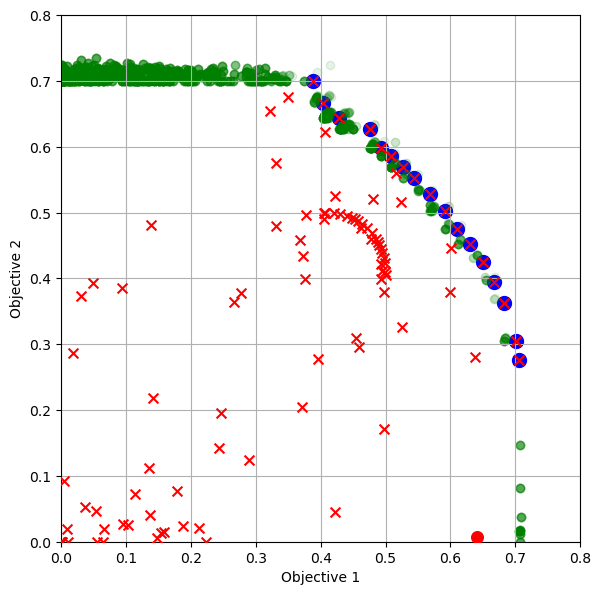

Iteration: 97
new candidats: tensor([[0.1754, 0.0843]], dtype=torch.float64)
new obj: tensor([[0.4198, 0.3681]], dtype=torch.float64)
Hypervolume (qPES): [0.16913614]
Time: 2.7546759960096097


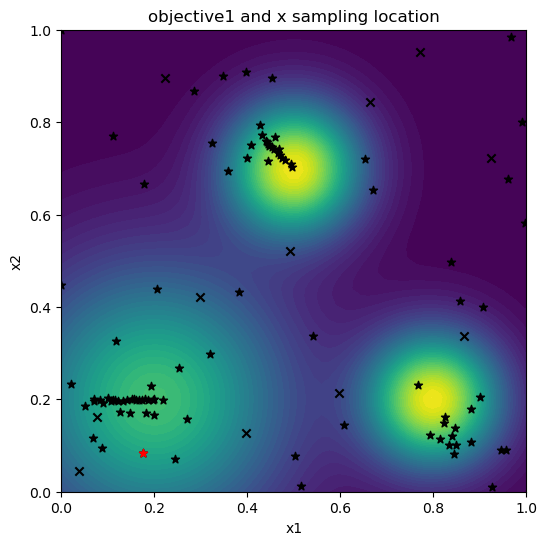

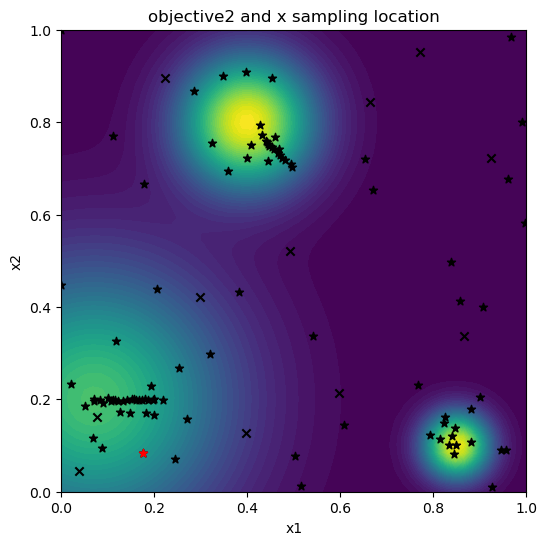

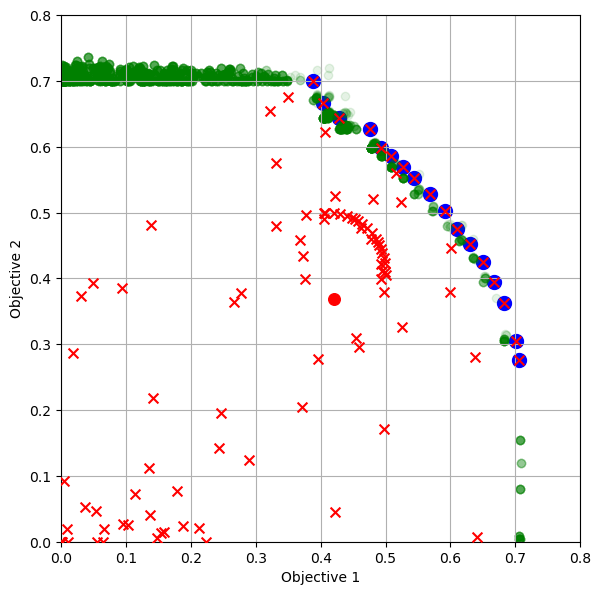

Iteration: 98
new candidats: tensor([[0.4497, 0.7382]], dtype=torch.float64)
new obj: tensor([[0.5795, 0.5134]], dtype=torch.float64)
Hypervolume (qPES): [0.16925352]
Time: 2.8591096659947652


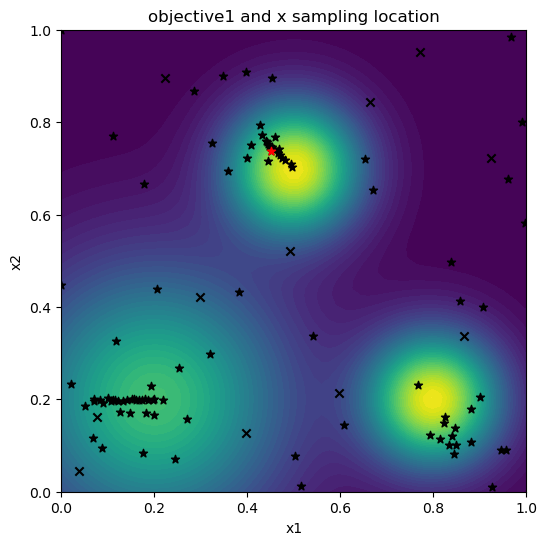

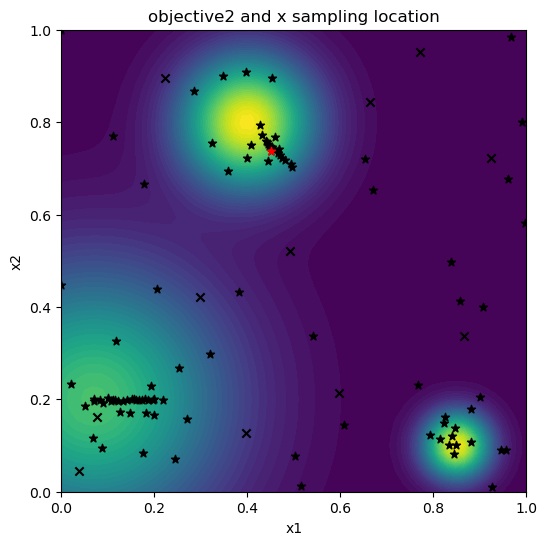

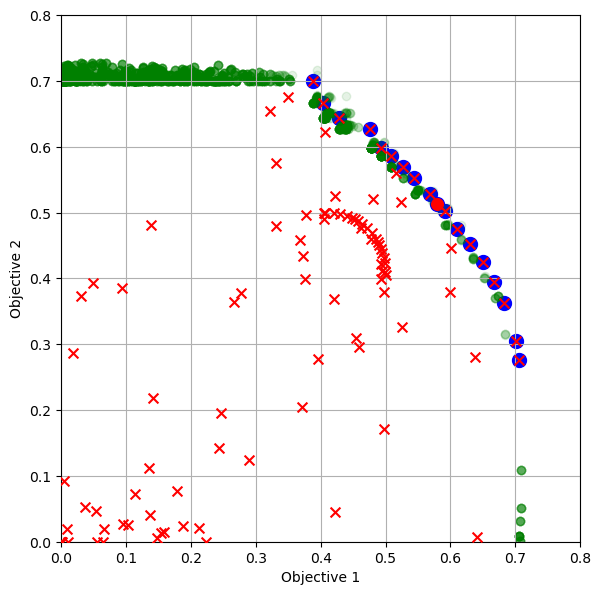

Iteration: 99
new candidats: tensor([[0.3781, 0.7918]], dtype=torch.float64)
new obj: tensor([[0.2227, 0.6831]], dtype=torch.float64)
Hypervolume (qPES): [0.16925352]
Time: 2.847112699993886


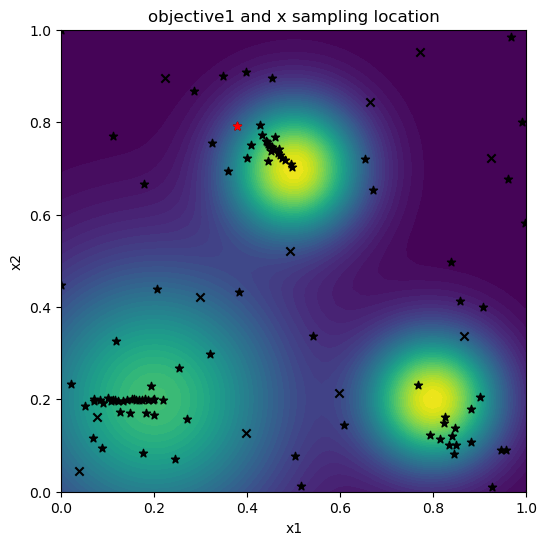

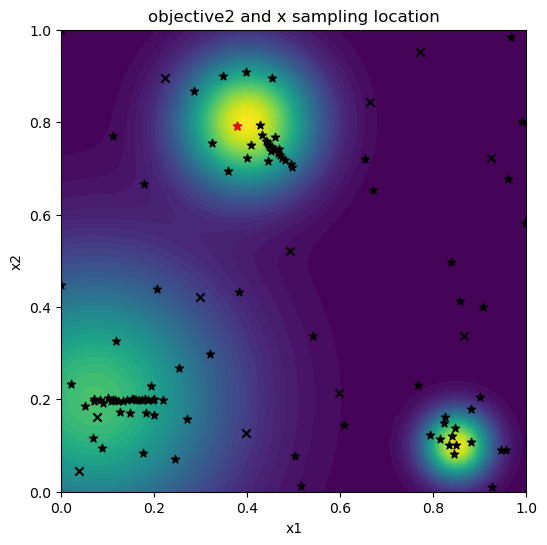

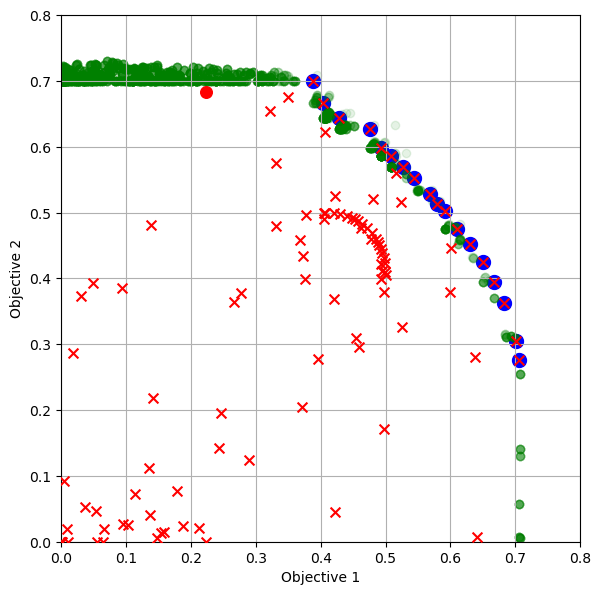

Iteration: 100
new candidats: tensor([[0.4852, 0.7132]], dtype=torch.float64)
new obj: tensor([[0.6931, 0.3361]], dtype=torch.float64)
Hypervolume (qPES): [0.16957563]
Time: 2.968432612993638


In [20]:
### import torch
import gpytorch
from matplotlib import pyplot as plt
import pandas as pd
from pyDOE import *
import random
warnings.filterwarnings("ignore")
rep=20 #Set trial number
itr=100
N_dim=2
N_test=1000
# Should be 100, 10 is for testing
#N_alt=100
N_alt=10
N_samp=1
N_obj=2
MC_SAMPLES = 128
BATCH_SIZE = 1
#chosen_acq='EHVI'
#chosen_acq='EHVI_Botorch'
#chosen_acq='PES_Botorch'
chosen_acq='NRFS_Botorch'
#chosen_acq='TPE_Optuna'
#chosen_acq='RS_Botorch'


hv_total=[]
edmin_total = []
exploration_total = []
exploitation_total = []

#for j in range(rep):
for j in range(10, 11):
    train_x_nrfs, train_y_nrfs, _ = generate_initial_data(seed=j)
    data_x_nrfs=train_x_nrfs.detach().numpy()
    data_y_nrfs=train_y_nrfs.detach().numpy()
    train_x_nrfs=torch.tensor(train_x_nrfs).to(**tkwargs)
    train_y_nrfs=torch.tensor(train_y_nrfs).to(**tkwargs)
    mll_nrfs, model_nrfs = initialize_model(train_x_nrfs, train_y_nrfs)
    
    
    X_test_all=lhs(N_dim,N_test)
    X_test_all=torch.tensor(X_test_all)
    X_test_all_unnormalized=unnormalize(X_test_all, problem.bounds)
    Y_test_all = problem(X_test_all_unnormalized)
    X_test_all = torch.tensor(X_test_all).to(**tkwargs)
    
    
    # Find PF ground truth and calculate HV
    pareto_mask_test_all = is_non_dominated(Y_test_all)
    Y_pf = Y_test_all[pareto_mask_test_all]  
    bd_test_all = DominatedPartitioning(ref_point=problem.ref_point, Y=Y_pf)
    volume_test_all = bd_test_all.compute_hypervolume().item()
    
    # Initialize edmin
    X_pf = torch.tensor(X_test_all[pareto_mask_test_all]).to(**tkwargs) 
    edmin = distance_XX(train_x_nrfs, X_pf).reshape(1,1)
    
    # Initialize hv
    pareto_mask_train = is_non_dominated(train_y_nrfs)
    Y_pf_train = train_y_nrfs[pareto_mask_train] 
    bd_train = DominatedPartitioning(ref_point=problem.ref_point, Y=Y_pf_train)
    hv_truth = np.array(bd_train.compute_hypervolume().item()).reshape(1,1)   
    
    iteration=0
    if chosen_acq == 'NRFS_Botorch':
    
        while iteration<itr:
            plot_X_PF(train_x_nrfs, BATCH_SIZE)
            iteration += 1
            t0 = time.monotonic()
            
            # Candidates initialization
            #X_test=lhs(N_dim,N_alt)
            #X_test=torch.tensor(X_test)
            #X_test_unnormalized=unnormalize(X_test, problem.bounds)
            # Fit the models
            fit_gpytorch_mll(mll_nrfs)
            
            # Define the qEHVI acquisition module using a QMC sampler
            nrfs_sampler = SobolQMCNormalSampler(sample_shape=torch.Size([MC_SAMPLES]))

            # Optimize acquisition function and get new observations
            new_x_nrfs, new_y_nrfs, new_y_true_nrfs = optimize_qehvi_and_get_observation(
                model_nrfs, train_x_nrfs, train_y_nrfs, nrfs_sampler, BATCH_SIZE
            )

            # Update training points
            train_x_nrfs = torch.cat([train_x_nrfs, torch.tensor(new_x_nrfs).to(**tkwargs).reshape(-1, N_dim)])
            train_y_nrfs = torch.cat([train_y_nrfs, torch.tensor(new_y_nrfs).to(**tkwargs).reshape(-1, N_obj)])
            data_x_nrfs=train_x_nrfs.cpu().detach().numpy()
            data_y_nrfs=train_y_nrfs.cpu().detach().numpy()
            
            # Compute hypervolume
            pareto_mask_train = is_non_dominated(train_y_nrfs)
            Y_pf_train = train_y_nrfs[pareto_mask_train] 
            bd_train = DominatedPartitioning(ref_point=problem.ref_point, Y=Y_pf_train)
            hv_t = np.array(bd_train.compute_hypervolume().item())    
            hv_truth=np.concatenate((hv_truth,hv_t.reshape(1,1)))

            # Compute edmin
            ed_t = distance_XX(train_x_nrfs, X_pf).reshape(1,1)
            edmin = torch.cat((edmin, ed_t.reshape(1,1)))
            
            # Reinitialize the models for next iteration
            mll_nrfs, model_nrfs = initialize_model(train_x_nrfs, train_y_nrfs)
            t1 = time.monotonic()

            if verbose:
                print("Iteration:", iteration)
                print('new candidats:', new_x_nrfs) 
                print('new obj:', new_y_nrfs)
                print("Hypervolume (qPES):", hv_truth[-1])
                print("Time:", t1 - t0)
     
        pd.DataFrame(Y_pf_train).to_csv("y_pareto_truth"+str(j)+".csv", header=None, index=None)
        pd.DataFrame(data_x_nrfs).to_csv("data_x"+str(j)+".csv", header=None, index=None)
        pd.DataFrame(data_y_nrfs).to_csv("data_y"+str(j)+".csv", header=None, index=None)
        pd.DataFrame(hv_truth).to_csv("hv_truth"+str(j)+".csv", header=None, index=None)

        
    hv_total.append(np.ravel(hv_truth))
    pd.DataFrame(hv_total).to_csv("hv_truth_total"+str(rep)+".csv", header=None, index=None)

    edmin_total.append(np.ravel(edmin.cpu().detach().numpy()))
    pd.DataFrame(edmin_total).to_csv("edmin_total"+str(rep)+".csv", header=None, index=None)